In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import necessary library requirements
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import seaborn as sns
from math import sqrt
from sklearn.metrics import mean_squared_error

# **1.Data Understanding**

## 1.1. Data Collection:
- Nguồn từ Kaggle: Retail Store Inventory Forecasting Dataset
- [Link](https://www.kaggle.com/datasets/anirudhchauhan/retail-store-inventory-forecasting-dataset)



In [ ]:
file_path = "/content/drive/MyDrive/UEL/KÌ 6/Data Solution/New folder/retail_store_inventory.csv"
data = pd.read_csv(file_path, encoding='unicode_escape')

## 1.2. Data Description

In [ ]:
data.shape

(73100, 15)

In [ ]:
data.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer


**Key Data Features:**
  - Date: Daily records from [start_date] to [end_date].
  - Store ID & Product ID: Unique identifiers for stores and products.
  - Category: Product categories like Electronics, Clothing, Groceries, etc.
  - Region: Geographic region of the store.
  - Inventory Level: Stock available at the beginning of the day.
  - Units Sold: Units sold during the day.
  - Demand Forecast: Predicted demand based on past trends.
  - Weather Condition: Daily weather impacting sales.
  - Holiday/Promotion: Indicators for holidays or promotions.

In [ ]:
data.dtypes

,0
Date,object
Store ID,object
Product ID,object
Category,object
Region,object
Inventory Level,int64
Units Sold,int64
Units Ordered,int64
Demand Forecast,float64
Price,float64


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [ ]:
data

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,2024-01-01,S005,P0016,Furniture,East,96,8,127,18.46,73.73,20,Snowy,0,72.45,Winter
73096,2024-01-01,S005,P0017,Toys,North,313,51,101,48.43,82.57,10,Cloudy,0,83.78,Autumn
73097,2024-01-01,S005,P0018,Clothing,West,278,36,151,39.65,11.11,10,Rainy,0,10.91,Winter
73098,2024-01-01,S005,P0019,Toys,East,374,264,21,270.52,53.14,20,Rainy,0,55.80,Spring


In [ ]:
data.describe()

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000
mean,274.469877,136.464870,110.004473,141.494720,55.135108,10.009508,0.497305,55.146077
std,129.949514,108.919406,52.277448,109.254076,26.021945,7.083746,0.499996,26.191408
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,162.000000,49.000000,65.000000,53.670000,32.650000,5.000000,0.000000,32.680000
50%,273.000000,107.000000,110.000000,113.015000,55.050000,10.000000,0.000000,55.010000
75%,387.000000,203.000000,155.000000,208.052500,77.860000,15.000000,1.000000,77.820000
max,500.000000,499.000000,200.000000,518.550000,100.000000,20.000000,1.000000,104.940000


In [ ]:
data.isna().sum()

,0
Date,0
Store ID,0
Product ID,0
Category,0
Region,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Demand Forecast,0
Price,0


In [ ]:
data.duplicated().sum()

0

In [ ]:
# Đổi tên để bớt rườm rà lúc xử lý, phần này kh cần xác định nó nằm phần nào đâu ha
data = data.rename(columns={'Inventory Level': 'Inventory',
                        'Units Sold': 'Sales_Quantity',
                        'Units Ordered': 'Orders_Quantity',
                        'Weather Condition': 'Weather',
                        'Holiday/Promotion': 'Promotion',})

In [ ]:
region_store_mapping = data.groupby('Product ID')['Category'].unique()
print(region_store_mapping)

Product ID
P0001    [Groceries, Toys, Electronics, Clothing, Furni...
P0002    [Toys, Clothing, Electronics, Furniture, Groce...
P0003    [Toys, Furniture, Groceries, Clothing, Electro...
P0004    [Toys, Groceries, Furniture, Electronics, Clot...
P0005    [Electronics, Toys, Clothing, Groceries, Furni...
P0006    [Groceries, Furniture, Electronics, Toys, Clot...
P0007    [Furniture, Groceries, Electronics, Clothing, ...
P0008    [Clothing, Electronics, Toys, Furniture, Groce...
P0009    [Electronics, Clothing, Groceries, Furniture, ...
P0010    [Toys, Electronics, Groceries, Clothing, Furni...
P0011    [Furniture, Groceries, Toys, Electronics, Clot...
P0012    [Clothing, Groceries, Electronics, Furniture, ...
P0013    [Toys, Clothing, Furniture, Electronics, Groce...
P0014    [Clothing, Electronics, Furniture, Toys, Groce...
P0015    [Clothing, Toys, Furniture, Electronics, Groce...
P0016    [Electronics, Toys, Groceries, Clothing, Furni...
P0017    [Toys, Groceries, Clothing, Electron

In [ ]:
region_store_mapping = data.groupby('Store ID')['Product ID'].unique()
print(region_store_mapping)

Store ID
S001    [P0001, P0002, P0003, P0004, P0005, P0006, P00...
S002    [P0001, P0002, P0003, P0004, P0005, P0006, P00...
S003    [P0001, P0002, P0003, P0004, P0005, P0006, P00...
S004    [P0001, P0002, P0003, P0004, P0005, P0006, P00...
S005    [P0001, P0002, P0003, P0004, P0005, P0006, P00...
Name: Product ID, dtype: object


In [ ]:
data['Category'].unique()

array(['Groceries', 'Toys', 'Electronics', 'Furniture', 'Clothing'],
      dtype=object)

In [ ]:
data['Region'].unique()

array(['North', 'South', 'West', 'East'], dtype=object)

# **2.EDA**

- Theo link này: https://blog.tomorrowmarketers.org/exploratory-data-analysis-la-gi/
- Và theo tham khảo Kaggle nên t sẽ chia làm 3 phần trong eda gồm univariate, Bivariate, Multivariate analysis

## 2.1. Univariate Analysis

In [ ]:
numarical_columns = ['Inventory','Sales_Quantity','Orders_Quantity','Price','Discount','Competitor Pricing']

for col in numarical_columns:
    fig = px.box(data, x=col)
    fig.update_layout(height=400, width=800, title_text=col)
    fig.show()

### a. Category

In [ ]:
CategoryCounts = data['Category'].value_counts().reset_index()
CategoryCounts

,Category,count
0,Furniture,14699
1,Toys,14643
2,Clothing,14626
3,Groceries,14611
4,Electronics,14521


In [ ]:
fig = px.bar(CategoryCounts,
             x='Category',
             y='count',
             title='<b>Distribution of Category by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#17becf']
             )
fig.show()


### b. Region

In [ ]:
RegionCounts = data['Region'].value_counts().reset_index()
RegionCounts

,Region,count
0,East,18349
1,South,18297
2,North,18228
3,West,18226


In [ ]:
fig = px.bar(RegionCounts,
             x='Region',
             y='count',
             title='<b>Distribution of Region by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#bcbd22']
             )
fig.show()


### c. Inventory

In [ ]:
InventoryDes = data['Inventory'].describe()
InventoryDes

,Inventory
count,73100.000000
mean,274.469877
std,129.949514
min,50.000000
25%,162.000000
50%,273.000000
75%,387.000000
max,500.000000


In [ ]:
fig = px.histogram(data,
                   x='Inventory',
                   nbins=15,
                   title='<b>Inventory Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['brown']
                   )

fig.show()

### d. Sales Quantity

In [ ]:
SalesDes = data['Sales_Quantity'].describe()
SalesDes

,Sales_Quantity
count,73100.000000
mean,136.464870
std,108.919406
min,0.000000
25%,49.000000
50%,107.000000
75%,203.000000
max,499.000000


In [ ]:
fig = px.histogram(data,
                   x='Sales_Quantity',
                   nbins=20,
                   title='<b>Sales_Quantity Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['grey']
                   )

fig.show()


### e. Order Quantity

In [ ]:
OrdersDes = data['Orders_Quantity'].describe()
OrdersDes

,Orders_Quantity
count,73100.000000
mean,110.004473
std,52.277448
min,20.000000
25%,65.000000
50%,110.000000
75%,155.000000
max,200.000000


In [ ]:
fig = px.histogram(data,
                   x='Orders_Quantity',
                   nbins=15,
                   title='<b>Orders Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['pink']
                   )

fig.show()


### f. Holiday

In [ ]:
PromotionCounts = data['Promotion'].value_counts().reset_index()
PromotionCounts

,Promotion,count
0,0,36747
1,1,36353


In [ ]:
fig = px.pie(PromotionCounts,
             names='Promotion',
             values='count',
             title='<b>Promotion Distribution<b>',
             width=1000,
             color_discrete_sequence=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
             )

fig.show()

### g. Weather

In [ ]:
WeatherCounts = data['Weather'].value_counts().reset_index()
WeatherCounts

,Weather,count
0,Sunny,18290
1,Rainy,18278
2,Snowy,18272
3,Cloudy,18260


In [ ]:
fig = px.bar(WeatherCounts,
             x='Weather',
             y='count',
             title='<b>Distribution of Weather by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#9467bd']
             )
fig.show()


### h. Seasonality

In [ ]:
SeasonalityCounts = data['Seasonality'].value_counts().reset_index()
SeasonalityCounts

,Seasonality,count
0,Spring,18317
1,Summer,18305
2,Winter,18285
3,Autumn,18193


In [ ]:
fig = px.bar(SeasonalityCounts,
             x='Seasonality',
             y='count',
             title='<b>Distribution of Seasonality by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#e377c2']
             )
fig.show()


### i. Price

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])

# Extract the year and add it as a new column
data['Year'] = data['Date'].dt.year

# Display the updated DataFrame
print(data.head())


        Date Store ID Product ID     Category Region  Inventory  \
0 2022-01-01     S001      P0001    Groceries  North        231   
1 2022-01-01     S001      P0002         Toys  South        204   
2 2022-01-01     S001      P0003         Toys   West        102   
3 2022-01-01     S001      P0004         Toys  North        469   
4 2022-01-01     S001      P0005  Electronics   East        166   

   Sales_Quantity  Orders_Quantity  Demand Forecast  Price  Discount Weather  \
0             127               55           135.47  33.50        20   Rainy   
1             150               66           144.04  63.01        20   Sunny   
2              65               51            74.02  27.99        10   Sunny   
3              61              164            62.18  32.72        10  Cloudy   
4              14              135             9.26  73.64         0   Sunny   

   Promotion  Competitor Pricing Seasonality  Year  
0          0               29.69      Autumn  2022  
1         

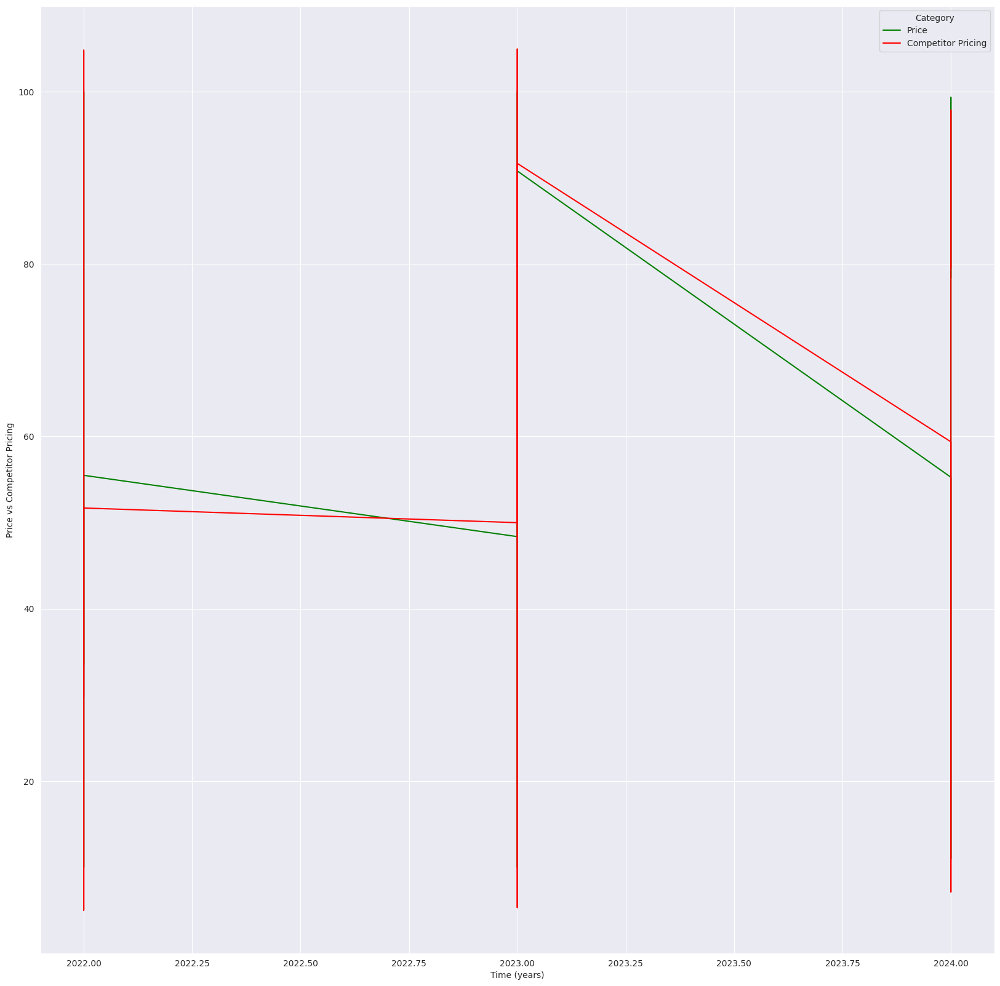

In [ ]:
sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(20, 20))

ax.plot(data["Year"], data["Price"], label="Price", color="green")
ax.plot(data["Year"], data["Competitor Pricing"], label="Competitor Pricing", color="red")

ax.set_xlabel("Time (years)")
ax.set_ylabel("Price vs Competitor Pricing")

plt.legend(title="Category")

plt.show()


## 2.2. Bivariate Analysis:
**Tập trung analyze giữa Quantity với các biến còn lại**

In [ ]:
data['Quantity']=data['Sales_Quantity'] + data['Orders_Quantity']
data['Quantity']=data['Quantity'].astype(int)

In [ ]:
data['Date'].astype('datetime64[ns]')

,Date
0,2022-01-01
1,2022-01-01
2,2022-01-01
3,2022-01-01
4,2022-01-01
...,...
73095,2024-01-01
73096,2024-01-01
73097,2024-01-01
73098,2024-01-01


In [ ]:
# Convert date formate to month
data['Date_Month'] = data['Date'].dt.strftime('%b')
data.head()


,Date,Store ID,Product ID,Category,Region,Inventory,Sales_Quantity,Orders_Quantity,Demand Forecast,Price,Discount,Weather,Promotion,Competitor Pricing,Seasonality,Year,Quantity,Date_Month
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn,2022,182,Jan
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn,2022,216,Jan
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer,2022,116,Jan
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn,2022,225,Jan
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer,2022,149,Jan


In [ ]:
# Pivot the DataFrame based on SubCat of drugs
data_pivoted = data.pivot_table(index="Product ID", columns="Date_Month", values="Sales_Quantity")
# Result
data_pivoted

Date_Month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
Product ID,,,,,,,,,,,,
P0001,134.670000,136.796774,138.070968,135.003571,126.628571,137.419355,138.246667,129.809677,127.812903,139.566667,137.293548,154.646667
P0002,127.626667,131.354839,136.993548,139.210714,133.098413,140.661290,146.746667,142.019355,127.067742,131.953333,124.309677,120.926667
P0003,132.486667,139.880645,132.870968,140.914286,129.012698,143.129032,130.680000,140.603226,136.167742,129.743333,129.903226,134.396667
P0004,133.700000,125.500000,131.777419,149.614286,139.203175,131.229032,134.630000,138.719355,132.003226,140.523333,135.167742,136.136667
P0005,134.946667,137.170968,139.783871,129.475000,145.142857,134.016129,149.663333,133.919355,136.235484,137.196667,137.396774,137.970000
P0006,132.453333,130.019355,127.590323,134.210714,135.673016,132.603226,140.640000,145.512903,129.493548,138.143333,143.277419,142.700000
P0007,144.003333,135.348387,137.451613,137.535714,141.984127,131.854839,133.856667,136.525806,138.793548,136.596667,136.800000,128.496667
P0008,132.180000,142.635484,124.535484,134.742857,123.320635,147.474194,139.873333,133.319355,133.703226,137.896667,130.983871,123.606667
P0009,130.403333,135.380645,145.064516,134.671429,127.266667,143.448387,132.156667,130.500000,145.183871,141.470000,148.148387,134.283333


In [ ]:
print(data['Date'].min())
print(data['Date'].max())

2022-01-01 00:00:00
2024-01-01 00:00:00


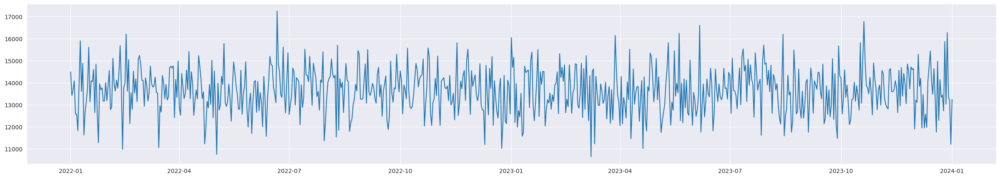

In [ ]:
df = data[['Date', 'Sales_Quantity']]
df = df.groupby('Date').agg({'Sales_Quantity':'sum'}).reset_index()

plt.figure(figsize=(30,5))
plt.plot(df.Date, df.Sales_Quantity)
plt.show()

Quantity có tính mùa vụ rõ ràng

## 2.3. Multivariate Analysis

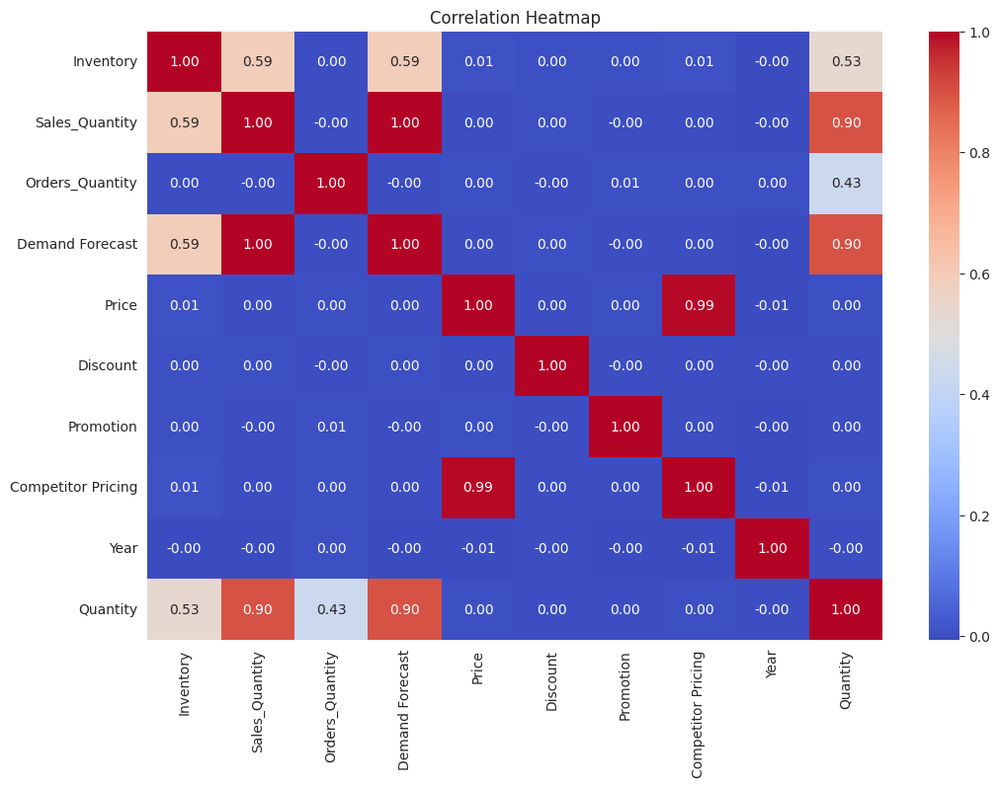

In [ ]:
# Select numeric columns
numeric_df = data.select_dtypes(include=[np.number])

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


# **3. Data Pre-Processing**

In [ ]:
df = pd.DataFrame(data)

# Mapping category sang ký tự đầu của Product ID
category_mapping = {
    'Groceries': 'G',
    'Toys': 'T',
    'Electronics': 'E',
    'Furniture': 'F',
    'Clothing': 'C'
}

# Đổi Product ID theo category
df["Product ID"] = df["Category"].map(category_mapping) + df["Product ID"].str[1:]

# Hiển thị kết quả
print(df)

            Date Store ID Product ID     Category Region  Inventory  \
0     2022-01-01     S001      G0001    Groceries  North        231   
1     2022-01-01     S001      T0002         Toys  South        204   
2     2022-01-01     S001      T0003         Toys   West        102   
3     2022-01-01     S001      T0004         Toys  North        469   
4     2022-01-01     S001      E0005  Electronics   East        166   
...          ...      ...        ...          ...    ...        ...   
73095 2024-01-01     S005      F0016    Furniture   East         96   
73096 2024-01-01     S005      T0017         Toys  North        313   
73097 2024-01-01     S005      C0018     Clothing   West        278   
73098 2024-01-01     S005      T0019         Toys   East        374   
73099 2024-01-01     S005      G0020    Groceries   East        117   

       Sales_Quantity  Orders_Quantity  Demand Forecast  Price  Discount  \
0                 127               55           135.47  33.50        2

In [ ]:
# Mapping region sang ký tự đầu của Store ID
region_mapping = {
    'North': 'N',
    'South': 'S',
    'West': 'W',
    'East': 'E'
}

# Đổi Store ID theo Region
df["Store ID"] = df["Region"].map(region_mapping) + df["Store ID"].str[1:]

# Hiển thị kết quả
print(df)


            Date Store ID Product ID     Category Region  Inventory  \
0     2022-01-01     N001      G0001    Groceries  North        231   
1     2022-01-01     S001      T0002         Toys  South        204   
2     2022-01-01     W001      T0003         Toys   West        102   
3     2022-01-01     N001      T0004         Toys  North        469   
4     2022-01-01     E001      E0005  Electronics   East        166   
...          ...      ...        ...          ...    ...        ...   
73095 2024-01-01     E005      F0016    Furniture   East         96   
73096 2024-01-01     N005      T0017         Toys  North        313   
73097 2024-01-01     W005      C0018     Clothing   West        278   
73098 2024-01-01     E005      T0019         Toys   East        374   
73099 2024-01-01     E005      G0020    Groceries   East        117   

       Sales_Quantity  Orders_Quantity  Demand Forecast  Price  Discount  \
0                 127               55           135.47  33.50        2

In [ ]:
data = pd.DataFrame(df)

In [ ]:
data

,Date,Store ID,Product ID,Category,Region,Inventory,Sales_Quantity,Orders_Quantity,Demand Forecast,Price,Discount,Weather,Promotion,Competitor Pricing,Seasonality,Year,Quantity,Date_Month
0,2022-01-01,N001,G0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn,2022,182,Jan
1,2022-01-01,S001,T0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn,2022,216,Jan
2,2022-01-01,W001,T0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer,2022,116,Jan
3,2022-01-01,N001,T0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn,2022,225,Jan
4,2022-01-01,E001,E0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer,2022,149,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,2024-01-01,E005,F0016,Furniture,East,96,8,127,18.46,73.73,20,Snowy,0,72.45,Winter,2024,135,Jan
73096,2024-01-01,N005,T0017,Toys,North,313,51,101,48.43,82.57,10,Cloudy,0,83.78,Autumn,2024,152,Jan
73097,2024-01-01,W005,C0018,Clothing,West,278,36,151,39.65,11.11,10,Rainy,0,10.91,Winter,2024,187,Jan
73098,2024-01-01,E005,T0019,Toys,East,374,264,21,270.52,53.14,20,Rainy,0,55.80,Spring,2024,285,Jan


In [ ]:
df_grouped_ml = data[['Date','Sales_Quantity']]

In [ ]:
df_grouped_ml['Date_Month'] = df_grouped_ml['Date'].dt.to_period('M')  # Chuyển thành YYYY-MM
df_grouped_ml = df_grouped_ml.groupby('Date_Month', as_index=False).sum(numeric_only=True)

<ipython-input-300-956ebfeb86ea>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_grouped_ml = df_grouped_ml[df_grouped_ml['Date_Month'] < '2024-01']

# **4.Model Construction**

## 4.1. Machine Learning

### 4.1.1. Feature Engineering

In [ ]:
import pandas as pd
from sklearn.feature_selection import RFE

In [ ]:
# import random forest regression from scikit-learn to perform regression model
from sklearn.ensemble import RandomForestRegressor
from pandas import DataFrame
import numpy as np
from datetime import timedelta

In [ ]:
df_grouped_ml

,Date_Month,Sales_Quantity
0,2022-01,419938
1,2022-02,391052
2,2022-03,426073
3,2022-04,407380
4,2022-05,414799
5,2022-06,415509
6,2022-07,426628
7,2022-08,424916
8,2022-09,411610
9,2022-10,426863


#### a. Create Lag Features

In [ ]:
## Stationary Testing ( <0.05 --> oke)
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(df_grouped_ml['Sales_Quantity'])
print('p-value: %f' % result[1])

p-value: 0.000000


In [ ]:

# Dịch chuyển dữ liệu quá khứ (Shifting)
df_grouped_ml.loc[:, 'Quantity_LastMonth'] = df_grouped_ml['Sales_Quantity'].shift(1)
df_grouped_ml.loc[:, 'Quantity_2Monthsback'] = df_grouped_ml['Sales_Quantity'].shift(2)
df_grouped_ml.loc[:, 'Quantity_3Monthsback'] = df_grouped_ml['Sales_Quantity'].shift(3)

# Kiểm tra lại dữ liệu
print(df_grouped_ml.head())


  Date_Month  Sales_Quantity  Quantity_LastMonth  Quantity_2Monthsback  \
0    2022-01          419938                 NaN                   NaN   
1    2022-02          391052            419938.0                   NaN   
2    2022-03          426073            391052.0              419938.0   
3    2022-04          407380            426073.0              391052.0   
4    2022-05          414799            407380.0              426073.0   

   Quantity_3Monthsback  
0                   NaN  
1                   NaN  
2                   NaN  
3              419938.0  
4              391052.0  


In [ ]:
final_data=df_grouped_ml.copy()

#### b. One hot Encoding

In [ ]:

# Trích xuất tháng từ Date
final_data['Month'] = final_data['Date_Month'].dt.month

# Tạo biến one-hot encoding theo tháng
dummy = pd.get_dummies(final_data['Month'], prefix='Month')

# Gộp dữ liệu với biến dummy
final_data = pd.concat([final_data, dummy], axis=1)

In [ ]:
final_data

,Date_Month,Sales_Quantity,Quantity_LastMonth,Quantity_2Monthsback,Quantity_3Monthsback,Month,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,2022-01,419938,NaN,NaN,NaN,1,True,False,False,False,False,False,False,False,False,False,False,False
1,2022-02,391052,419938.0,NaN,NaN,2,False,True,False,False,False,False,False,False,False,False,False,False
2,2022-03,426073,391052.0,419938.0,NaN,3,False,False,True,False,False,False,False,False,False,False,False,False
3,2022-04,407380,426073.0,391052.0,419938.0,4,False,False,False,True,False,False,False,False,False,False,False,False
4,2022-05,414799,407380.0,426073.0,391052.0,5,False,False,False,False,True,False,False,False,False,False,False,False
5,2022-06,415509,414799.0,407380.0,426073.0,6,False,False,False,False,False,True,False,False,False,False,False,False
6,2022-07,426628,415509.0,414799.0,407380.0,7,False,False,False,False,False,False,True,False,False,False,False,False
7,2022-08,424916,426628.0,415509.0,414799.0,8,False,False,False,False,False,False,False,True,False,False,False,False
8,2022-09,411610,424916.0,426628.0,415509.0,9,False,False,False,False,False,False,False,False,True,False,False,False
9,2022-10,426863,411610.0,424916.0,426628.0,10,False,False,False,False,False,False,False,False,False,True,False,False


In [ ]:
finaldf = final_data.drop(['Date_Month', 'Month'], axis=1)

In [ ]:
finaldf

,Sales_Quantity,Quantity_LastMonth,Quantity_2Monthsback,Quantity_3Monthsback,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,419938,NaN,NaN,NaN,True,False,False,False,False,False,False,False,False,False,False,False
1,391052,419938.0,NaN,NaN,False,True,False,False,False,False,False,False,False,False,False,False
2,426073,391052.0,419938.0,NaN,False,False,True,False,False,False,False,False,False,False,False,False
3,407380,426073.0,391052.0,419938.0,False,False,False,True,False,False,False,False,False,False,False,False
4,414799,407380.0,426073.0,391052.0,False,False,False,False,True,False,False,False,False,False,False,False
5,415509,414799.0,407380.0,426073.0,False,False,False,False,False,True,False,False,False,False,False,False
6,426628,415509.0,414799.0,407380.0,False,False,False,False,False,False,True,False,False,False,False,False
7,424916,426628.0,415509.0,414799.0,False,False,False,False,False,False,False,True,False,False,False,False
8,411610,424916.0,426628.0,415509.0,False,False,False,False,False,False,False,False,True,False,False,False
9,426863,411610.0,424916.0,426628.0,False,False,False,False,False,False,False,False,False,True,False,False


### 4.1.2. Model Construction

In [ ]:
test_length = int(0.2 * len(finaldf))  # Lấy 20% số dòng của finaldf
end_point = len(finaldf)
x = end_point - test_length
finaldf_train = finaldf.loc[:x - 1, :]
finaldf_test = finaldf.loc[x:, :]
finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != 'Sales_Quantity']
finaldf_test_y = finaldf_test['Sales_Quantity']
finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != 'Sales_Quantity']
finaldf_train_y = finaldf_train['Sales_Quantity']
print("Starting model train..")
finaldf_train_x.columns = finaldf_train_x.columns.astype(str)
finaldf_test_x.columns = finaldf_test_x.columns.astype(str)
rf = RandomForestRegressor(n_estimators=100, random_state=1)
# Khởi tạo RFE với số đặc trưng mong muốn (4 đặc trưng)
rfe = RFE(estimator=rf, n_features_to_select=4)

fit = rfe.fit(finaldf_train_x, finaldf_train_y)
y_pred = fit.predict(finaldf_test_x)

Starting model train..


In [ ]:
finaldf.columns

Index(['Sales_Quantity', 'Quantity_LastMonth', 'Quantity_2Monthsback',
       'Quantity_3Monthsback', 'Month_1', 'Month_2', 'Month_3', 'Month_4',
       'Month_5', 'Month_6', 'Month_7', 'Month_8', 'Month_9', 'Month_10',
       'Month_11', 'Month_12'],
      dtype='object')

In [ ]:
y_true = np.array(finaldf_test['Sales_Quantity'])  # Hoặc dùng finaldf_test_y nếu có
sumvalue = np.sum(y_true)
mape = np.sum(np.abs((y_true - y_pred))) / sumvalue * 100
accuracy = 100 - mape

print('Accuracy:', round(accuracy, 2), '%')


Accuracy: 99.24 %


In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Tính MSE
mse = mean_squared_error(y_true, y_pred)

# Tính RMSE
rmse = np.sqrt(mse)

print("Root Mean Squared Error (RMSE):", round(rmse, 2))


Root Mean Squared Error (RMSE): 5484.5


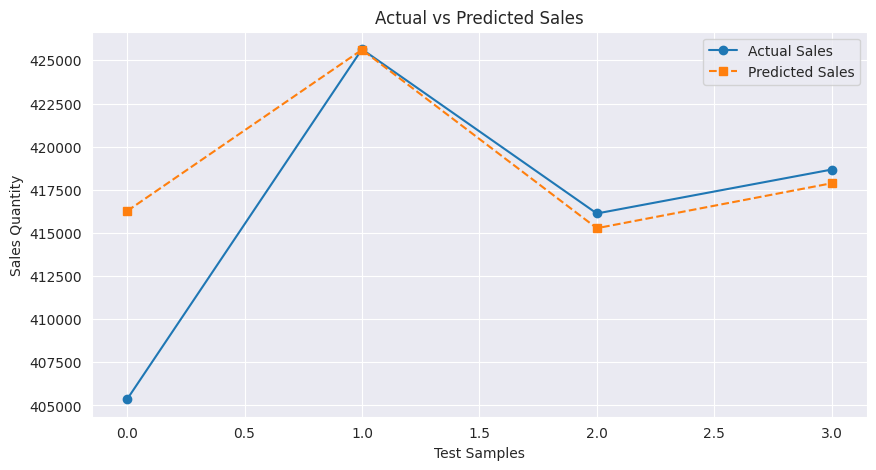

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(finaldf_test_y.values, label="Actual Sales", marker='o')
plt.plot(y_pred, label="Predicted Sales", marker='s', linestyle='dashed')

plt.xlabel("Test Samples")
plt.ylabel("Sales Quantity")
plt.title("Actual vs Predicted Sales")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Trích xuất tháng từ Date
df_grouped_ml['Month'] = df_grouped_ml['Date_Month'].dt.month

# Tạo biến one-hot encoding theo tháng
dummy = pd.get_dummies(df_grouped_ml['Month'], prefix='Month')

# Gộp dữ liệu với biến dummy
df_grouped_ml = pd.concat([df_grouped_ml, dummy], axis=1)
df_grouped_ml

,Date_Month,Sales_Quantity,Quantity_LastMonth,Quantity_2Monthsback,Quantity_3Monthsback,Month,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,2022-01,419938,NaN,NaN,NaN,1,True,False,False,False,False,False,False,False,False,False,False,False
1,2022-02,391052,419938.0,NaN,NaN,2,False,True,False,False,False,False,False,False,False,False,False,False
2,2022-03,426073,391052.0,419938.0,NaN,3,False,False,True,False,False,False,False,False,False,False,False,False
3,2022-04,407380,426073.0,391052.0,419938.0,4,False,False,False,True,False,False,False,False,False,False,False,False
4,2022-05,414799,407380.0,426073.0,391052.0,5,False,False,False,False,True,False,False,False,False,False,False,False
5,2022-06,415509,414799.0,407380.0,426073.0,6,False,False,False,False,False,True,False,False,False,False,False,False
6,2022-07,426628,415509.0,414799.0,407380.0,7,False,False,False,False,False,False,True,False,False,False,False,False
7,2022-08,424916,426628.0,415509.0,414799.0,8,False,False,False,False,False,False,False,True,False,False,False,False
8,2022-09,411610,424916.0,426628.0,415509.0,9,False,False,False,False,False,False,False,False,True,False,False,False
9,2022-10,426863,411610.0,424916.0,426628.0,10,False,False,False,False,False,False,False,False,False,True,False,False


In [ ]:
import pandas as pd

# Số tháng muốn dự báo
num_months_to_predict = 12

# Lấy dòng dữ liệu cuối cùng của tập test
last_row = finaldf_test_x.iloc[-1].copy()
last_row = last_row.loc[~last_row.index.duplicated()]
# Danh sách để lưu kết quả dự báo
future_predictions = []

for i in range(num_months_to_predict):
    # Tạo bản sao để không làm thay đổi dữ liệu gốc
    future_row = last_row.copy()

    # Dự báo giá trị tiếp theo
    future_prediction = fit.predict(pd.DataFrame([future_row]))[0]
    future_predictions.append(future_prediction)

    # Cập nhật các biến lagged
    future_row["Quantity_3Monthsback"] = future_row["Quantity_2Monthsback"]
    future_row["Quantity_2Monthsback"] = future_row["Quantity_LastMonth"]
    future_row["Quantity_LastMonth"] = future_prediction

    # Cập nhật dummy variables cho tháng
    month_idx = future_row[["Month_1", "Month_2", "Month_3", "Month_4", "Month_5",
                            "Month_6", "Month_7", "Month_8", "Month_9", "Month_10",
                            "Month_11", "Month_12"]].values.argmax()  # Lấy vị trí tháng hiện tại

    future_row.iloc[5:17] = False  # Đặt tất cả thành False
    future_row.iloc[5 + (month_idx + 1) % 12] = True  # Đánh dấu tháng tiếp theo là True

    # Cập nhật last_row cho lần lặp tiếp theo
    last_row = future_row

# In kết quả dự báo cho các tháng tiếp theo
for i, pred in enumerate(future_predictions, 1):
    print(f"Dự báo doanh số tháng {i} tiếp theo:", pred)


Dự báo doanh số tháng 1 tiếp theo: 417878.645
Dự báo doanh số tháng 2 tiếp theo: 418185.52
Dự báo doanh số tháng 3 tiếp theo: 419508.57
Dự báo doanh số tháng 4 tiếp theo: 418983.69
Dự báo doanh số tháng 5 tiếp theo: 418443.99
Dự báo doanh số tháng 6 tiếp theo: 419333.39
Dự báo doanh số tháng 7 tiếp theo: 419022.14
Dự báo doanh số tháng 8 tiếp theo: 418729.85
Dự báo doanh số tháng 9 tiếp theo: 419333.39
Dự báo doanh số tháng 10 tiếp theo: 419022.14
Dự báo doanh số tháng 11 tiếp theo: 418729.85
Dự báo doanh số tháng 12 tiếp theo: 419333.39


In [ ]:
# Lấy dòng dữ liệu cuối cùng của tập dataset
last_row = finaldf_test_x.iloc[-1].copy()
last_row = last_row.loc[~last_row.index.duplicated()]
future_df = pd.DataFrame([last_row])
future_prediction = fit.predict(future_df)[0]

print("Dự báo doanh số tháng kế tiếp:", future_prediction)

Dự báo doanh số tháng kế tiếp: 417878.645


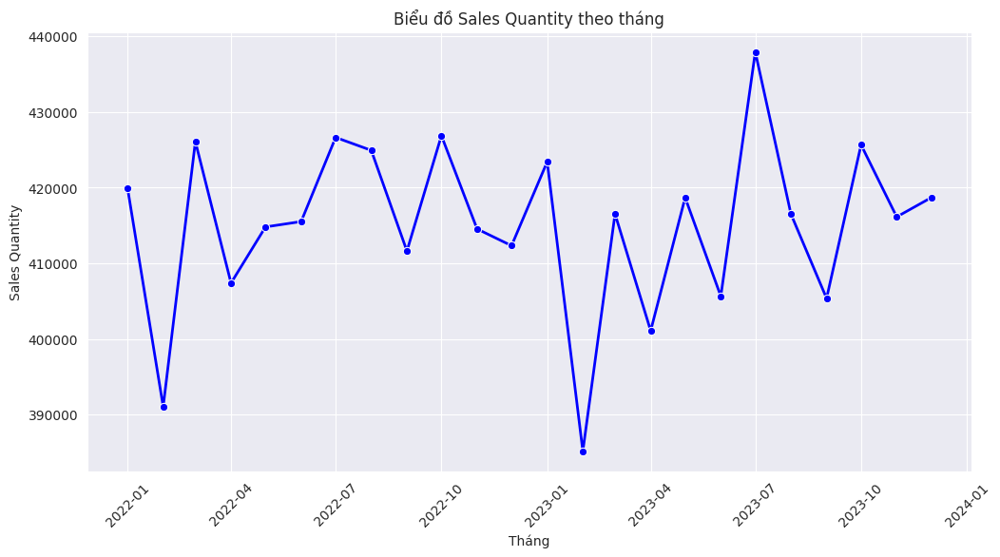

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Nếu Date_Month đang là Period, cần chuyển về datetime
df_grouped_ml["Date_Month"] = df_grouped_ml["Date_Month"].dt.to_timestamp()

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_grouped_ml, x="Date_Month", y="Sales_Quantity", marker="o", linewidth=2, color="b")

# Format trục x
plt.xticks(rotation=45)
plt.xlabel("Tháng")
plt.ylabel("Sales Quantity")
plt.title("Biểu đồ Sales Quantity theo tháng")
plt.grid(True)
plt.show()


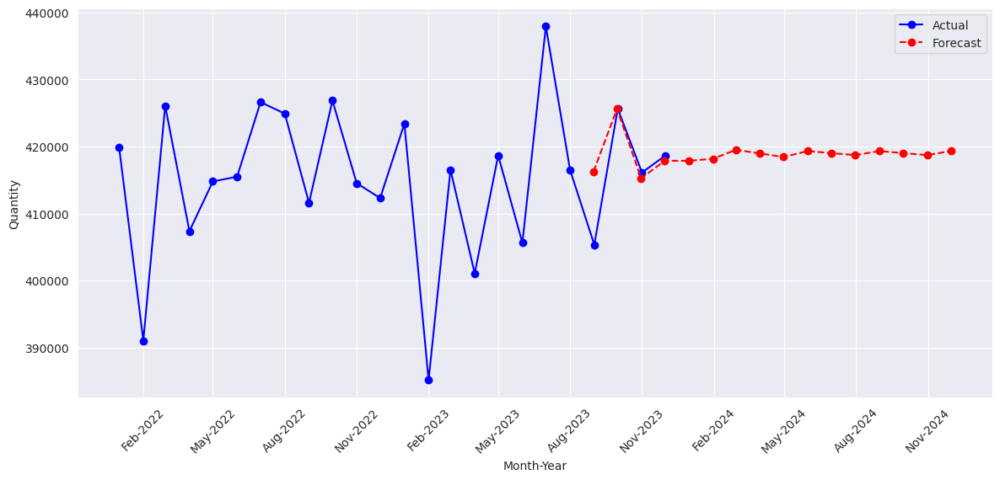

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Lấy dữ liệu thực tế
actual_dates = pd.to_datetime(df_grouped_ml["Date_Month"])
actual_sales = df_grouped_ml["Sales_Quantity"]

# Xác định mốc thời gian cho toàn bộ dự báo
last_actual_date = actual_dates.iloc[-6]  # Lấy tháng trước 6 tháng cuối làm mốc
predicted_dates = pd.date_range(start=last_actual_date, periods=17, freq="ME")[1:]  # 16 timestamps (bỏ tháng đầu tiên)

# Gộp tất cả dự báo vào một mảng (16 phần tử)
all_predictions = list(y_pred) + list(future_predictions)
all_predictions = all_predictions[:16]  # Đảm bảo đúng 16 phần tử

# Vẽ biểu đồ
plt.figure(figsize=(14, 6))

# Vẽ dữ liệu thực tế
plt.plot(actual_dates, actual_sales, marker="o", label="Actual", color="b")

# Vẽ toàn bộ phần dự báo trên một đường duy nhất (16 điểm)
plt.plot(predicted_dates, all_predictions, marker="o", linestyle="dashed", label="Forecast", color="r")

# Định dạng trục X
plt.xlabel("Month-Year")
plt.ylabel("Quantity")

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b-%Y"))  # Hiển thị "Jan-2024"
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))  # Hiện 3 tháng/lần

plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.show()


### 4.1.3. Predictive Analysis

In [ ]:
df_grouped_ml_pro = data[['Date','Sales_Quantity','Product ID']]

In [ ]:
df_grouped_ml_pro

,Date,Sales_Quantity,Product ID
0,2022-01-01,127,G0001
1,2022-01-01,150,T0002
2,2022-01-01,65,T0003
3,2022-01-01,61,T0004
4,2022-01-01,14,E0005
...,...,...,...
73095,2024-01-01,8,F0016
73096,2024-01-01,51,T0017
73097,2024-01-01,36,C0018
73098,2024-01-01,264,T0019


In [ ]:
df_grouped_ml_pro["Product ID"].unique()

array(['G0001', 'T0002', 'T0003', 'T0004', 'E0005', 'G0006', 'F0007',
       'C0008', 'E0009', 'T0010', 'F0011', 'C0012', 'T0013', 'C0014',
       'C0015', 'E0016', 'T0017', 'C0018', 'C0019', 'T0020', 'C0002',
       'F0003', 'T0005', 'F0006', 'G0007', 'E0008', 'C0009', 'E0010',
       'G0011', 'G0012', 'C0013', 'E0014', 'T0015', 'T0016', 'G0017',
       'G0018', 'T0019', 'T0001', 'E0002', 'G0003', 'C0005', 'E0007',
       'T0008', 'G0009', 'G0010', 'T0011', 'E0012', 'F0013', 'G0016',
       'C0017', 'T0018', 'E0020', 'C0003', 'G0004', 'G0005', 'E0006',
       'F0008', 'F0009', 'E0011', 'E0017', 'G0019', 'C0020', 'E0003',
       'F0004', 'C0007', 'C0010', 'F0015', 'C0016', 'F0018', 'T0009',
       'F0012', 'E0015', 'F0017', 'F0019', 'E0001', 'F0002', 'T0012',
       'F0014', 'G0002', 'F0005', 'F0010', 'E0013', 'T0014', 'T0006',
       'C0006', 'E0004', 'G0008', 'T0007', 'C0011', 'G0013', 'G0014',
       'G0020', 'C0001', 'C0004', 'E0018', 'G0015', 'F0020', 'F0001',
       'F0016', 'E00

In [ ]:
import pandas as pd

# Chuyển cột Date về dạng datetime
df_grouped_ml_pro["Date"] = pd.to_datetime(df_grouped_ml_pro["Date"])

# Tạo cột mới với format YYYY-MM
df_grouped_ml_pro["Year_Month"] = df_grouped_ml_pro["Date"].dt.to_period("M")

# Nhóm dữ liệu theo Year_Month và Category, rồi tính tổng Sales_Quantity
df_summary = df_grouped_ml_pro.groupby(["Year_Month", "Product ID"])["Sales_Quantity"].sum().reset_index()

# Chuyển Year_Month về dạng chuỗi để hiển thị tốt hơn
df_summary["Year_Month"] = df_summary["Year_Month"].astype(str)

# Hiển thị kết quả
print(df_summary.head())


  Year_Month Product ID  Sales_Quantity
0    2022-01      C0001            4226
1    2022-01      C0002            3451
2    2022-01      C0003            3080
3    2022-01      C0004            2526
4    2022-01      C0005            3912


<ipython-input-227-e30bba7ec00d>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-227-e30bba7ec00d>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import pandas as pd

df_grouped_ml_pro = df_grouped_ml_pro.copy()  # Tạo bản sao để tránh SettingWithCopyWarning
df_grouped_ml_pro["Date"] = pd.to_datetime(df_grouped_ml_pro["Date"])

# Tạo cột Year_Month (YYYY-MM)
df_grouped_ml_pro["Year_Month"] = df_grouped_ml_pro["Date"].dt.to_period("M").astype(str)

# Nhóm theo Year_Month, Category và Product ID, tính tổng Sales_Quantity
df_summary = df_grouped_ml_pro.groupby(["Year_Month", "Product ID"], as_index=False)["Sales_Quantity"].sum()

# Tạo Dictionary chứa DataFrame cho từng Product ID
product_ids = df_summary["Product ID"].unique()
df_product_dict = {pid: df_summary[df_summary["Product ID"] == pid].reset_index(drop=True) for pid in product_ids}


  Year_Month Product ID  Sales_Quantity
0    2022-01      C0001            4226
1    2022-02      C0001            3938
2    2022-03      C0001            3803
3    2022-04      C0001            3568
4    2022-05      C0001            4528


In [ ]:
df_product_dict

{'C0001':    Year_Month Product ID  Sales_Quantity
 0     2022-01      C0001            4226
 1     2022-02      C0001            3938
 2     2022-03      C0001            3803
 3     2022-04      C0001            3568
 4     2022-05      C0001            4528
 5     2022-06      C0001            4509
 6     2022-07      C0001            3321
 7     2022-08      C0001            3960
 8     2022-09      C0001            5512
 9     2022-10      C0001            5080
 10    2022-11      C0001            3317
 11    2022-12      C0001            4246
 12    2023-01      C0001            3750
 13    2023-02      C0001            3974
 14    2023-03      C0001            2610
 15    2023-04      C0001            4746
 16    2023-05      C0001            3681
 17    2023-06      C0001            4985
 18    2023-07      C0001            3734
 19    2023-08      C0001            5556
 20    2023-09      C0001            4661
 21    2023-10      C0001            5276
 22    2023-11      C0001

In [ ]:
# Lọc dữ liệu của từng sản phẩm trước 2024-01
df_product_dict = {pid: df[df["Year_Month"] < "2024-01"] for pid, df in df_product_dict.items()}

In [ ]:
df_product_dict

{'C0001':    Year_Month Product ID  Sales_Quantity
 0     2022-01      C0001            4226
 1     2022-02      C0001            3938
 2     2022-03      C0001            3803
 3     2022-04      C0001            3568
 4     2022-05      C0001            4528
 5     2022-06      C0001            4509
 6     2022-07      C0001            3321
 7     2022-08      C0001            3960
 8     2022-09      C0001            5512
 9     2022-10      C0001            5080
 10    2022-11      C0001            3317
 11    2022-12      C0001            4246
 12    2023-01      C0001            3750
 13    2023-02      C0001            3974
 14    2023-03      C0001            2610
 15    2023-04      C0001            4746
 16    2023-05      C0001            3681
 17    2023-06      C0001            4985
 18    2023-07      C0001            3734
 19    2023-08      C0001            5556
 20    2023-09      C0001            4661
 21    2023-10      C0001            5276
 22    2023-11      C0001

In [ ]:
import pandas as pd

# Tạo danh sách các DataFrame theo Product ID
product_dfs = {pid: df.copy() for pid, df in df_product_dict.items()}

# Dịch chuyển dữ liệu quá khứ và tạo dummy variables cho từng DataFrame
for product_id, df in product_dfs.items():
    # Dịch chuyển dữ liệu quá khứ
    df["Quantity_LastMonth"] = df["Sales_Quantity"].shift(1)
    df["Quantity_2Monthsback"] = df["Sales_Quantity"].shift(2)
    df["Quantity_3Monthsback"] = df["Sales_Quantity"].shift(3)
    df.dropna(inplace=True)

    # Trích xuất tháng từ Year_Month
    df["Month"] = pd.to_datetime(df["Year_Month"]).dt.month

    # One-hot encoding (Dummy variables)
    dummy = pd.get_dummies(df["Month"], prefix="Month")

    # Gộp dữ liệu với biến dummy
    df = pd.concat([df, dummy], axis=1)
      # Loại bỏ cột không cần thiết
    df.drop(columns=['Year_Month', 'Month', "Product ID"], errors='ignore', inplace=True)


    # Cập nhật lại DataFrame sau khi xử lý
    product_dfs[product_id] = df

# Kiểm tra thử một DataFrame (ví dụ: P0001)
print(product_dfs["T0006"].head())


   Sales_Quantity  Quantity_LastMonth  Quantity_2Monthsback  \
3            3433              5204.0                3589.0   
4            3787              3433.0                5204.0   
5            4583              3787.0                3433.0   
6            4196              4583.0                3787.0   
7            4965              4196.0                4583.0   

   Quantity_3Monthsback  Month_1  Month_2  Month_3  Month_4  Month_5  Month_6  \
3                3436.0    False    False    False     True    False    False   
4                3589.0    False    False    False    False     True    False   
5                5204.0    False    False    False    False    False     True   
6                3433.0    False    False    False    False    False    False   
7                3787.0    False    False    False    False    False    False   

   Month_7  Month_8  Month_9  Month_10  Month_11  Month_12  
3    False    False    False     False     False     False  
4    False  

In [ ]:
product_dfs

{'C0001':     Sales_Quantity  Quantity_LastMonth  Quantity_2Monthsback  \
 3             3568              3803.0                3938.0   
 4             4528              3568.0                3803.0   
 5             4509              4528.0                3568.0   
 6             3321              4509.0                4528.0   
 7             3960              3321.0                4509.0   
 8             5512              3960.0                3321.0   
 9             5080              5512.0                3960.0   
 10            3317              5080.0                5512.0   
 11            4246              3317.0                5080.0   
 12            3750              4246.0                3317.0   
 13            3974              3750.0                4246.0   
 14            2610              3974.0                3750.0   
 15            4746              2610.0                3974.0   
 16            3681              4746.0                2610.0   
 17            4

🚀 Training model for C0001...
✅ Accuracy for C0001: 78.71 %
📉 RMSE for C0001: 1021.6


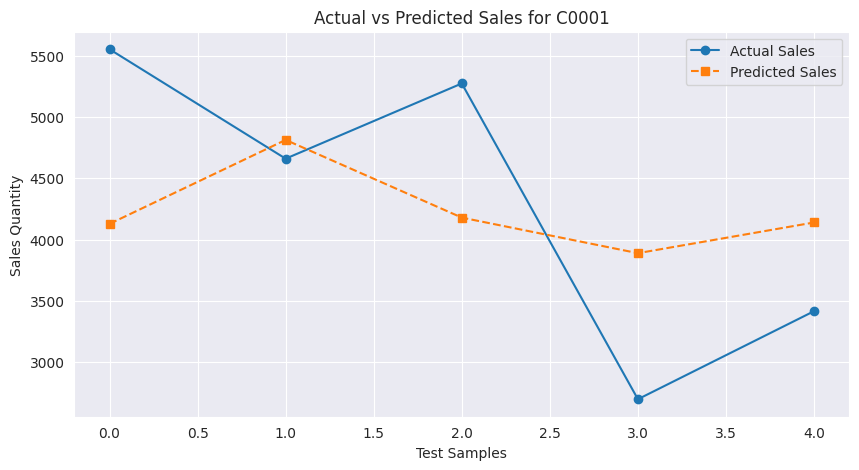

🚀 Training model for C0002...
✅ Accuracy for C0002: 80.18 %
📉 RMSE for C0002: 897.58


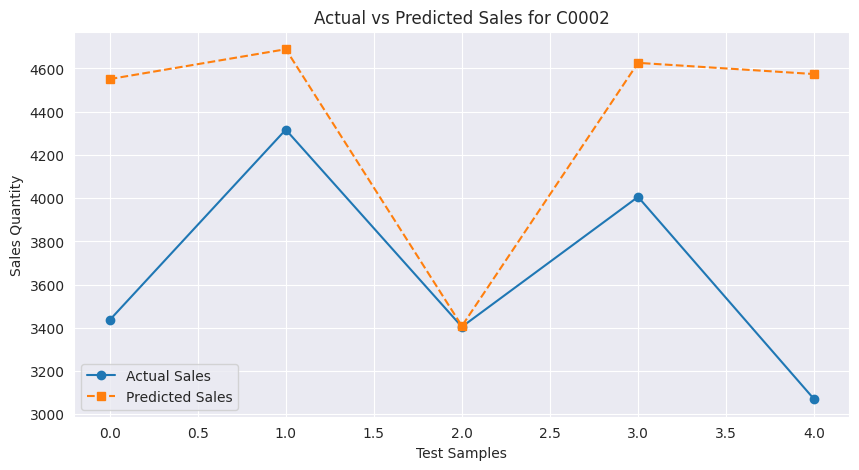

🚀 Training model for C0003...
✅ Accuracy for C0003: 77.95 %
📉 RMSE for C0003: 918.85


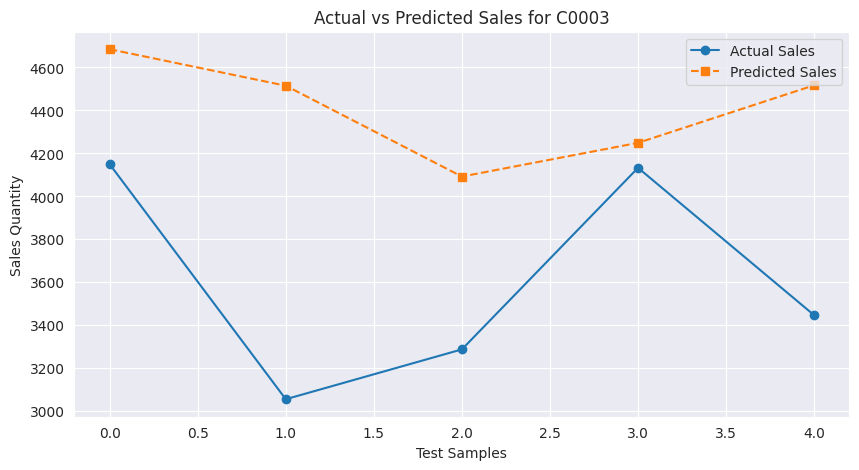

🚀 Training model for C0004...
✅ Accuracy for C0004: 79.13 %
📉 RMSE for C0004: 959.78


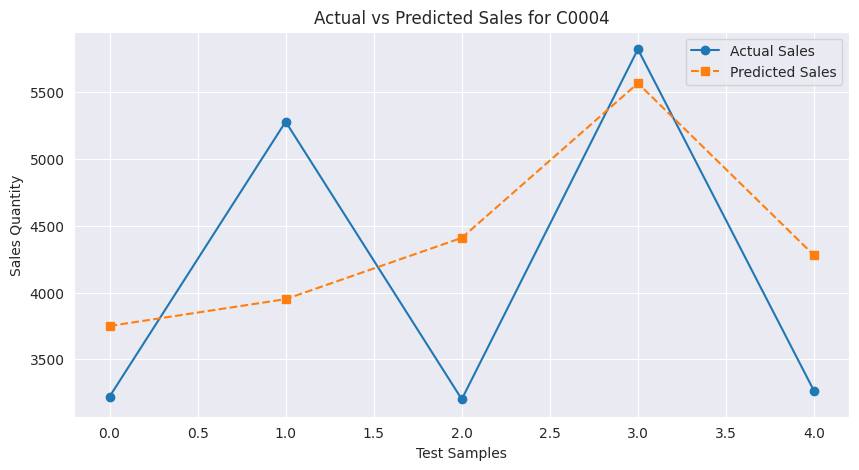

🚀 Training model for C0005...
✅ Accuracy for C0005: 83.27 %
📉 RMSE for C0005: 756.35


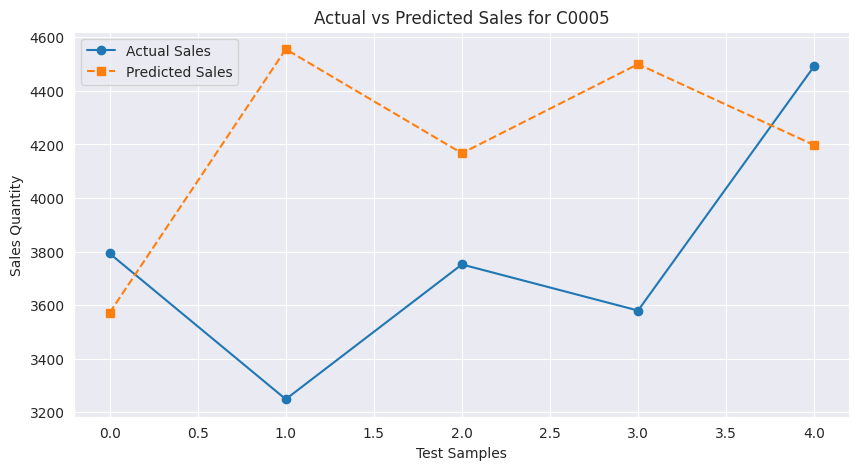

🚀 Training model for C0006...
✅ Accuracy for C0006: 81.4 %
📉 RMSE for C0006: 958.58


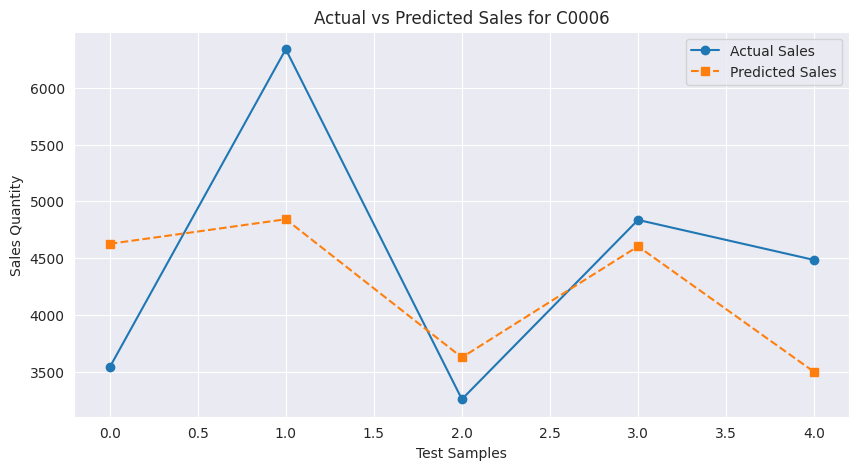

🚀 Training model for C0007...
✅ Accuracy for C0007: 78.13 %
📉 RMSE for C0007: 1123.95


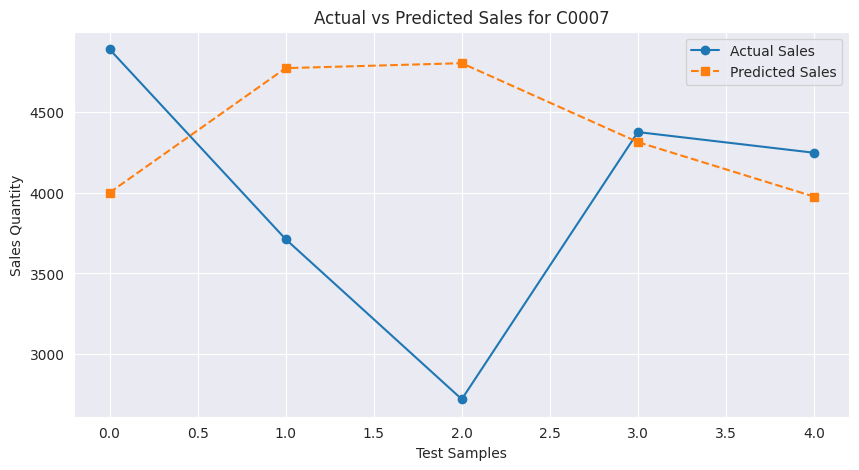

🚀 Training model for C0008...
✅ Accuracy for C0008: 81.27 %
📉 RMSE for C0008: 901.38


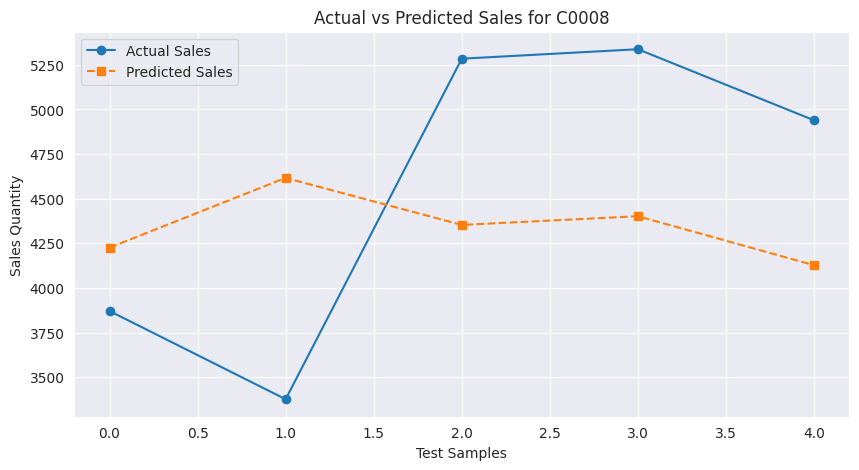

🚀 Training model for C0009...
✅ Accuracy for C0009: 84.38 %
📉 RMSE for C0009: 751.01


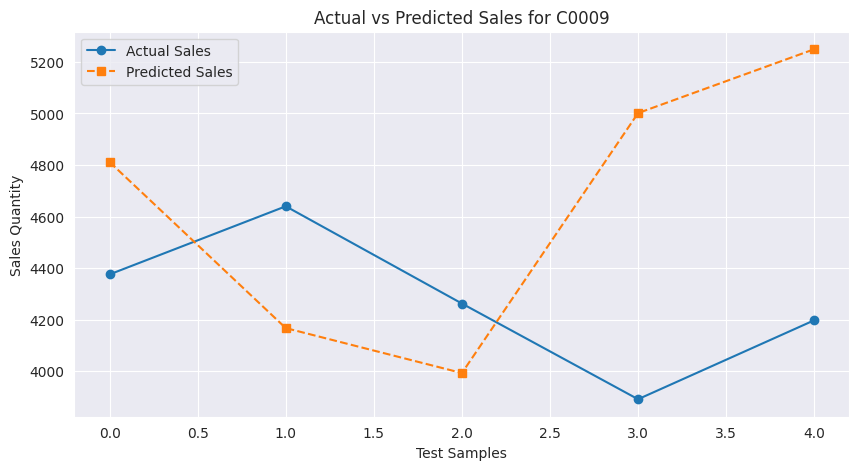

🚀 Training model for C0010...
✅ Accuracy for C0010: 68.43 %
📉 RMSE for C0010: 1260.45


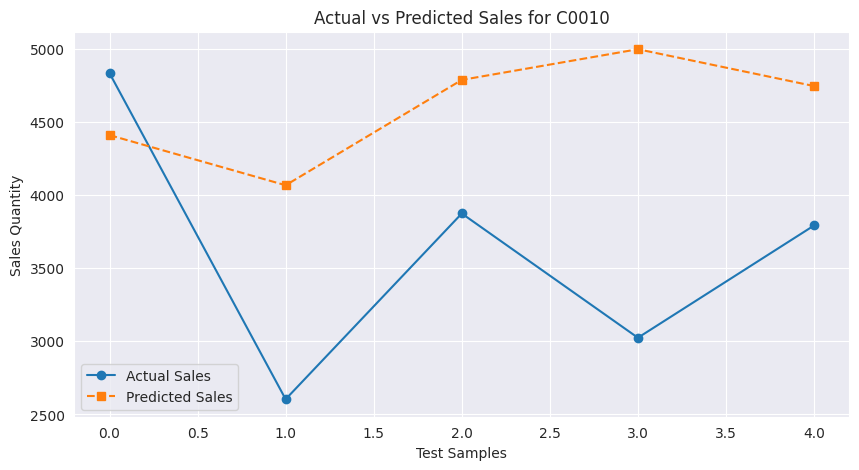

🚀 Training model for C0011...
✅ Accuracy for C0011: 86.09 %
📉 RMSE for C0011: 799.91


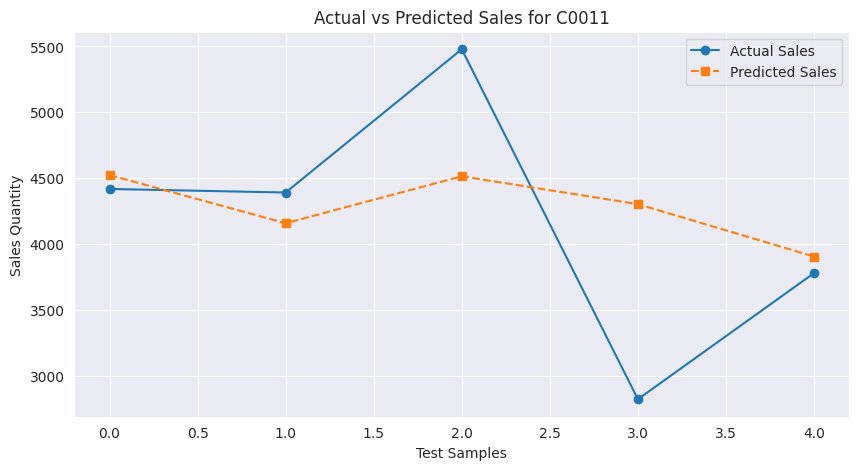

🚀 Training model for C0012...
✅ Accuracy for C0012: 75.06 %
📉 RMSE for C0012: 1098.32


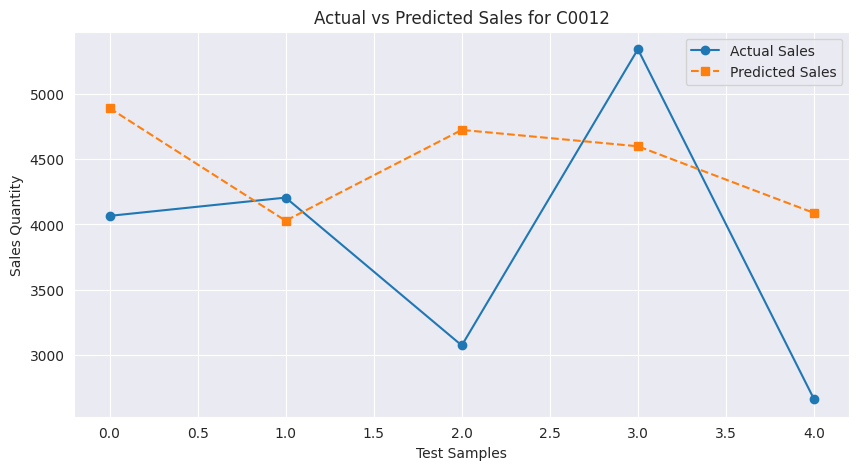

🚀 Training model for C0013...
✅ Accuracy for C0013: 81.38 %
📉 RMSE for C0013: 706.27


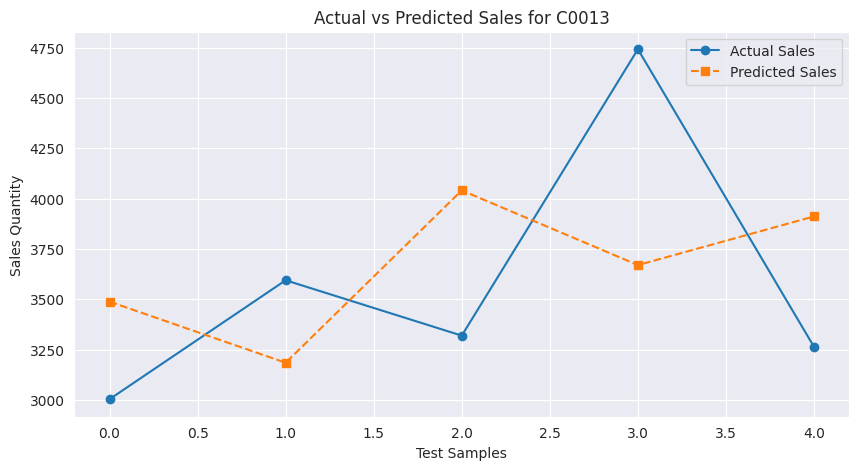

🚀 Training model for C0014...
✅ Accuracy for C0014: 79.11 %
📉 RMSE for C0014: 968.33


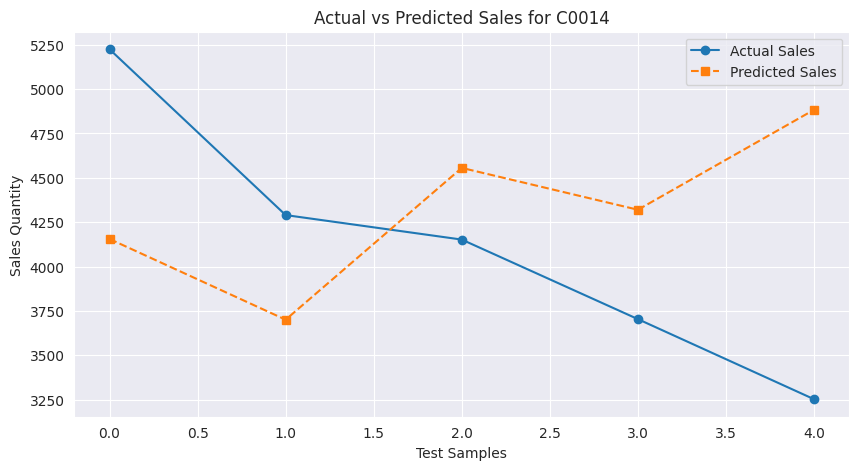

🚀 Training model for C0015...
✅ Accuracy for C0015: 87.75 %
📉 RMSE for C0015: 770.35


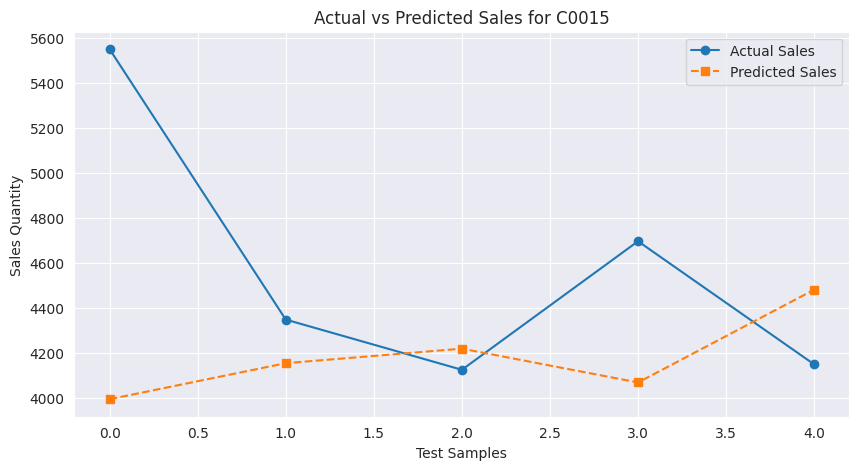

🚀 Training model for C0016...
✅ Accuracy for C0016: 76.32 %
📉 RMSE for C0016: 1110.56


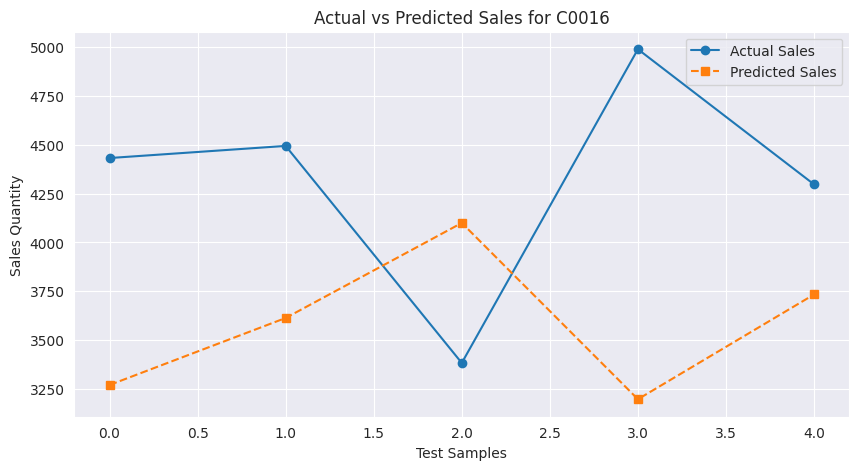

🚀 Training model for C0017...
✅ Accuracy for C0017: 91.29 %
📉 RMSE for C0017: 558.78


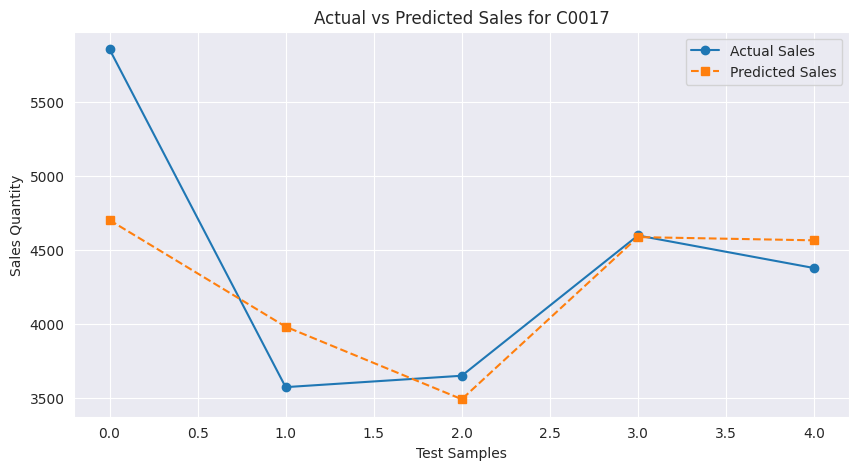

🚀 Training model for C0018...
✅ Accuracy for C0018: 68.3 %
📉 RMSE for C0018: 1816.42


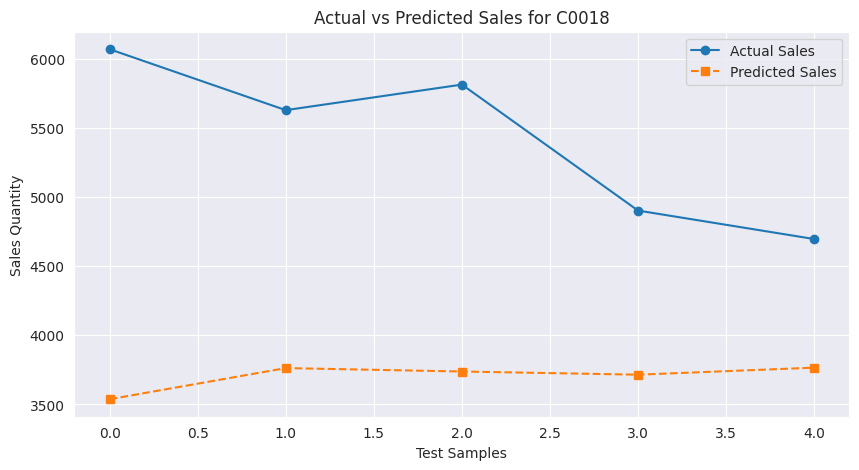

🚀 Training model for C0019...
✅ Accuracy for C0019: 80.8 %
📉 RMSE for C0019: 1034.01


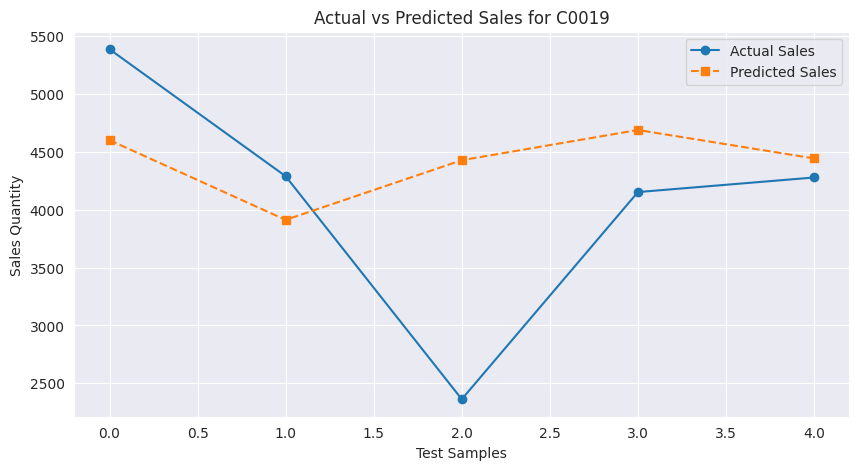

🚀 Training model for C0020...
✅ Accuracy for C0020: 76.79 %
📉 RMSE for C0020: 913.7


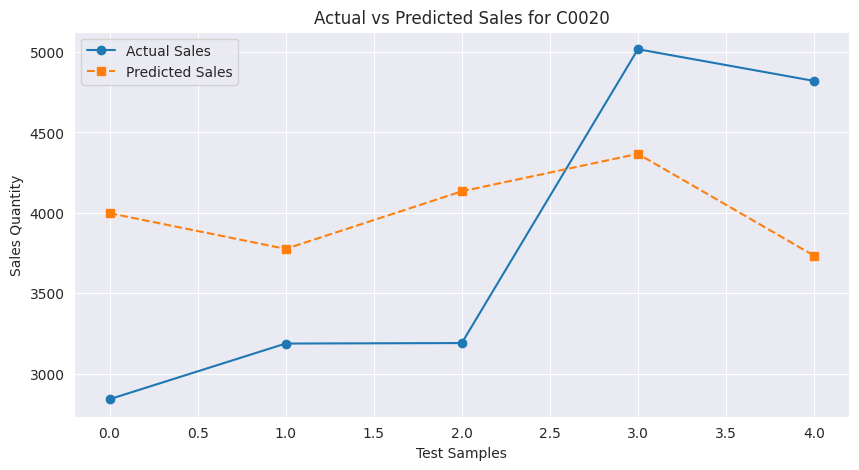

🚀 Training model for E0001...
✅ Accuracy for E0001: 81.99 %
📉 RMSE for E0001: 863.84


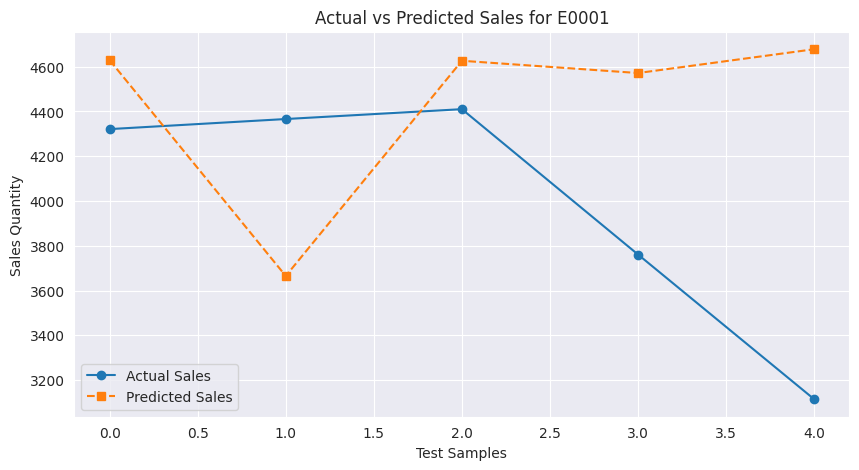

🚀 Training model for E0002...
✅ Accuracy for E0002: 79.42 %
📉 RMSE for E0002: 1098.37


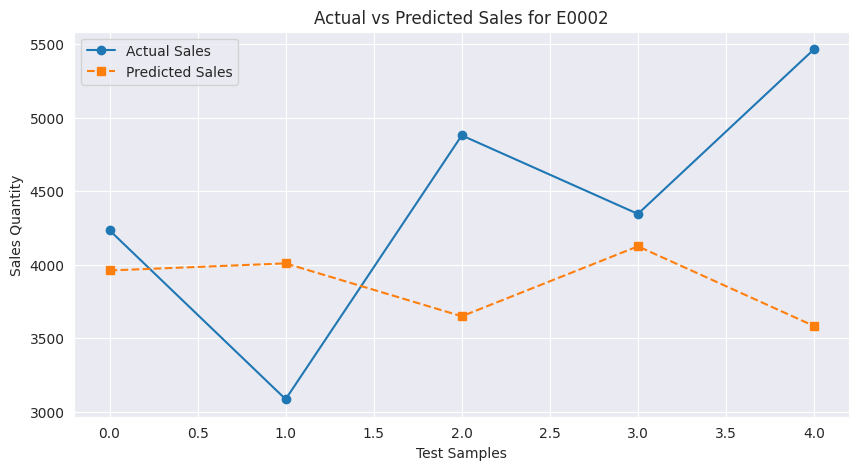

🚀 Training model for E0003...
✅ Accuracy for E0003: 80.98 %
📉 RMSE for E0003: 808.41


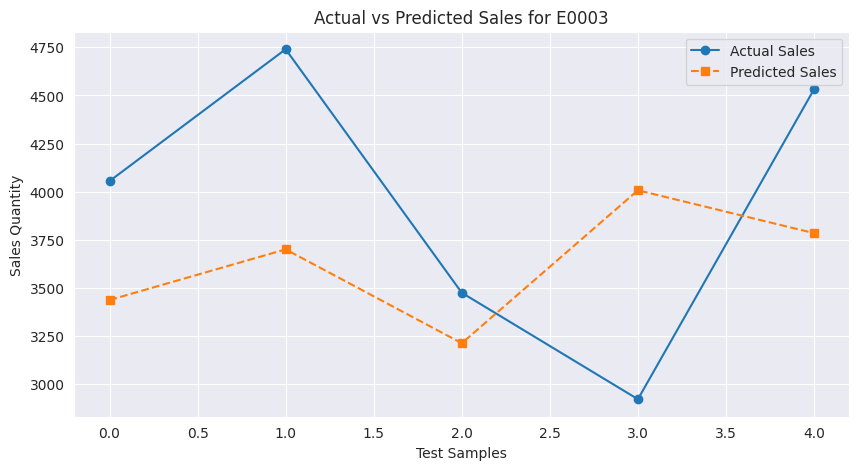

🚀 Training model for E0004...
✅ Accuracy for E0004: 77.9 %
📉 RMSE for E0004: 1059.6


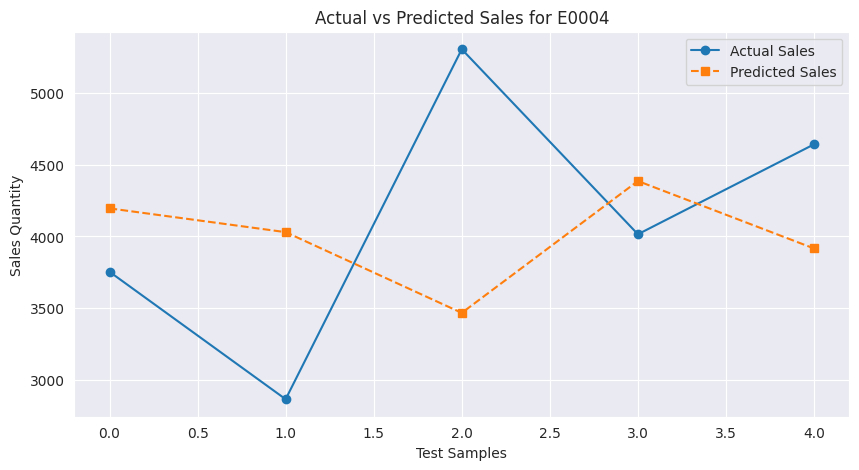

🚀 Training model for E0005...
✅ Accuracy for E0005: 86.8 %
📉 RMSE for E0005: 621.58


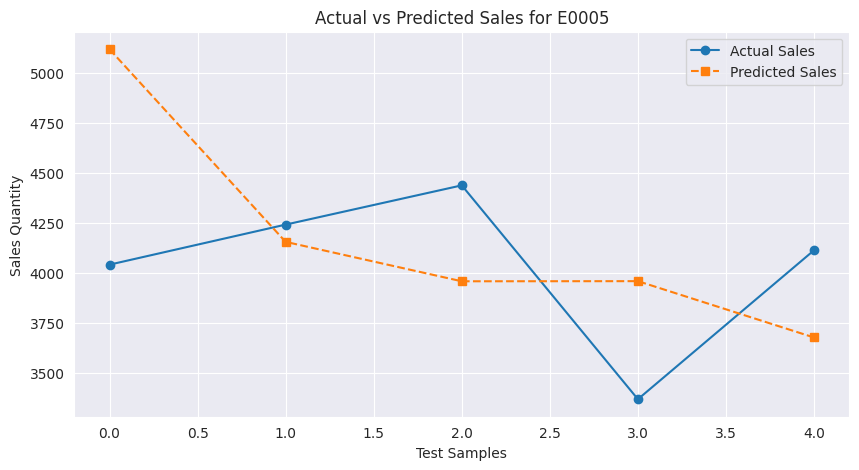

🚀 Training model for E0006...
✅ Accuracy for E0006: 86.15 %
📉 RMSE for E0006: 733.98


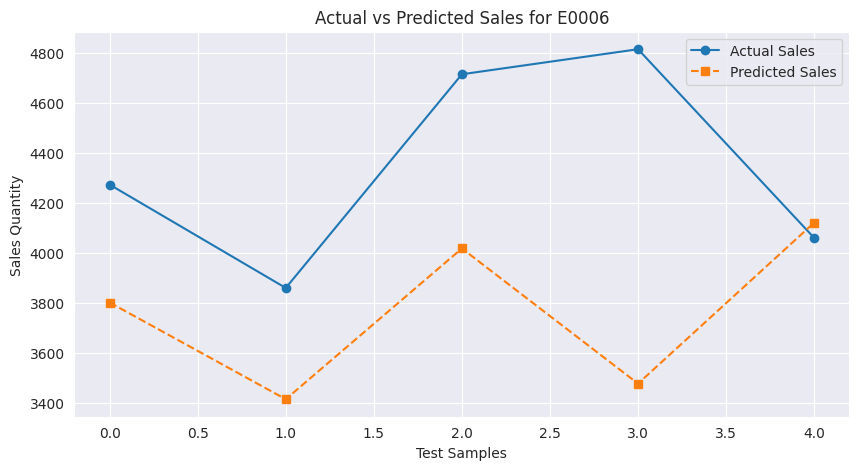

🚀 Training model for E0007...
✅ Accuracy for E0007: 79.8 %
📉 RMSE for E0007: 919.32


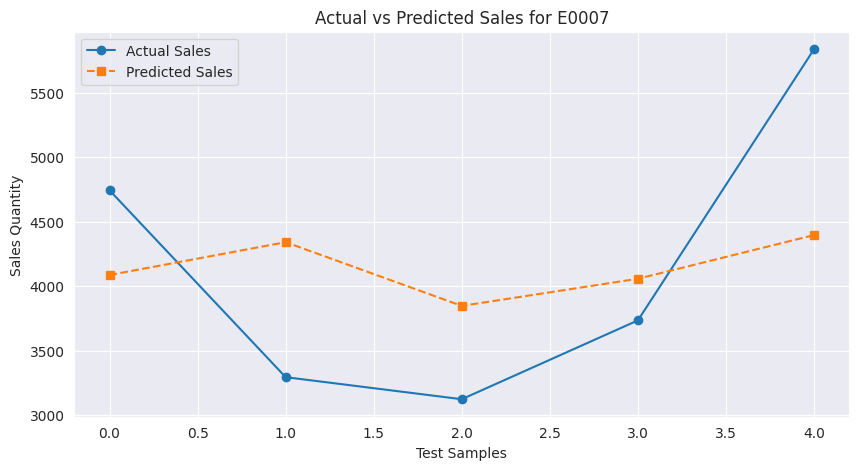

🚀 Training model for E0008...
✅ Accuracy for E0008: 77.95 %
📉 RMSE for E0008: 1187.47


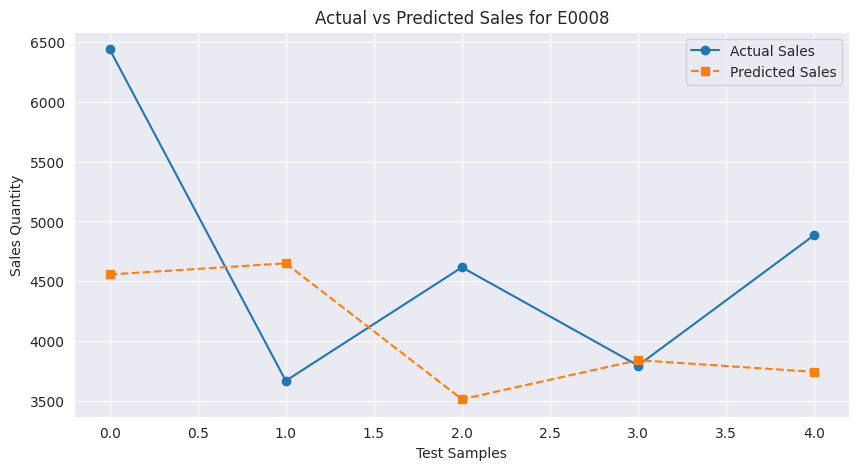

🚀 Training model for E0009...
✅ Accuracy for E0009: 68.87 %
📉 RMSE for E0009: 1427.42


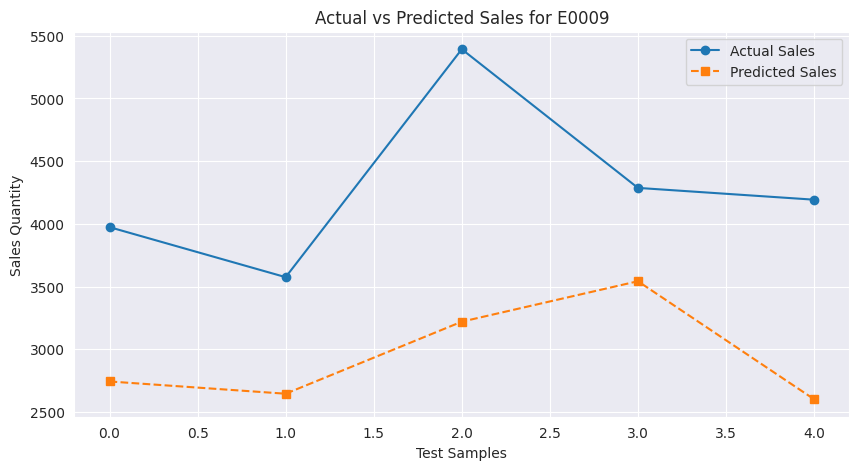

🚀 Training model for E0010...
✅ Accuracy for E0010: 73.01 %
📉 RMSE for E0010: 1320.33


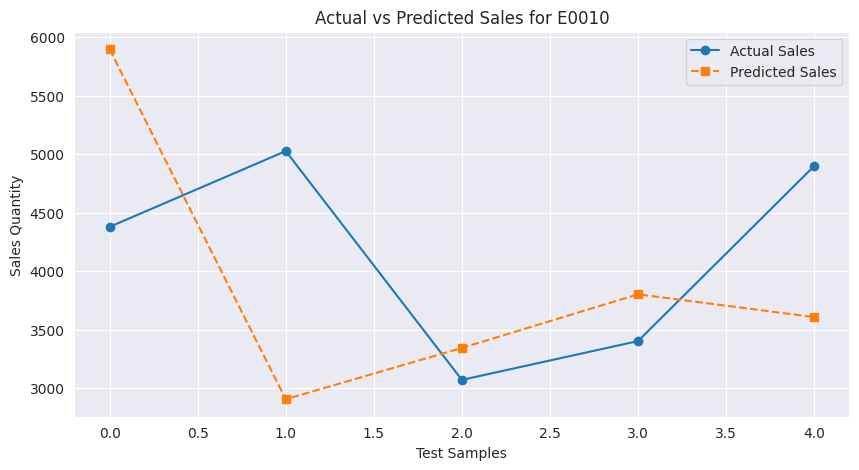

🚀 Training model for E0011...
✅ Accuracy for E0011: 78.86 %
📉 RMSE for E0011: 1198.67


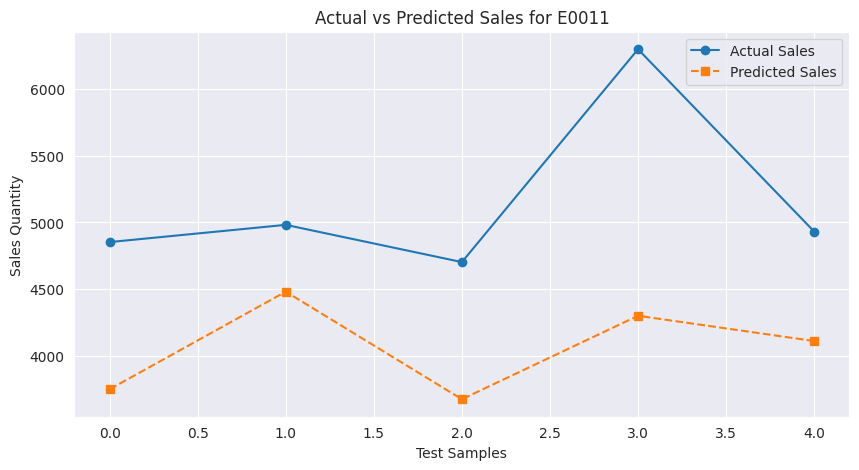

🚀 Training model for E0012...
✅ Accuracy for E0012: 84.9 %
📉 RMSE for E0012: 741.35


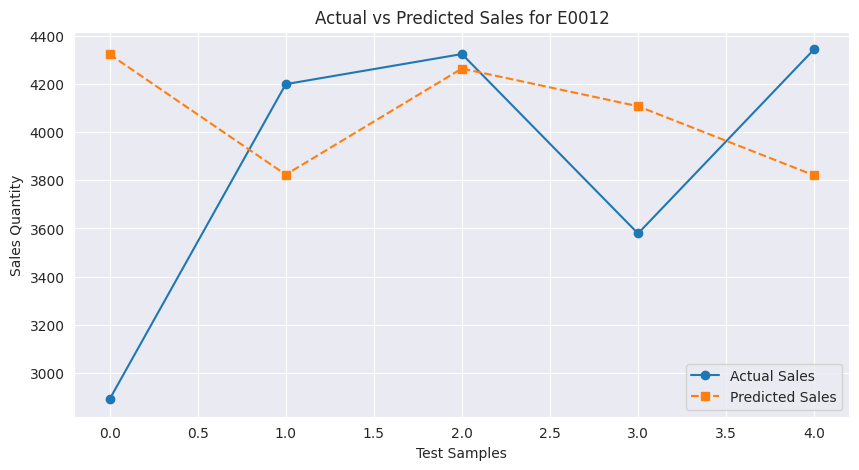

🚀 Training model for E0013...
✅ Accuracy for E0013: 84.39 %
📉 RMSE for E0013: 690.27


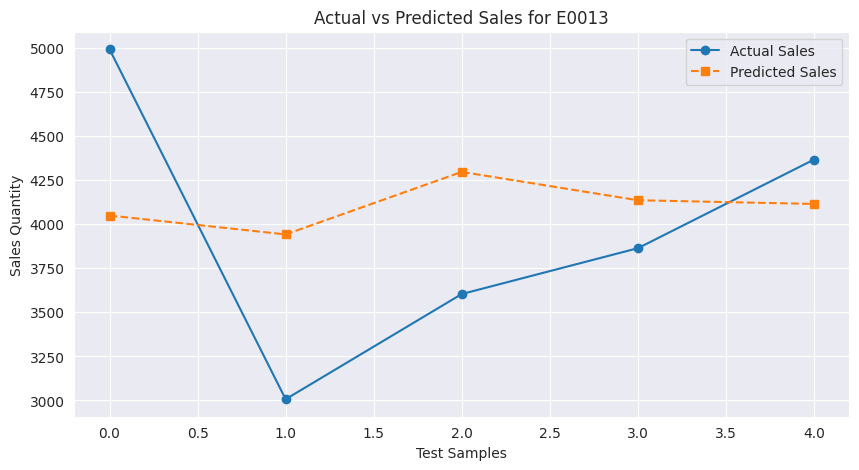

🚀 Training model for E0014...
✅ Accuracy for E0014: 81.3 %
📉 RMSE for E0014: 986.4


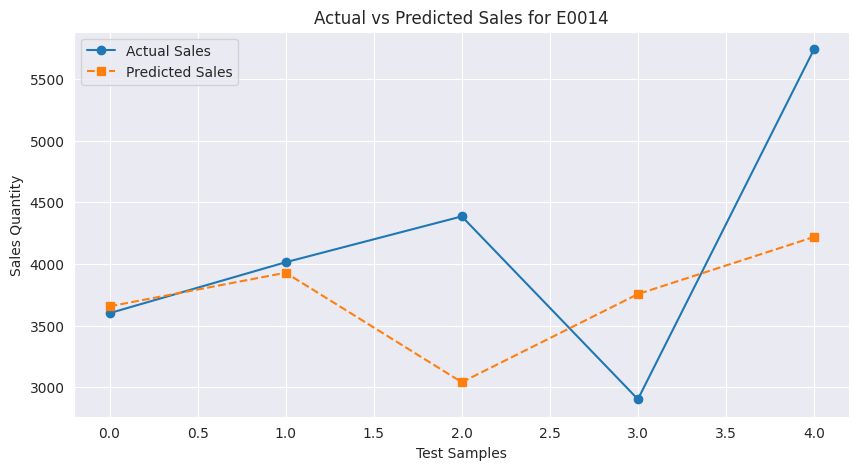

🚀 Training model for E0015...
✅ Accuracy for E0015: 73.59 %
📉 RMSE for E0015: 1053.69


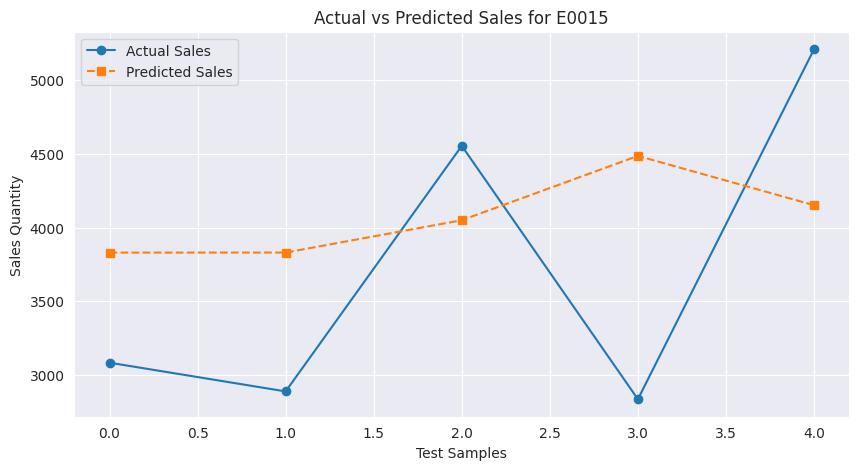

🚀 Training model for E0016...
✅ Accuracy for E0016: 82.67 %
📉 RMSE for E0016: 871.31


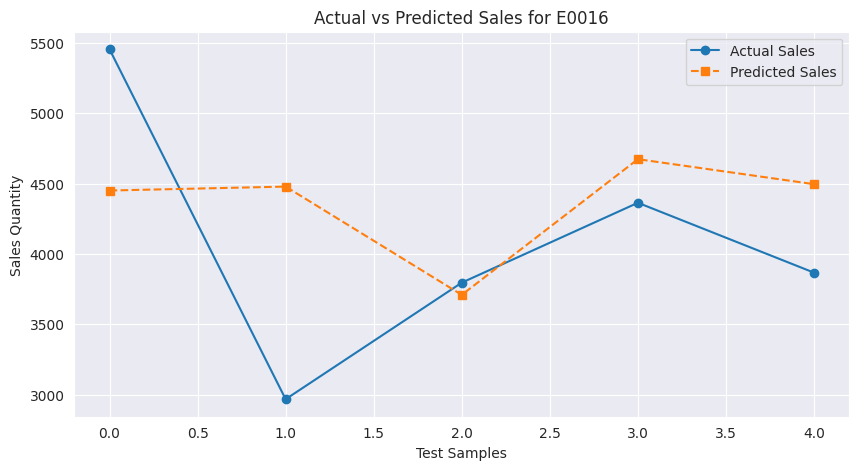

🚀 Training model for E0017...
✅ Accuracy for E0017: 82.31 %
📉 RMSE for E0017: 914.3


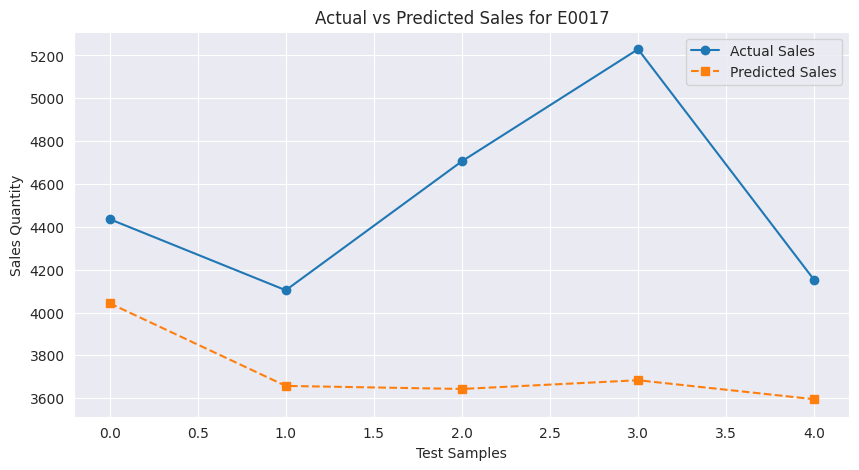

🚀 Training model for E0018...
✅ Accuracy for E0018: 84.49 %
📉 RMSE for E0018: 762.14


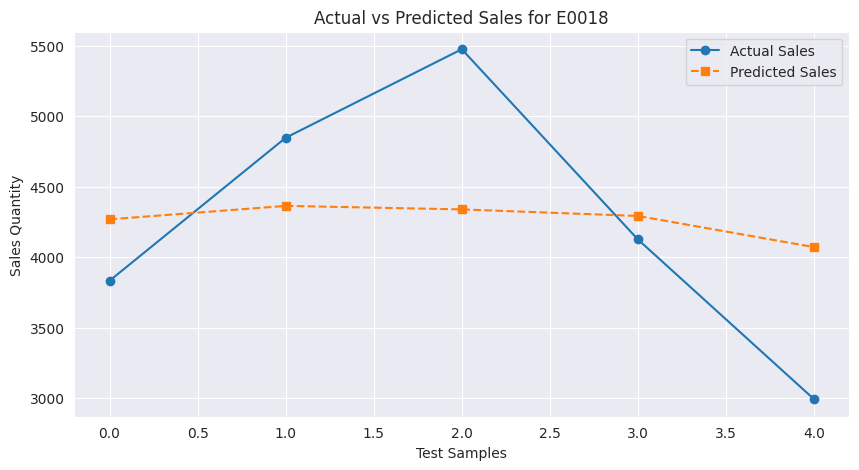

🚀 Training model for E0019...
✅ Accuracy for E0019: 72.02 %
📉 RMSE for E0019: 1342.05


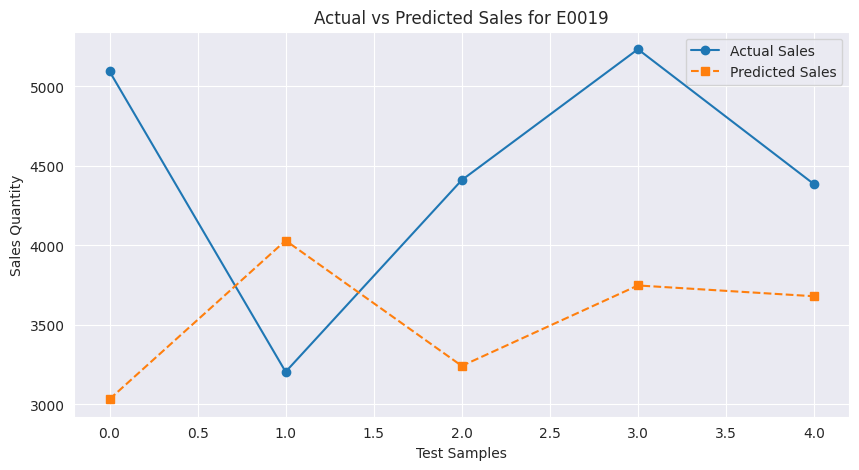

🚀 Training model for E0020...
✅ Accuracy for E0020: 78.45 %
📉 RMSE for E0020: 1005.16


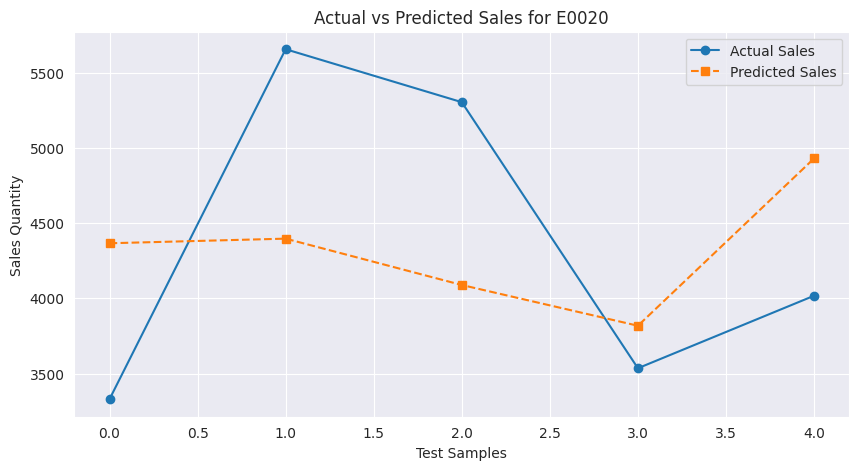

🚀 Training model for F0001...
✅ Accuracy for F0001: 83.27 %
📉 RMSE for F0001: 783.82


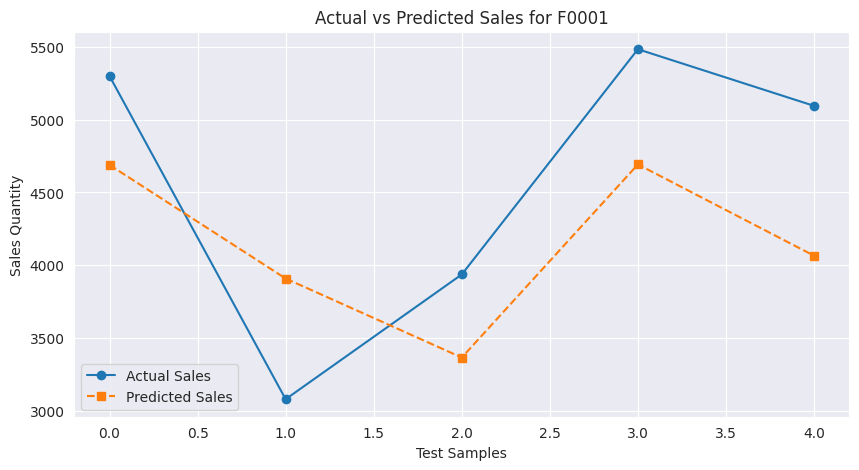

🚀 Training model for F0002...
✅ Accuracy for F0002: 90.86 %
📉 RMSE for F0002: 450.06


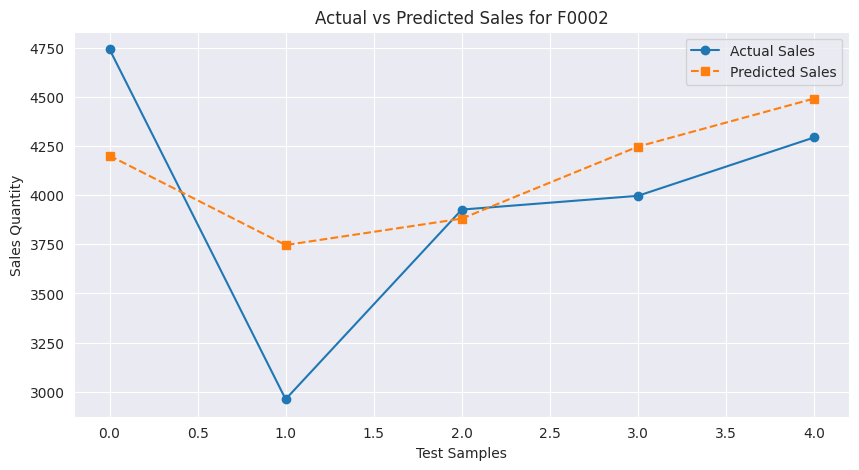

🚀 Training model for F0003...
✅ Accuracy for F0003: 90.83 %
📉 RMSE for F0003: 461.08


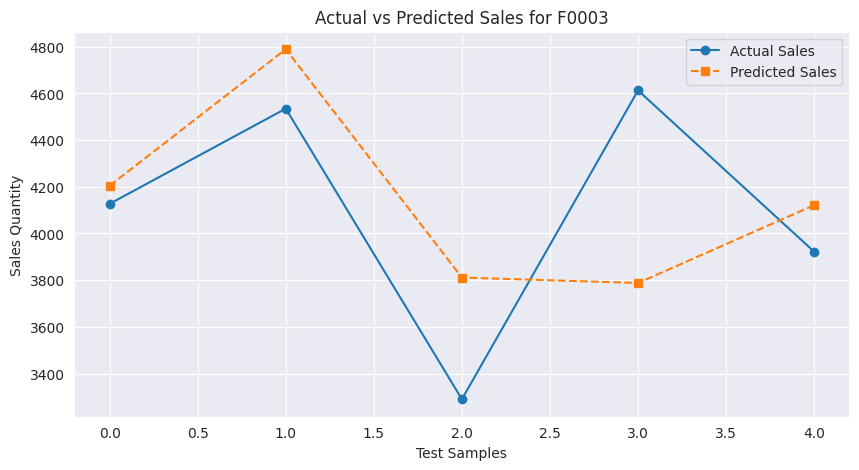

🚀 Training model for F0004...
✅ Accuracy for F0004: 80.26 %
📉 RMSE for F0004: 969.72


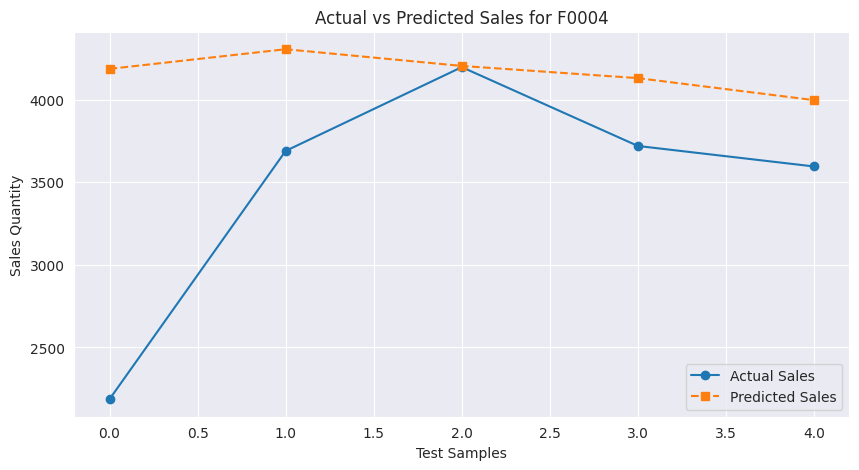

🚀 Training model for F0005...
✅ Accuracy for F0005: 87.8 %
📉 RMSE for F0005: 700.82


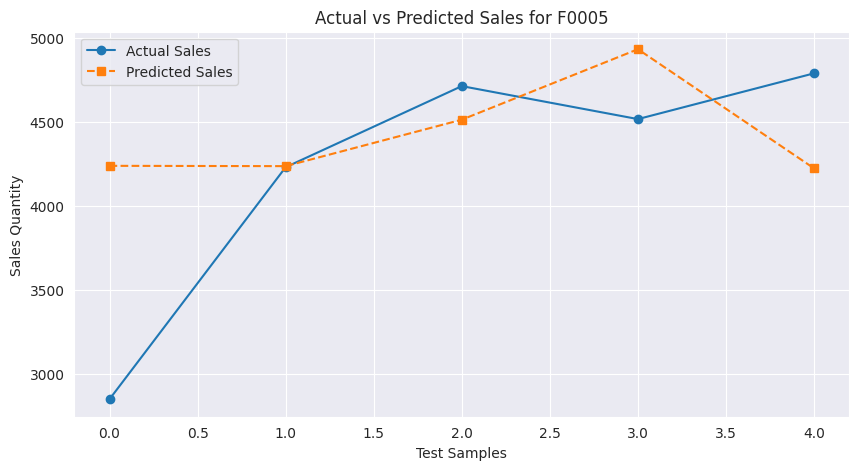

🚀 Training model for F0006...
✅ Accuracy for F0006: 66.02 %
📉 RMSE for F0006: 1369.54


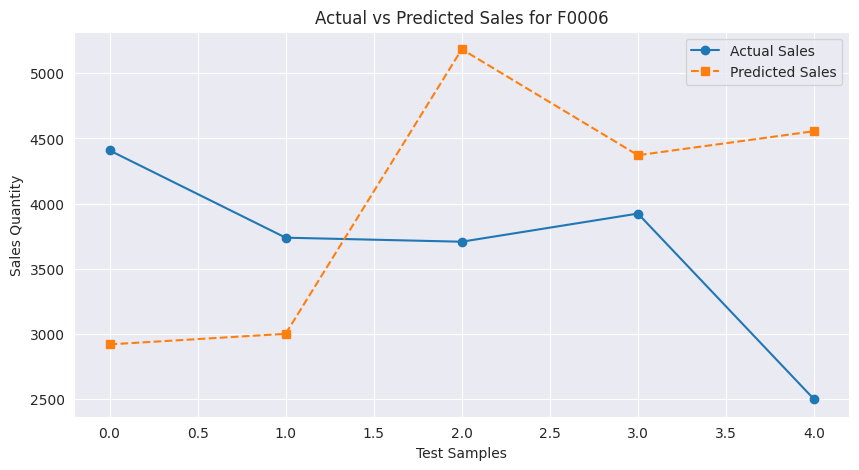

🚀 Training model for F0007...
✅ Accuracy for F0007: 77.57 %
📉 RMSE for F0007: 1222.84


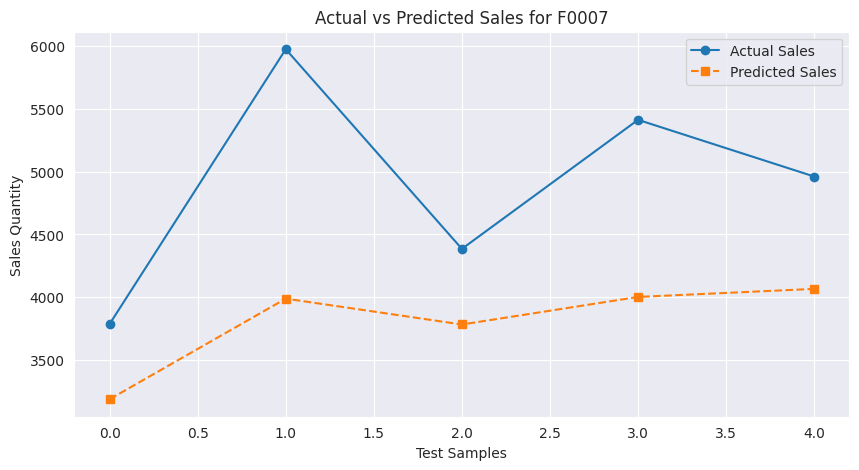

🚀 Training model for F0008...
✅ Accuracy for F0008: 79.29 %
📉 RMSE for F0008: 1061.91


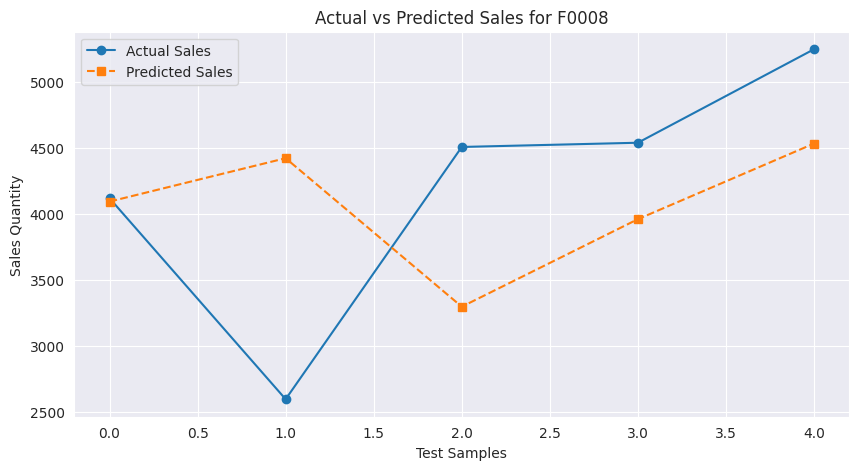

🚀 Training model for F0009...
✅ Accuracy for F0009: 77.96 %
📉 RMSE for F0009: 1280.58


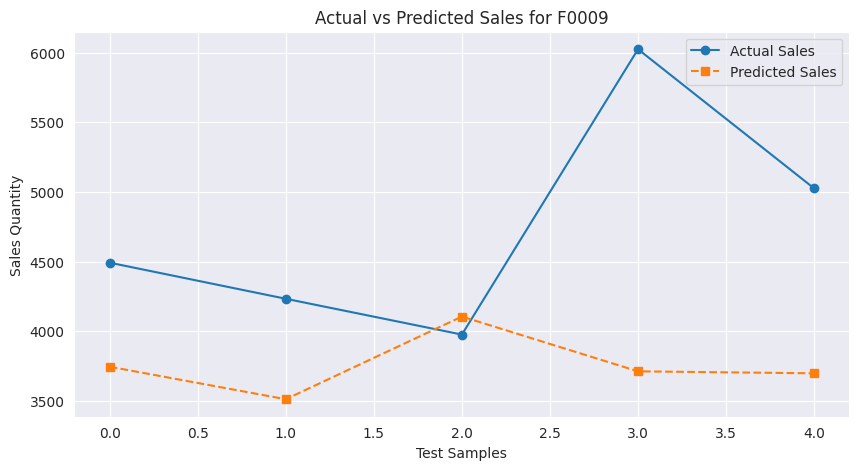

🚀 Training model for F0010...
✅ Accuracy for F0010: 72.22 %
📉 RMSE for F0010: 1590.45


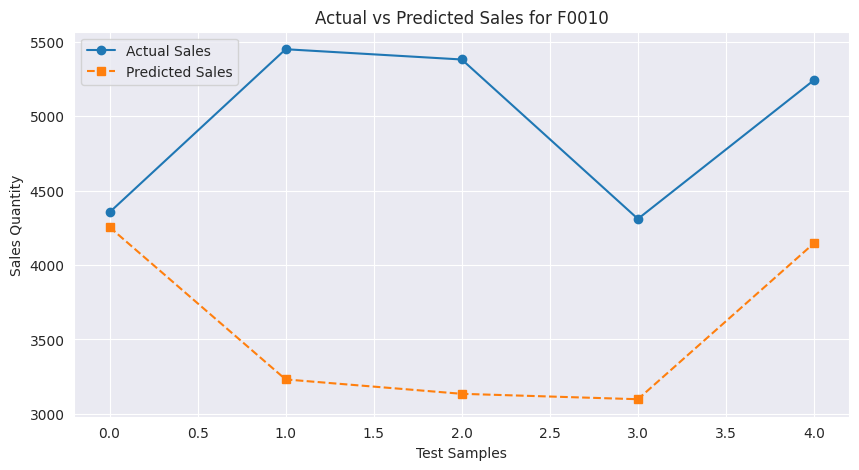

🚀 Training model for F0011...
✅ Accuracy for F0011: 74.94 %
📉 RMSE for F0011: 1394.01


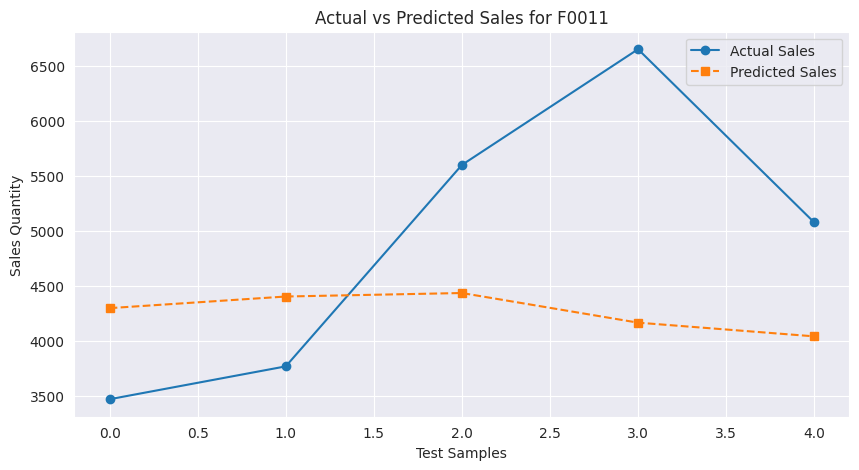

🚀 Training model for F0012...
✅ Accuracy for F0012: 73.49 %
📉 RMSE for F0012: 1249.41


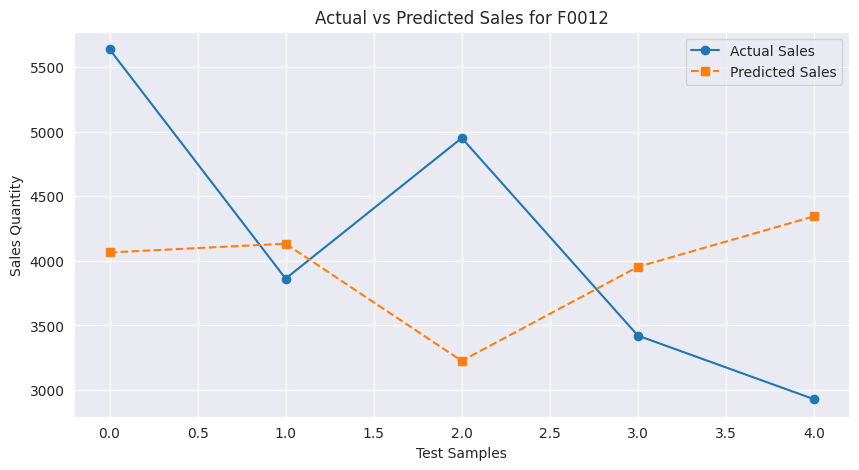

🚀 Training model for F0013...
✅ Accuracy for F0013: 81.76 %
📉 RMSE for F0013: 928.2


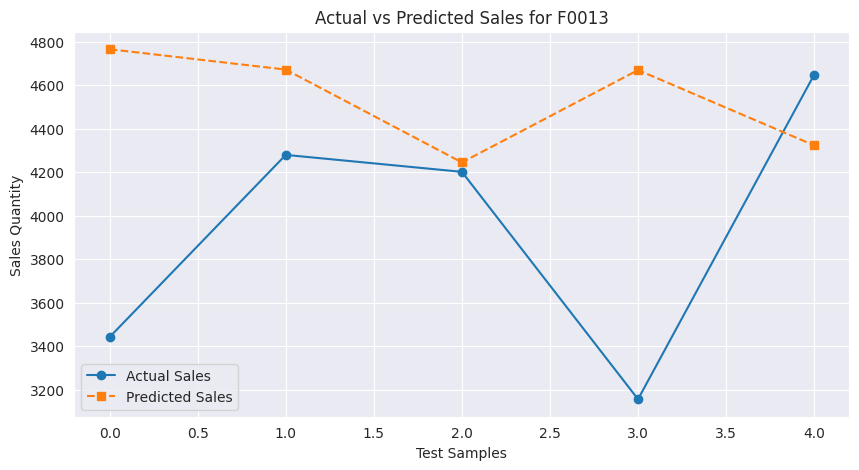

🚀 Training model for F0014...
✅ Accuracy for F0014: 76.98 %
📉 RMSE for F0014: 1004.77


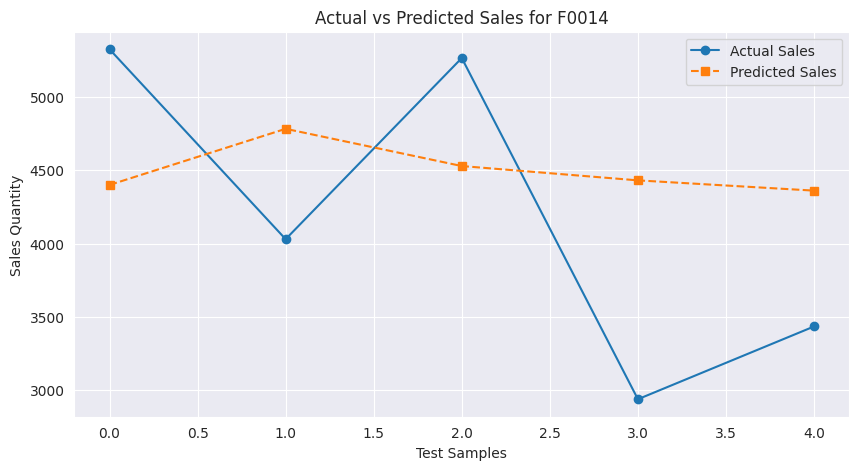

🚀 Training model for F0015...
✅ Accuracy for F0015: 82.12 %
📉 RMSE for F0015: 1024.93


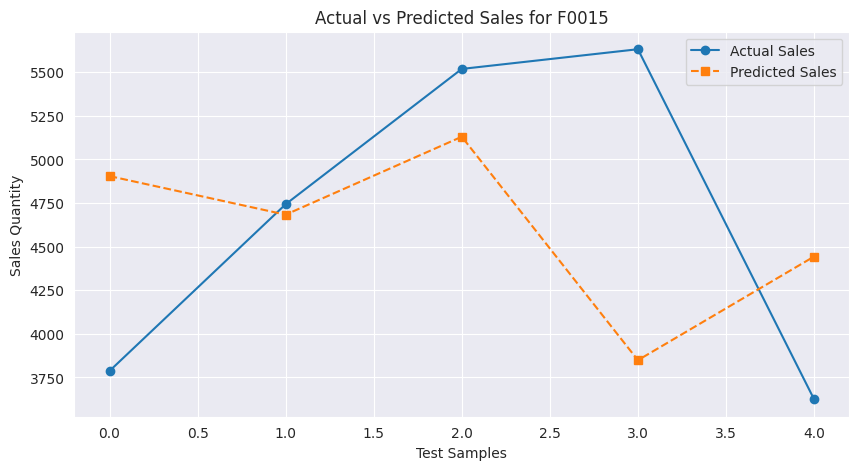

🚀 Training model for F0016...
✅ Accuracy for F0016: 79.08 %
📉 RMSE for F0016: 971.14


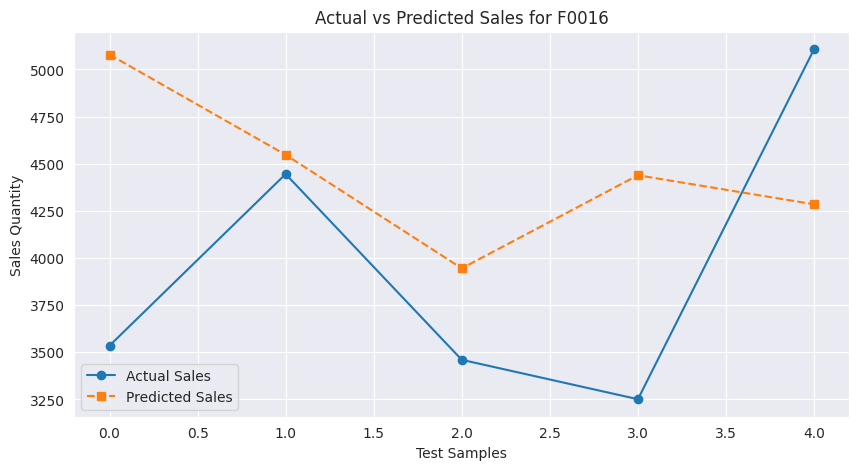

🚀 Training model for F0017...
✅ Accuracy for F0017: 69.98 %
📉 RMSE for F0017: 1724.77


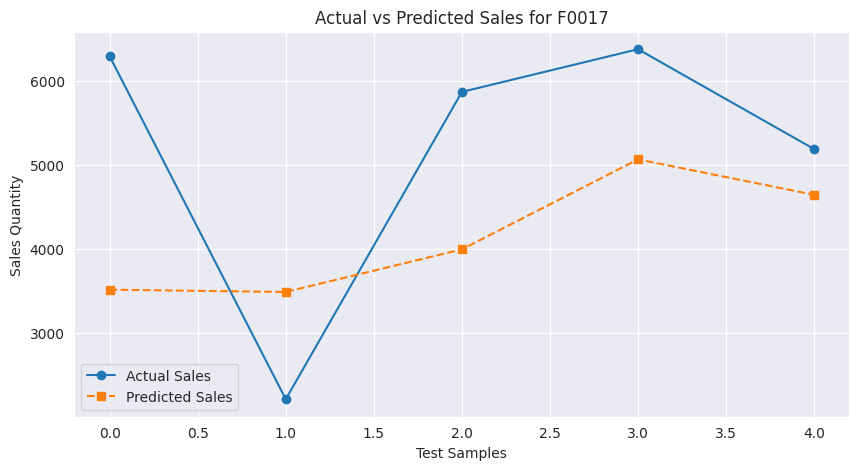

🚀 Training model for F0018...
✅ Accuracy for F0018: 80.44 %
📉 RMSE for F0018: 853.08


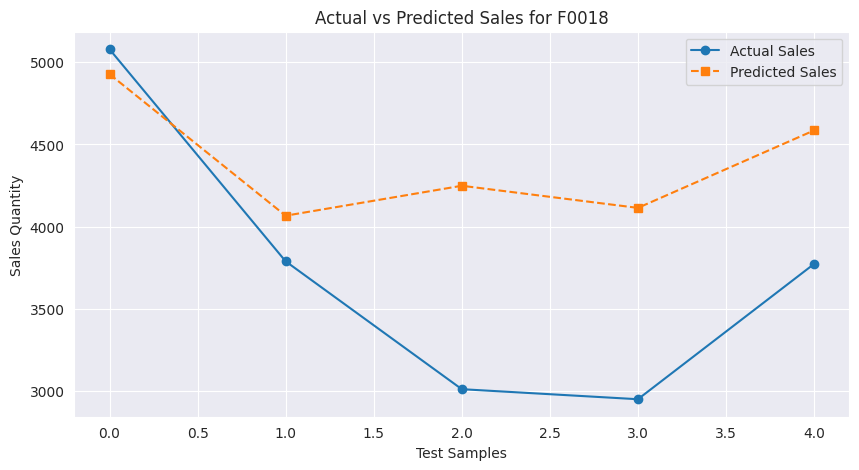

🚀 Training model for F0019...
✅ Accuracy for F0019: 85.54 %
📉 RMSE for F0019: 781.85


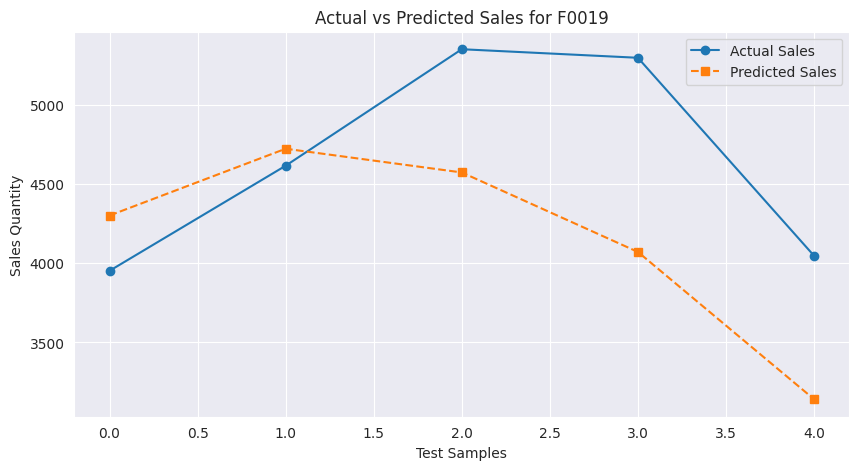

🚀 Training model for F0020...
✅ Accuracy for F0020: 80.86 %
📉 RMSE for F0020: 1035.12


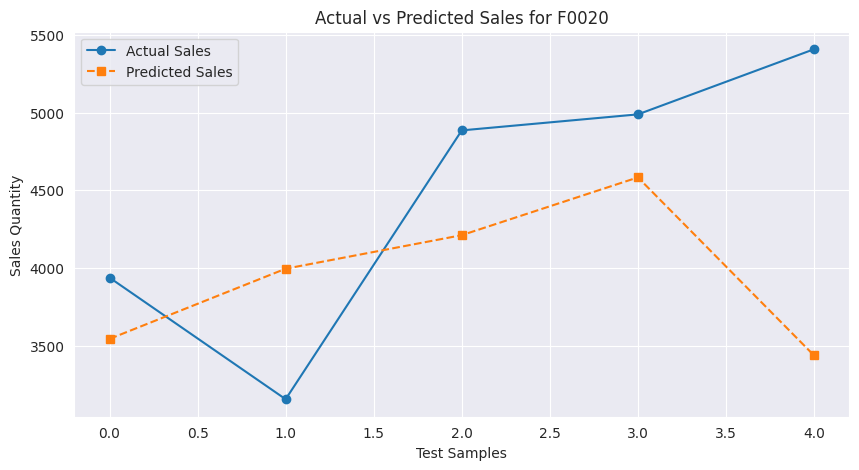

🚀 Training model for G0001...
✅ Accuracy for G0001: 80.69 %
📉 RMSE for G0001: 792.22


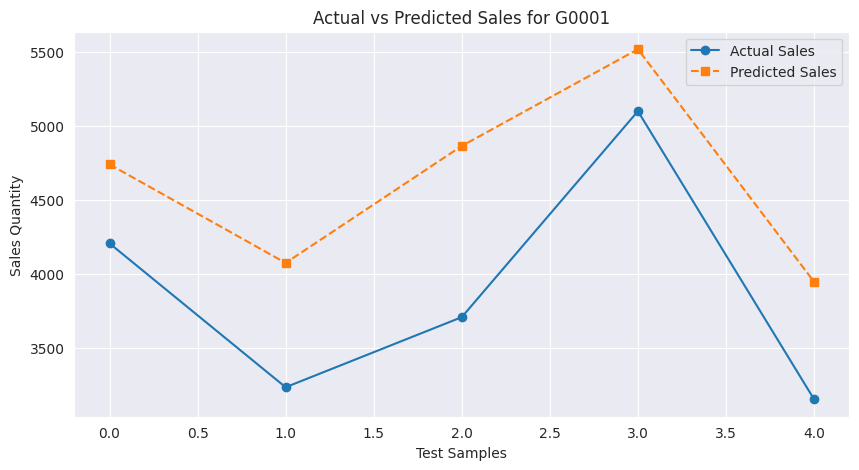

🚀 Training model for G0002...
✅ Accuracy for G0002: 83.71 %
📉 RMSE for G0002: 731.1


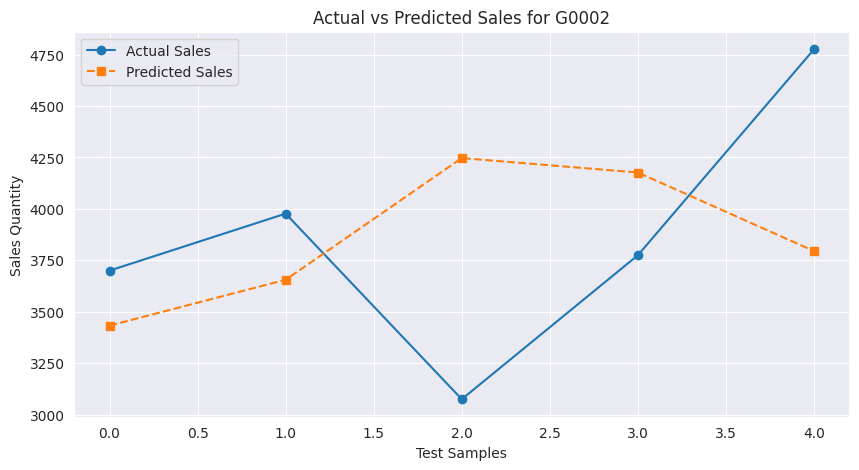

🚀 Training model for G0003...
✅ Accuracy for G0003: 77.66 %
📉 RMSE for G0003: 1193.61


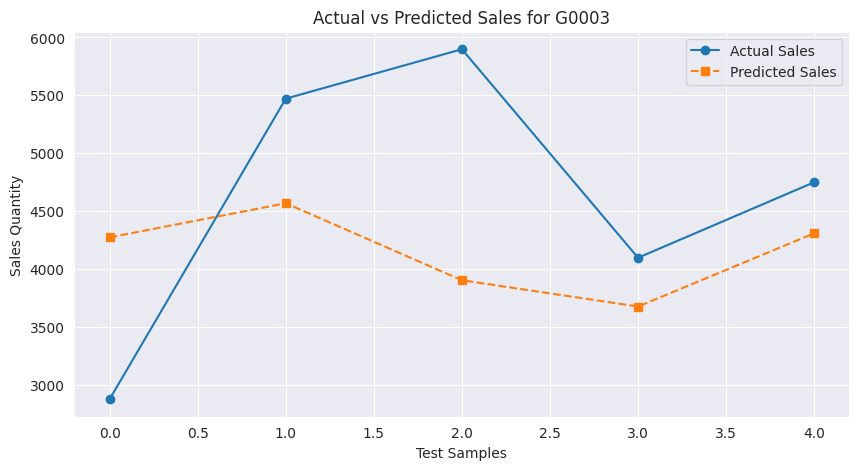

🚀 Training model for G0004...
✅ Accuracy for G0004: 71.4 %
📉 RMSE for G0004: 1404.48


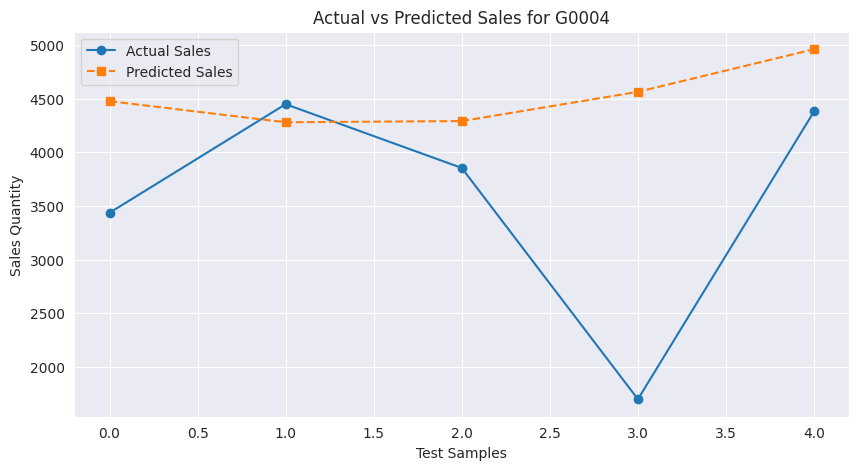

🚀 Training model for G0005...
✅ Accuracy for G0005: 68.39 %
📉 RMSE for G0005: 1469.69


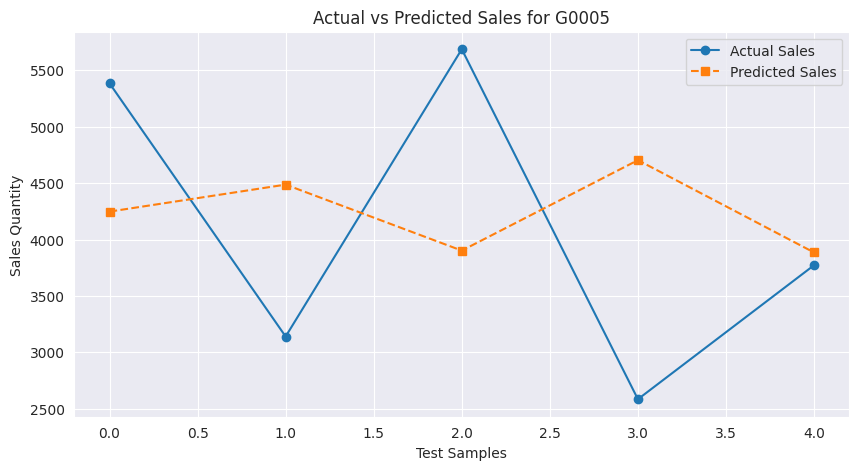

🚀 Training model for G0006...
✅ Accuracy for G0006: 84.03 %
📉 RMSE for G0006: 926.5


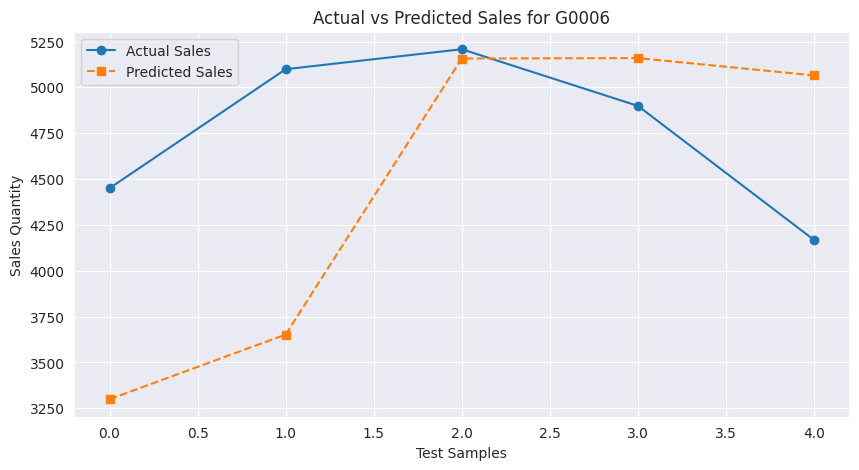

🚀 Training model for G0007...
✅ Accuracy for G0007: 72.6 %
📉 RMSE for G0007: 1108.13


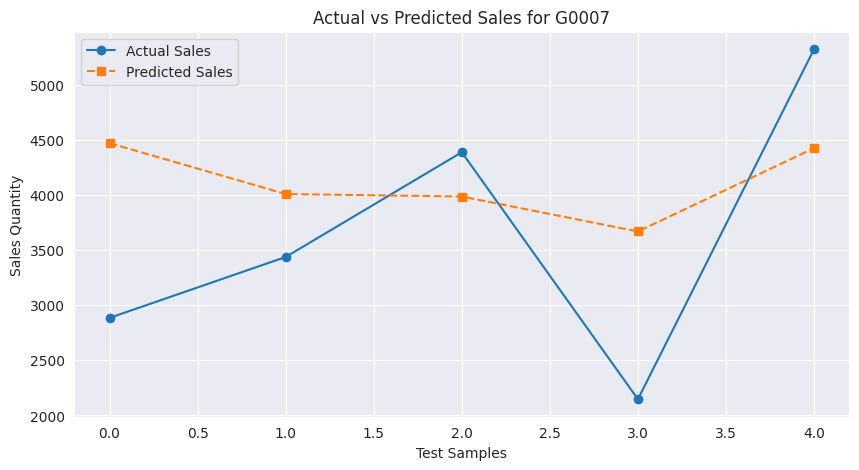

🚀 Training model for G0008...
✅ Accuracy for G0008: 74.61 %
📉 RMSE for G0008: 1042.94


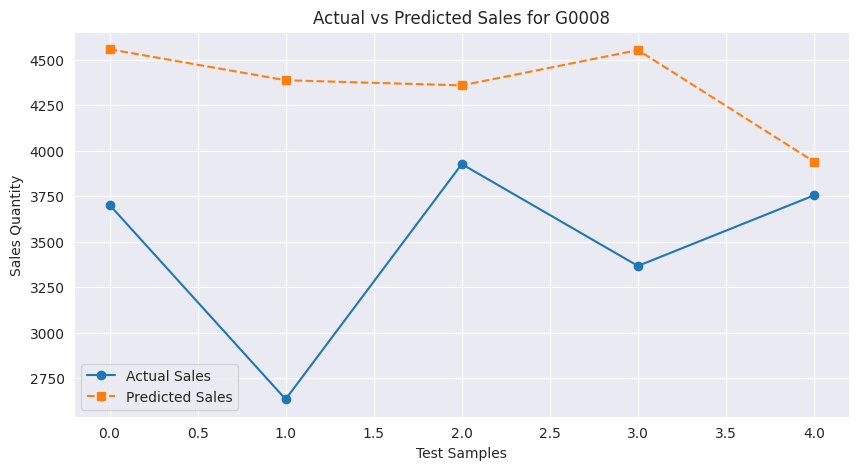

🚀 Training model for G0009...
✅ Accuracy for G0009: 85.31 %
📉 RMSE for G0009: 662.6


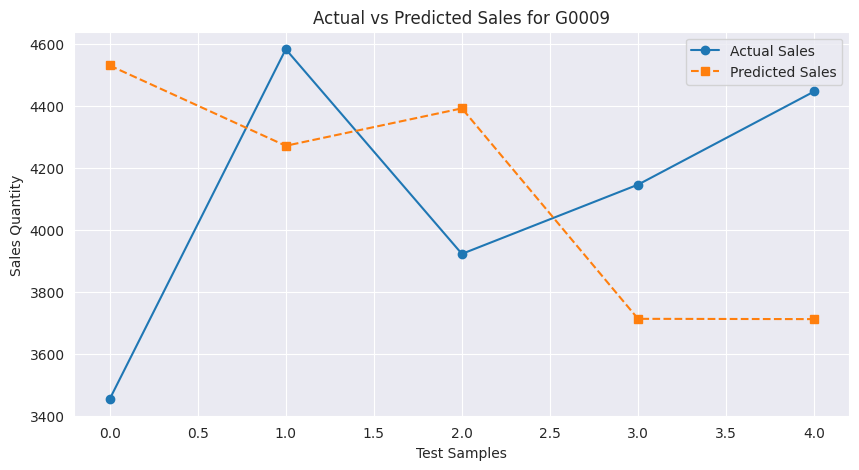

🚀 Training model for G0010...
✅ Accuracy for G0010: 87.61 %
📉 RMSE for G0010: 573.1


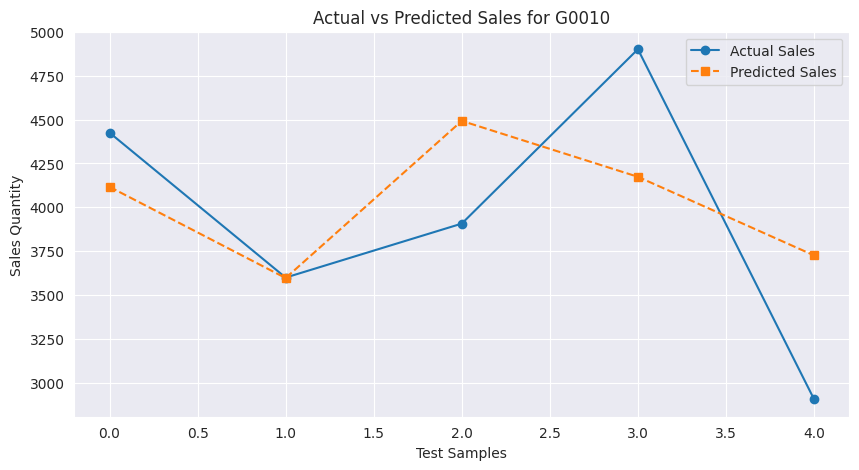

🚀 Training model for G0011...
✅ Accuracy for G0011: 85.15 %
📉 RMSE for G0011: 707.64


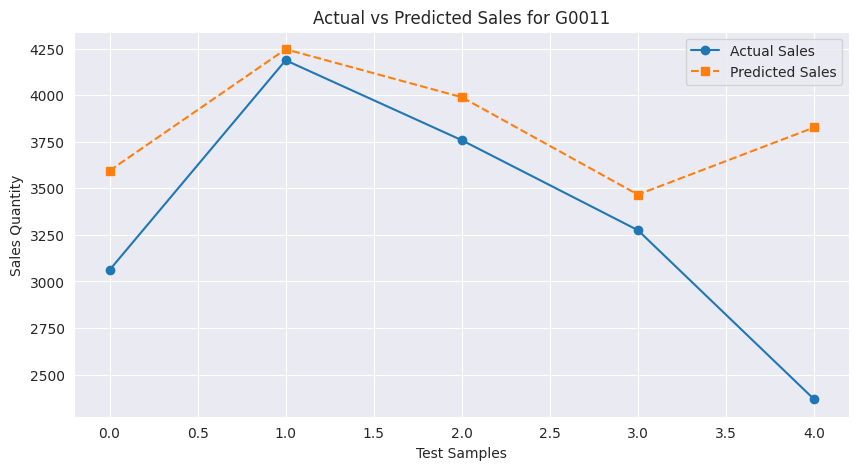

🚀 Training model for G0012...
✅ Accuracy for G0012: 75.79 %
📉 RMSE for G0012: 1083.53


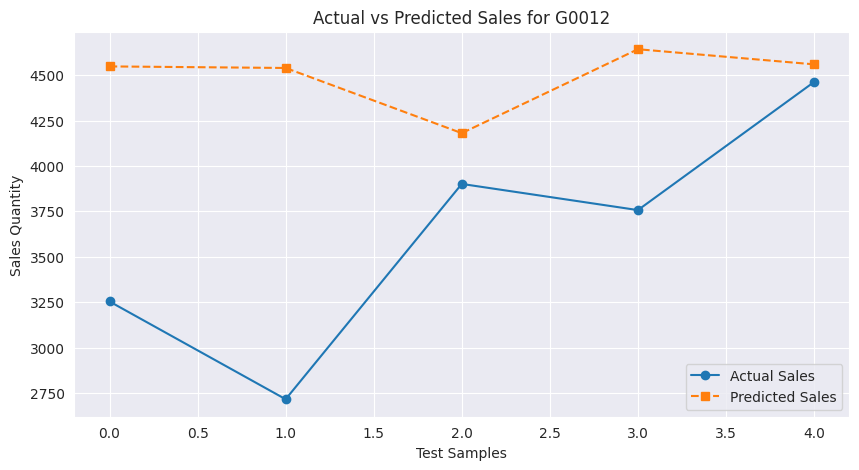

🚀 Training model for G0013...
✅ Accuracy for G0013: 82.72 %
📉 RMSE for G0013: 840.55


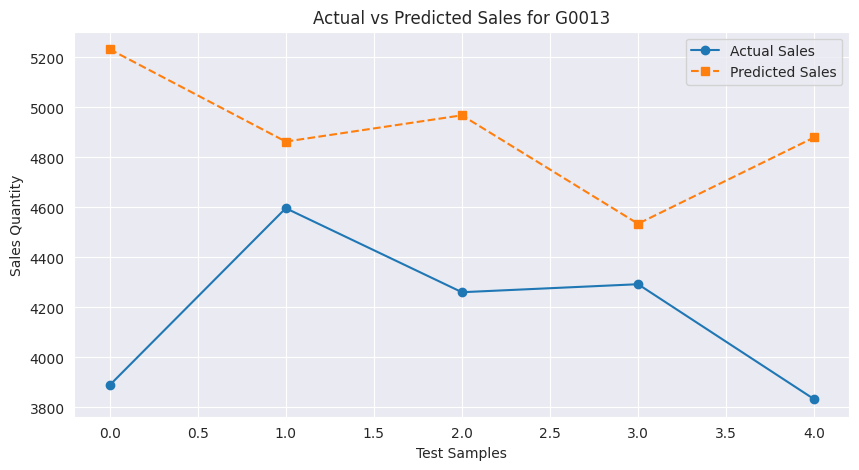

🚀 Training model for G0014...
✅ Accuracy for G0014: 67.62 %
📉 RMSE for G0014: 1557.28


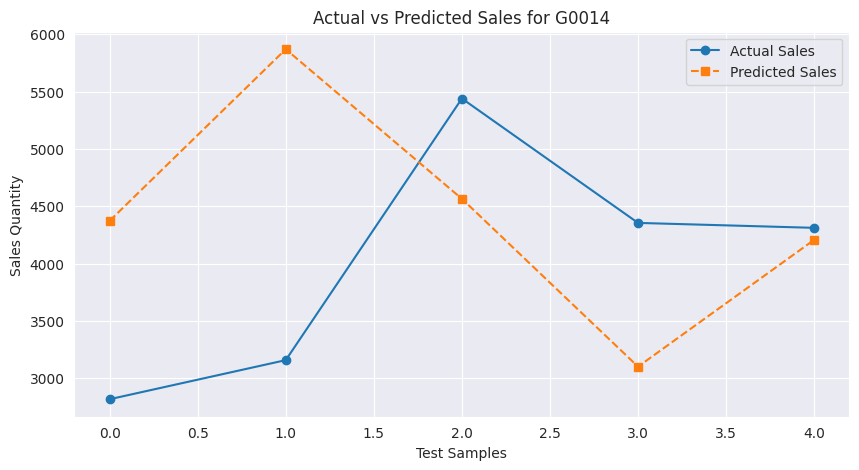

🚀 Training model for G0015...
✅ Accuracy for G0015: 86.26 %
📉 RMSE for G0015: 661.48


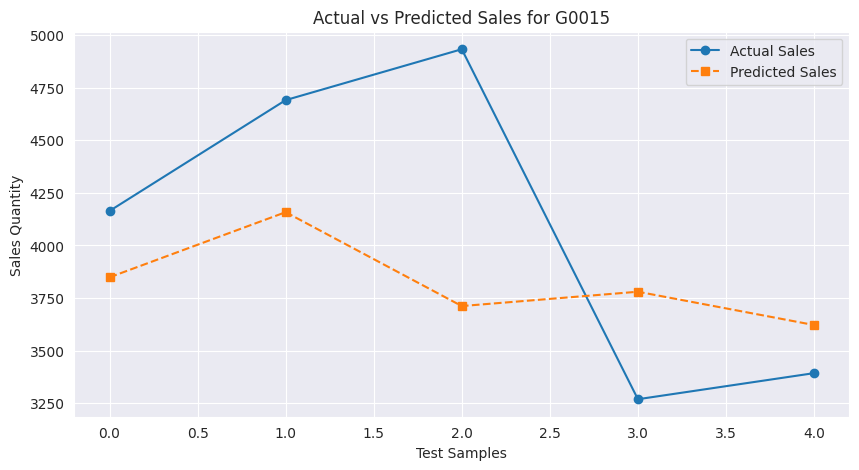

🚀 Training model for G0016...
✅ Accuracy for G0016: 90.37 %
📉 RMSE for G0016: 587.35


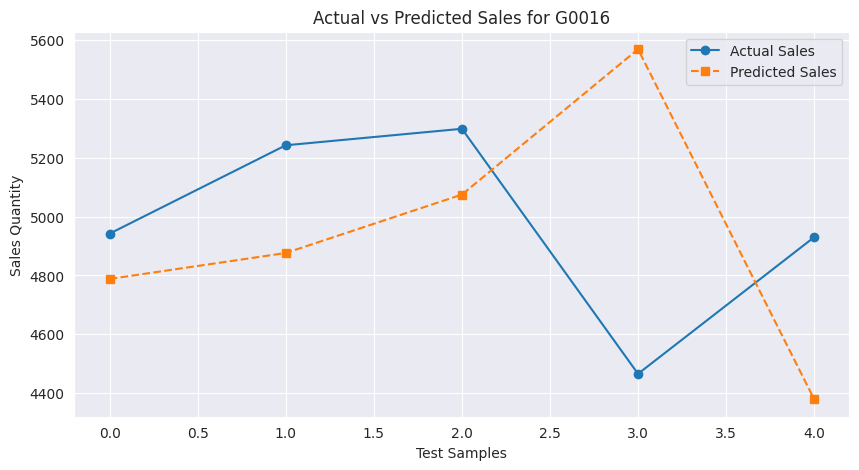

🚀 Training model for G0017...
✅ Accuracy for G0017: 80.05 %
📉 RMSE for G0017: 887.54


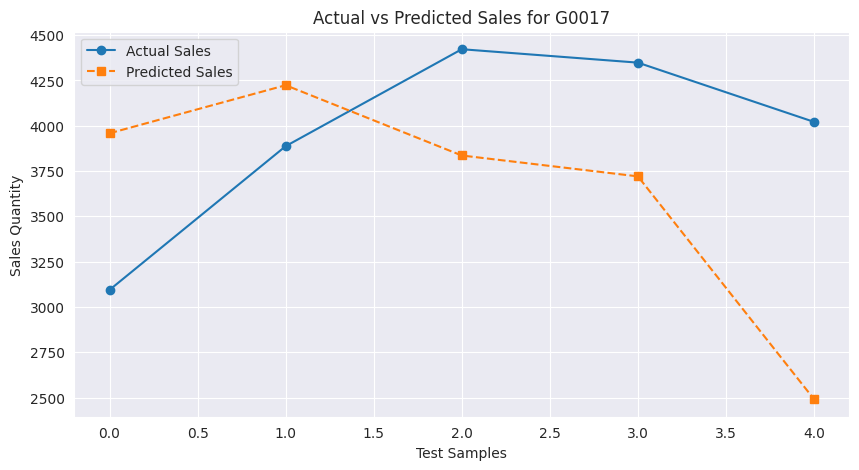

🚀 Training model for G0018...
✅ Accuracy for G0018: 86.36 %
📉 RMSE for G0018: 656.51


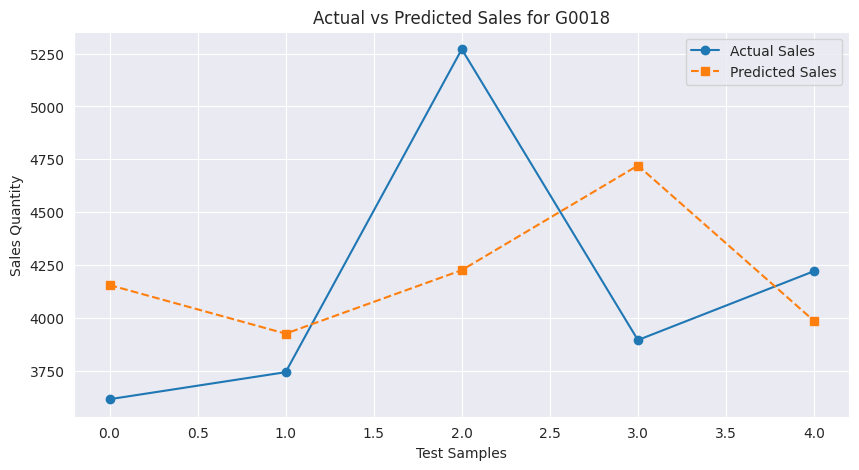

🚀 Training model for G0019...
✅ Accuracy for G0019: 92.7 %
📉 RMSE for G0019: 431.75


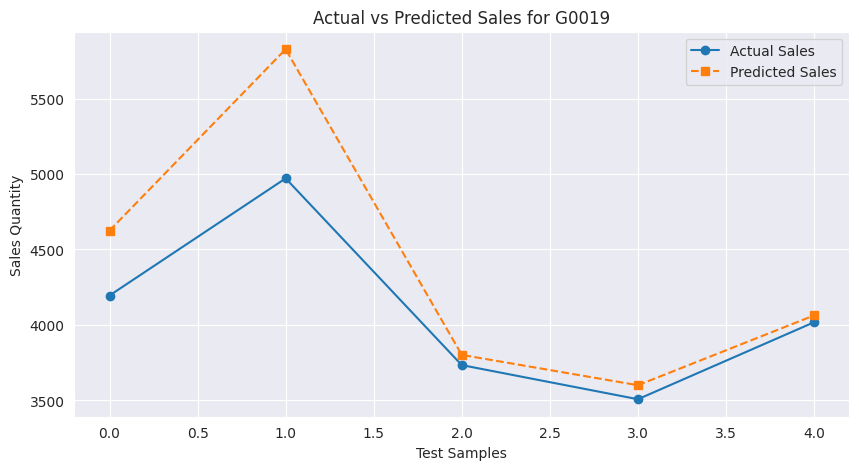

🚀 Training model for G0020...
✅ Accuracy for G0020: 62.03 %
📉 RMSE for G0020: 1405.2


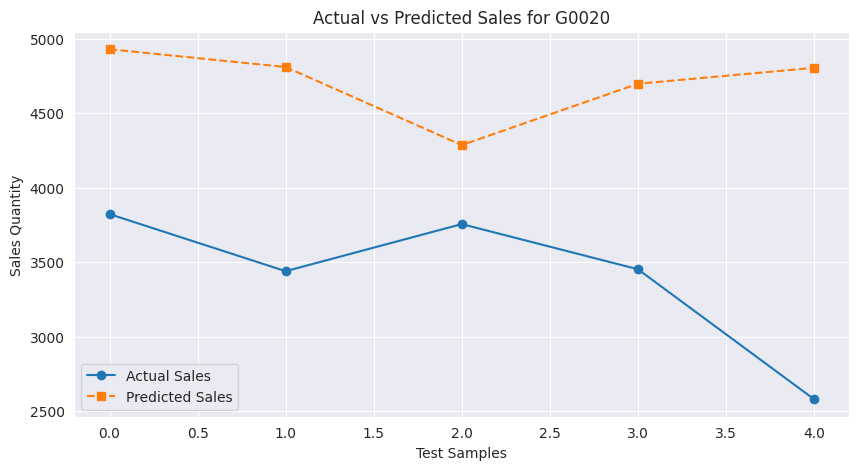

🚀 Training model for T0001...
✅ Accuracy for T0001: 73.93 %
📉 RMSE for T0001: 1458.65


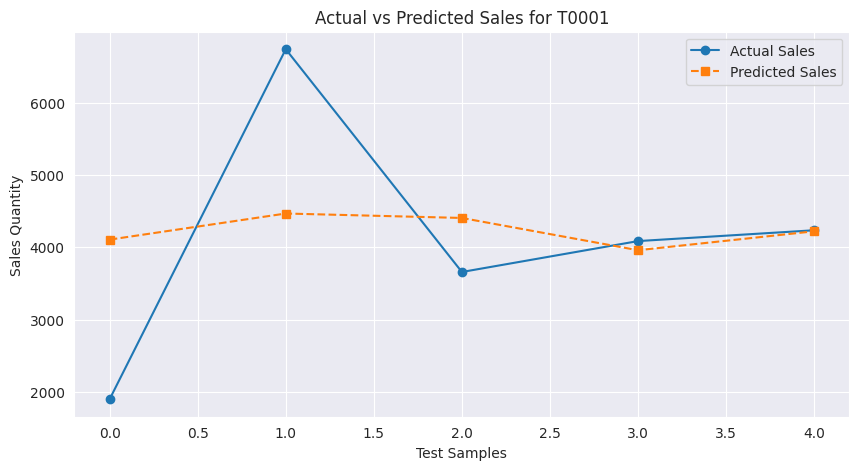

🚀 Training model for T0002...
✅ Accuracy for T0002: 83.8 %
📉 RMSE for T0002: 795.96


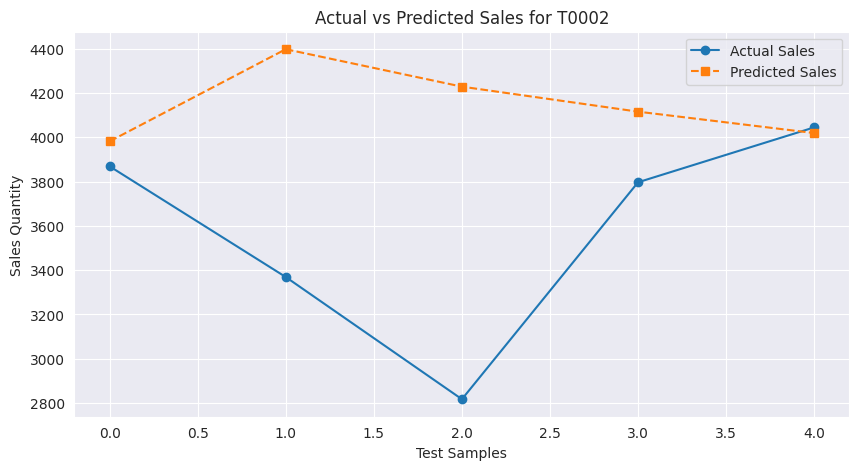

🚀 Training model for T0003...
✅ Accuracy for T0003: 86.9 %
📉 RMSE for T0003: 646.12


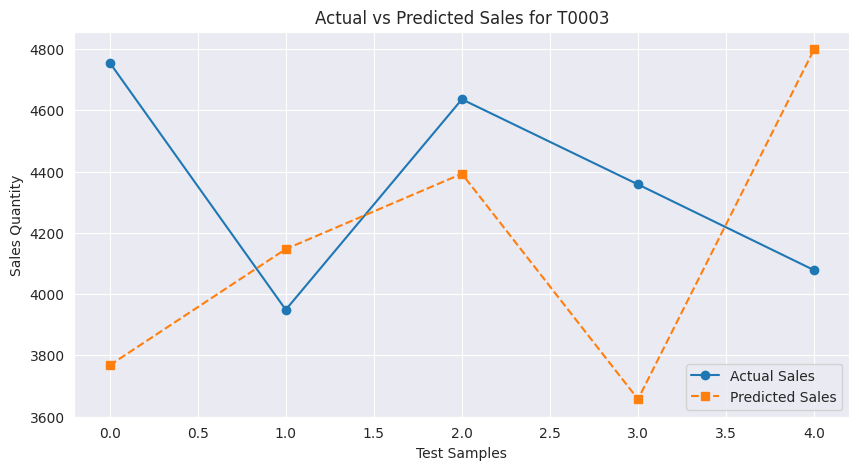

🚀 Training model for T0004...
✅ Accuracy for T0004: 86.82 %
📉 RMSE for T0004: 751.34


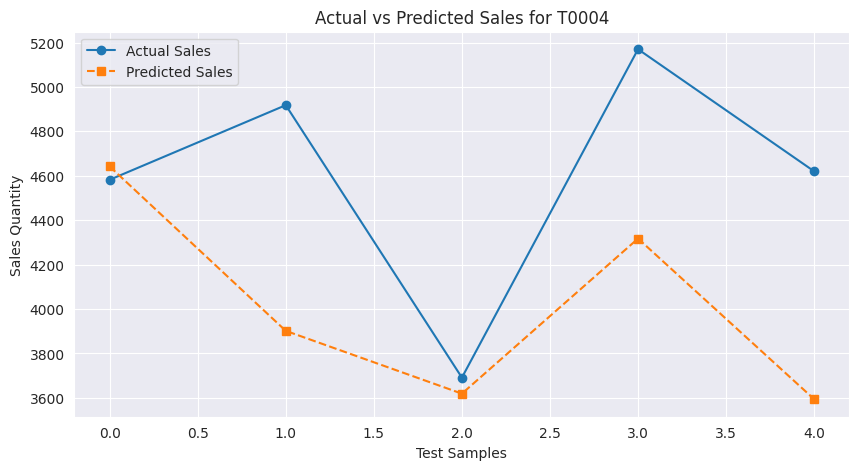

🚀 Training model for T0005...
✅ Accuracy for T0005: 87.16 %
📉 RMSE for T0005: 687.89


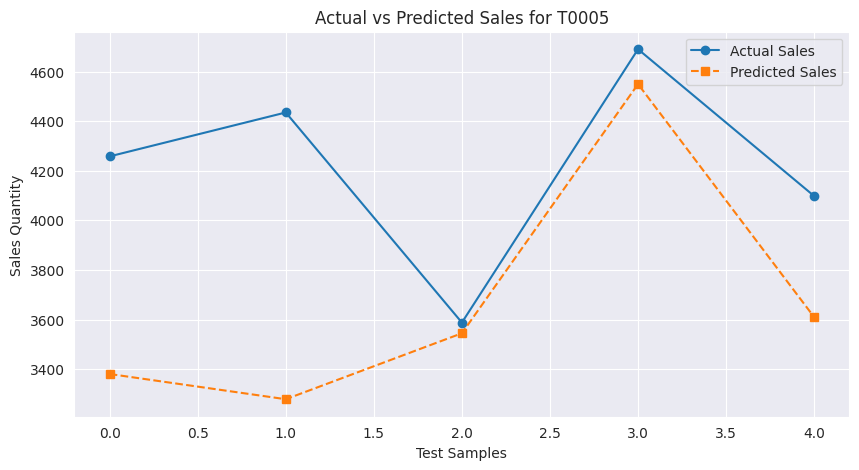

🚀 Training model for T0006...
✅ Accuracy for T0006: 72.99 %
📉 RMSE for T0006: 1285.33


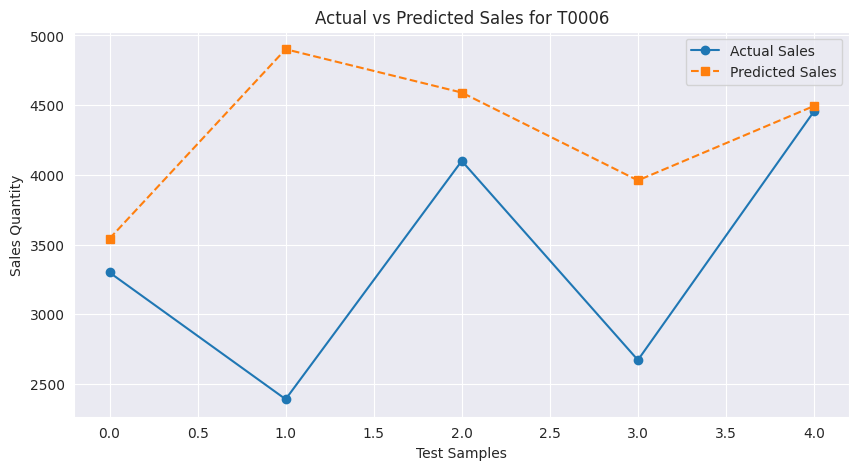

🚀 Training model for T0007...
✅ Accuracy for T0007: 58.55 %
📉 RMSE for T0007: 1747.93


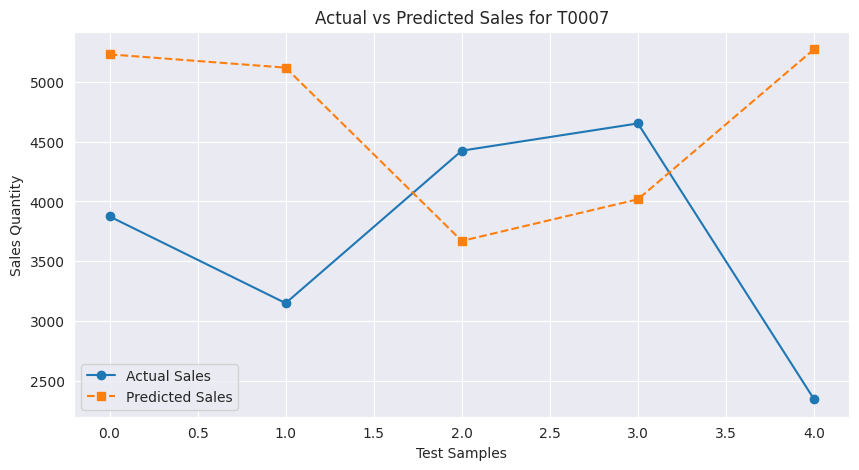

🚀 Training model for T0008...
✅ Accuracy for T0008: 83.08 %
📉 RMSE for T0008: 898.61


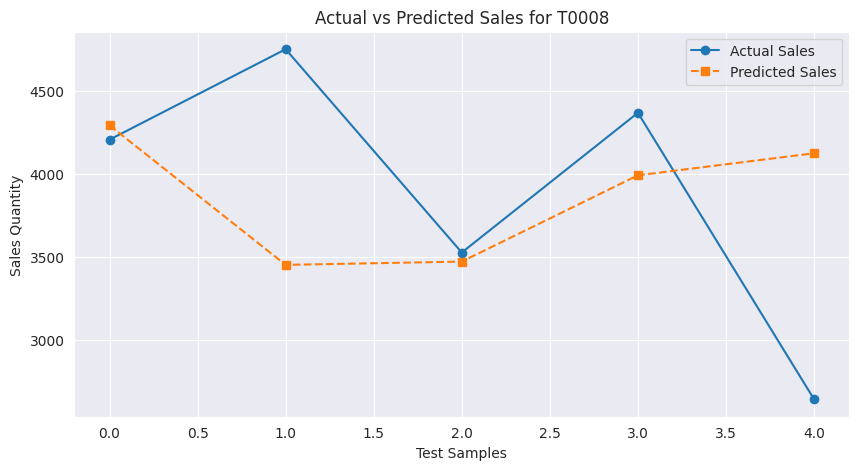

🚀 Training model for T0009...
✅ Accuracy for T0009: 68.14 %
📉 RMSE for T0009: 1502.92


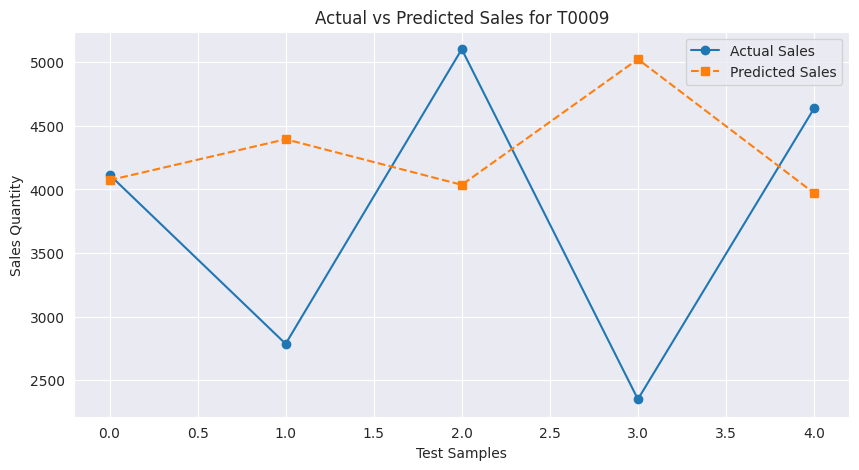

🚀 Training model for T0010...
✅ Accuracy for T0010: 92.8 %
📉 RMSE for T0010: 345.03


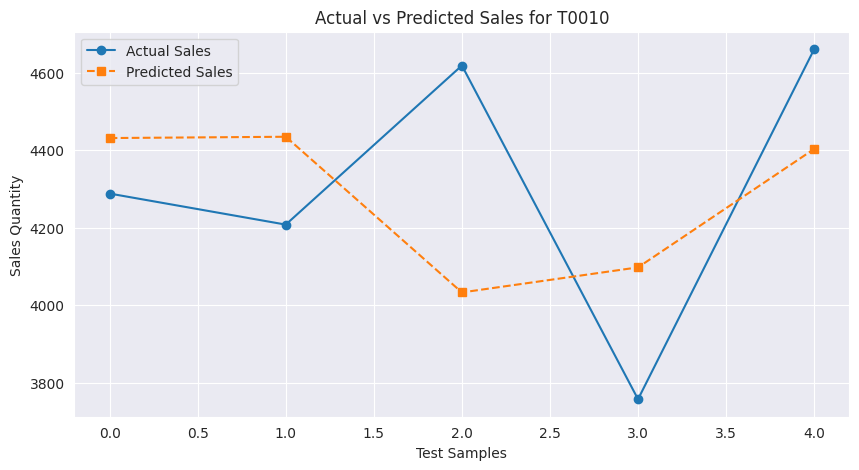

🚀 Training model for T0011...
✅ Accuracy for T0011: 89.58 %
📉 RMSE for T0011: 483.79


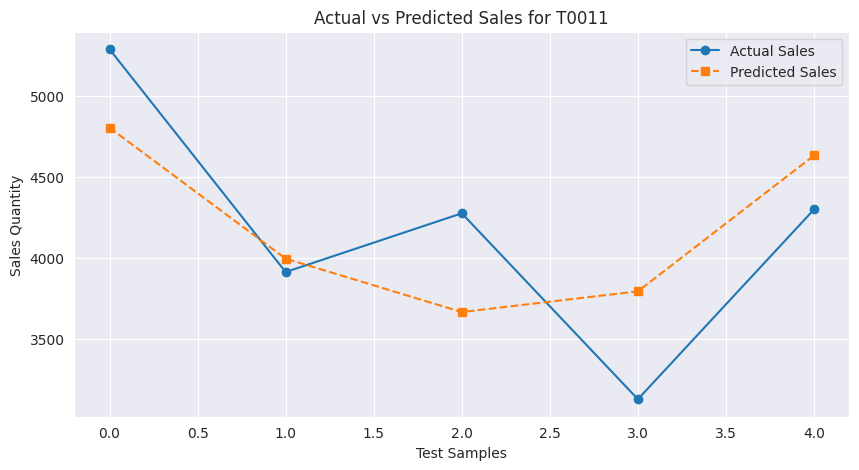

🚀 Training model for T0012...
✅ Accuracy for T0012: 74.71 %
📉 RMSE for T0012: 1334.4


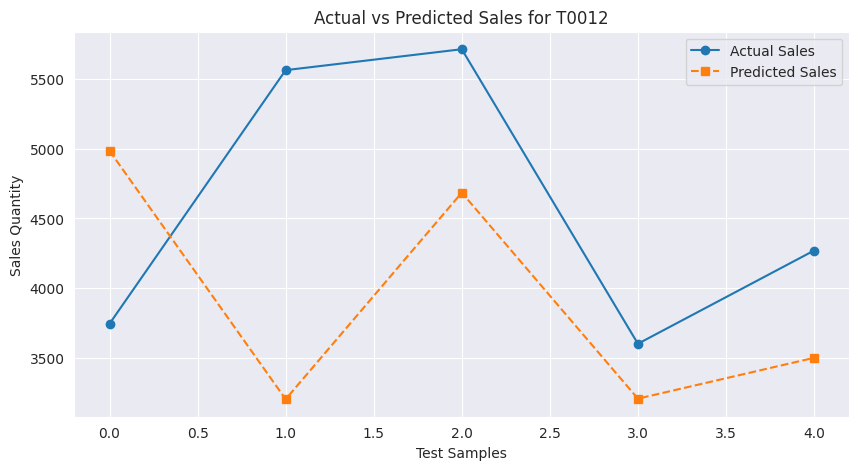

🚀 Training model for T0013...
✅ Accuracy for T0013: 82.71 %
📉 RMSE for T0013: 821.96


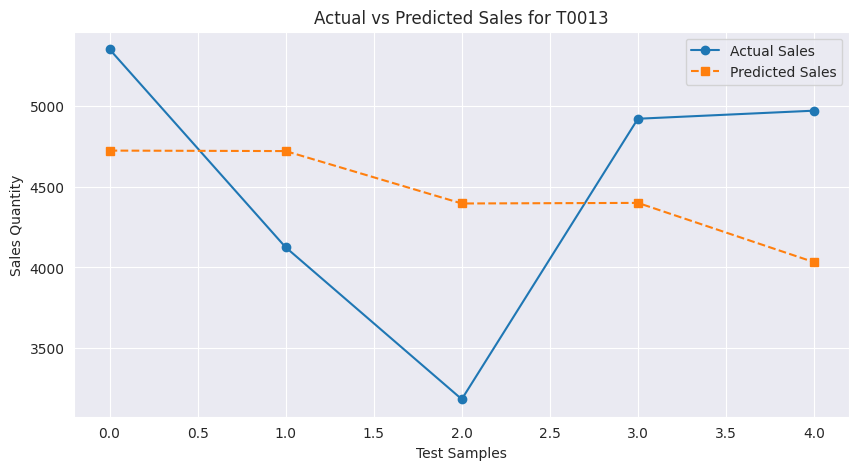

🚀 Training model for T0014...
✅ Accuracy for T0014: 74.26 %
📉 RMSE for T0014: 1407.74


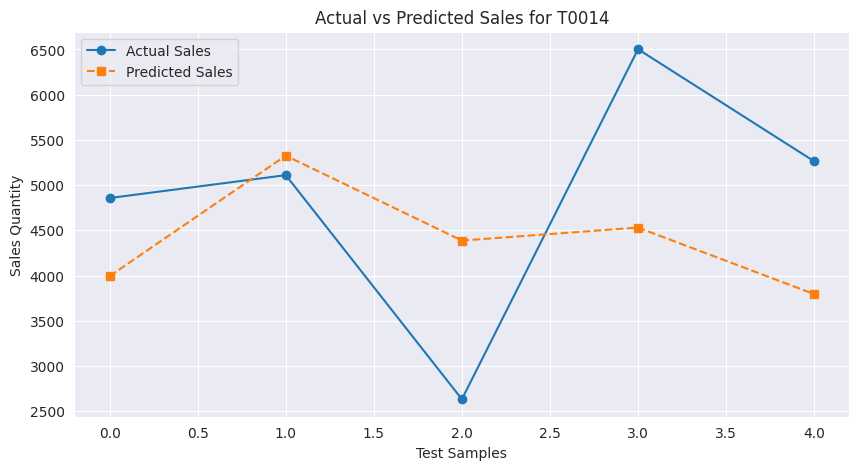

🚀 Training model for T0015...
✅ Accuracy for T0015: 77.71 %
📉 RMSE for T0015: 994.68


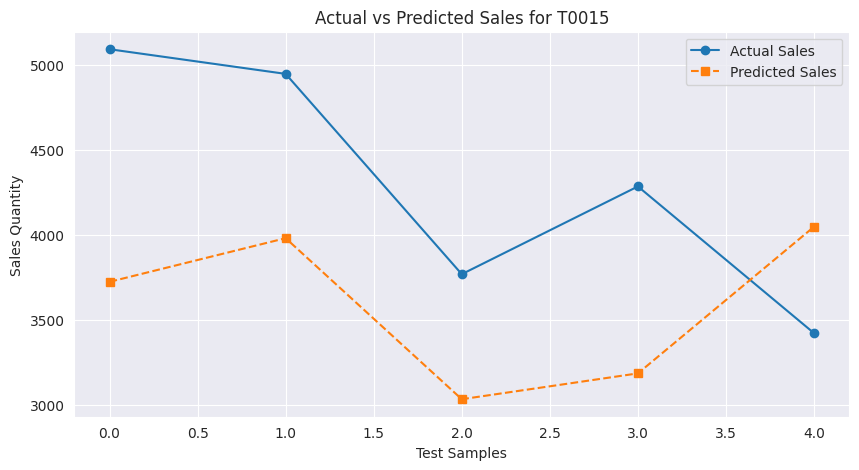

🚀 Training model for T0016...
✅ Accuracy for T0016: 78.29 %
📉 RMSE for T0016: 1175.54


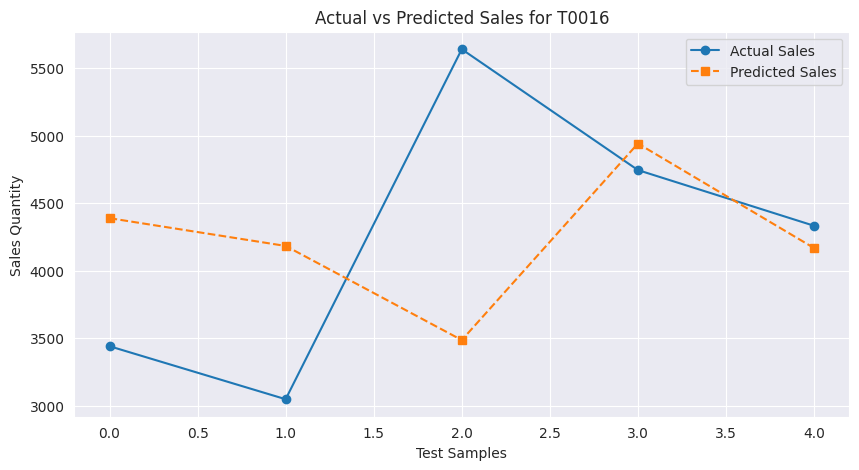

🚀 Training model for T0017...
✅ Accuracy for T0017: 75.89 %
📉 RMSE for T0017: 1056.87


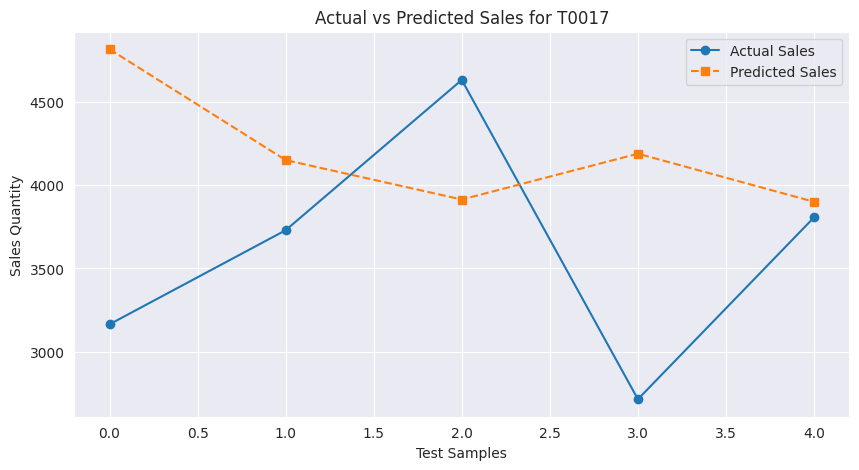

🚀 Training model for T0018...
✅ Accuracy for T0018: 74.83 %
📉 RMSE for T0018: 1022.6


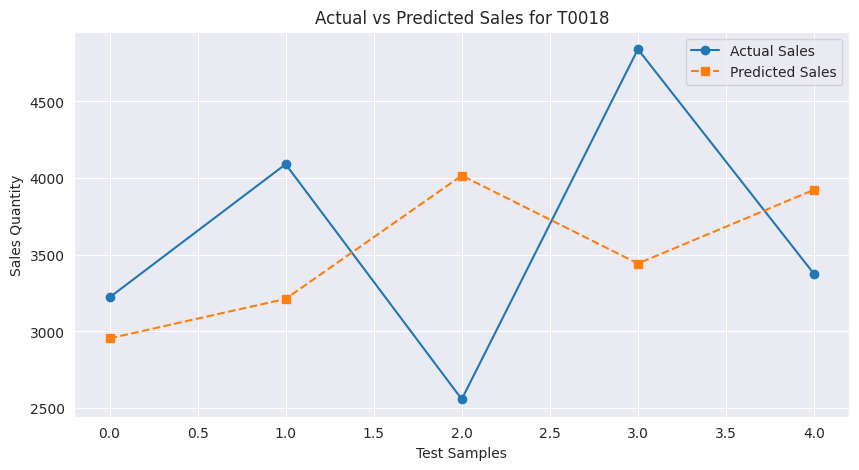

🚀 Training model for T0019...
✅ Accuracy for T0019: 76.24 %
📉 RMSE for T0019: 1046.22


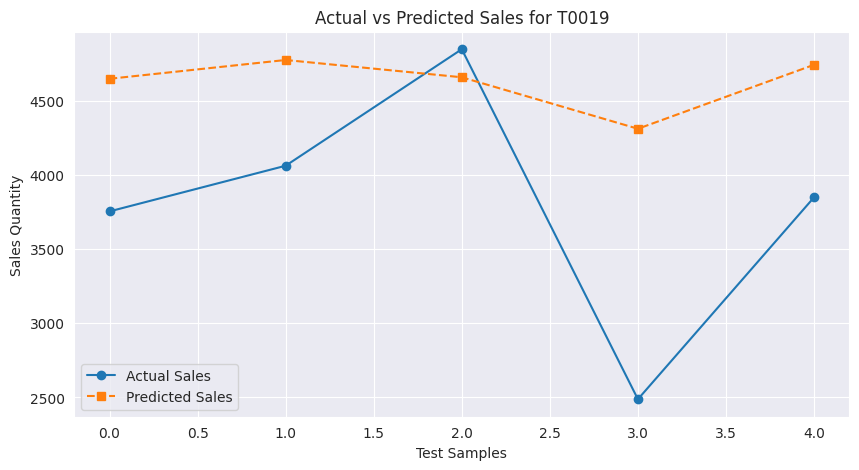

🚀 Training model for T0020...
✅ Accuracy for T0020: 85.94 %
📉 RMSE for T0020: 702.44


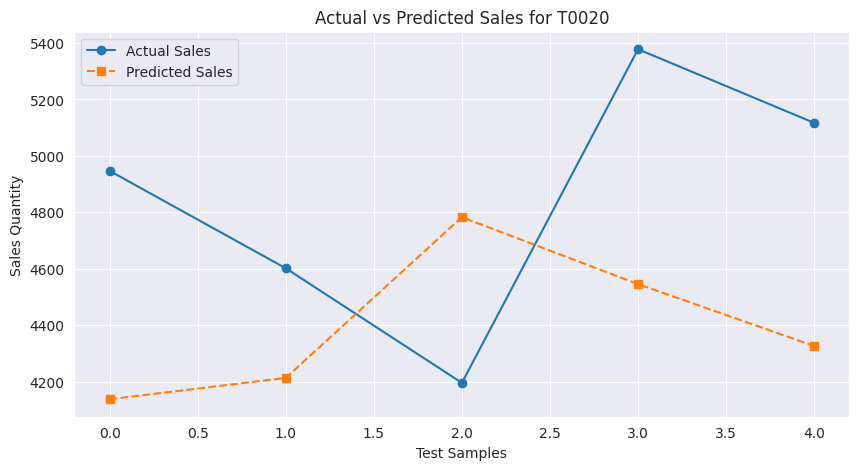

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error

# Tạo dictionary chứa DataFrame của từng Product ID
# product_dfs = {
#     "P0001": df_t0001,
#     "P0002": df_t0002,
#     "P0003": df_t0003,
#     "P0004": df_t0004,
# },
# Duyệt qua từng Product ID để train mô hình
results = {}

for product_id, finaldf in product_dfs.items():
    print(f"🚀 Training model for {product_id}...")

    # Chia dữ liệu train-test (20% cuối làm test)
    test_length = int(0.1 * len(finaldf))
    end_point = len(finaldf)
    x = end_point - test_length

    finaldf_train = finaldf.loc[:x - 1, :]
    finaldf_test = finaldf.loc[x:, :]

    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != 'Sales_Quantity']
    finaldf_train_y = finaldf_train['Sales_Quantity']
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != 'Sales_Quantity']
    finaldf_test_y = finaldf_test['Sales_Quantity']

    # Chuyển tên cột thành string (tránh lỗi)
    finaldf_train_x.columns = finaldf_train_x.columns.astype(str)
    finaldf_test_x.columns = finaldf_test_x.columns.astype(str)

    # Khởi tạo mô hình Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=1)

    # RFE chọn 4 đặc trưng quan trọng
    rfe = RFE(estimator=rf, n_features_to_select=4)
    fit = rfe.fit(finaldf_train_x, finaldf_train_y)

    # Dự đoán
    y_pred = fit.predict(finaldf_test_x)
    y_true = np.array(finaldf_test_y)

    # Đánh giá mô hình
    sumvalue = np.sum(y_true)
    mape = np.sum(np.abs((y_true - y_pred))) / sumvalue * 100
    accuracy = 100 - mape

    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    print(f'✅ Accuracy for {product_id}:', round(accuracy, 2), '%')
    print(f'📉 RMSE for {product_id}:', round(rmse, 2))

    # Lưu kết quả
    results[product_id] = {
        "accuracy": accuracy,
        "rmse": rmse,
        "y_true": y_true,
        "y_pred": y_pred
    }

    # 🔹 Vẽ biểu đồ
    plt.figure(figsize=(10, 5))
    plt.plot(y_true, label="Actual Sales", marker='o')
    plt.plot(y_pred, label="Predicted Sales", marker='s', linestyle='dashed')

    plt.xlabel("Test Samples")
    plt.ylabel("Sales Quantity")
    plt.title(f"Actual vs Predicted Sales for {product_id}")
    plt.legend()
    plt.grid(True)
    plt.show()


🚀 Training model for C0001...
✅ Accuracy for C0001: 78.71 %
📉 RMSE for C0001: 1021.6


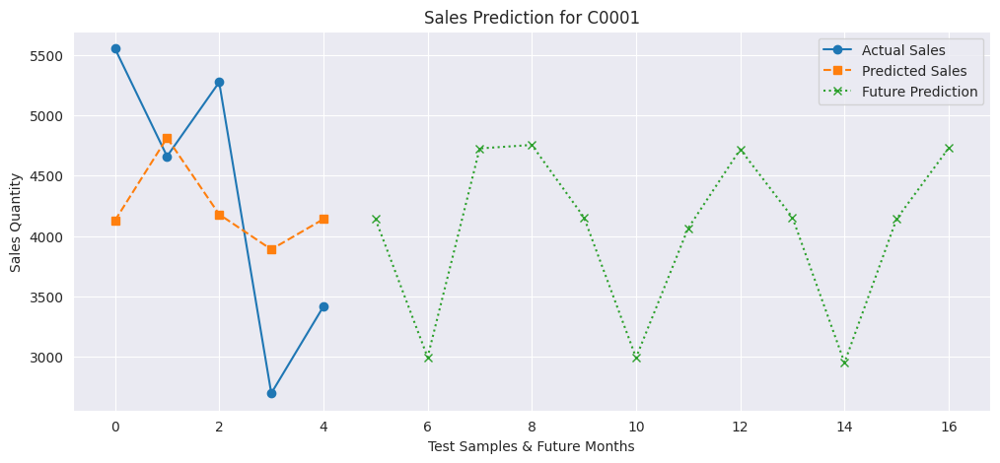

🚀 Training model for C0002...
✅ Accuracy for C0002: 80.18 %
📉 RMSE for C0002: 897.58


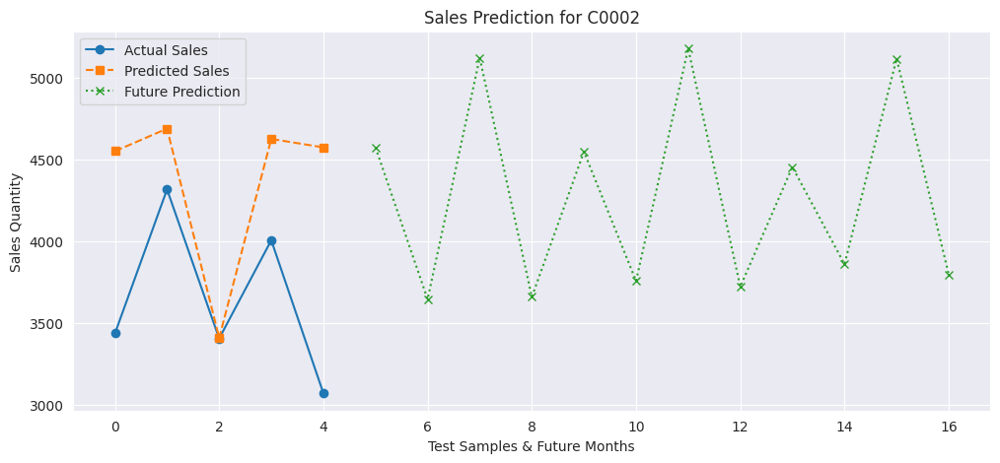

🚀 Training model for C0003...
✅ Accuracy for C0003: 77.95 %
📉 RMSE for C0003: 918.85


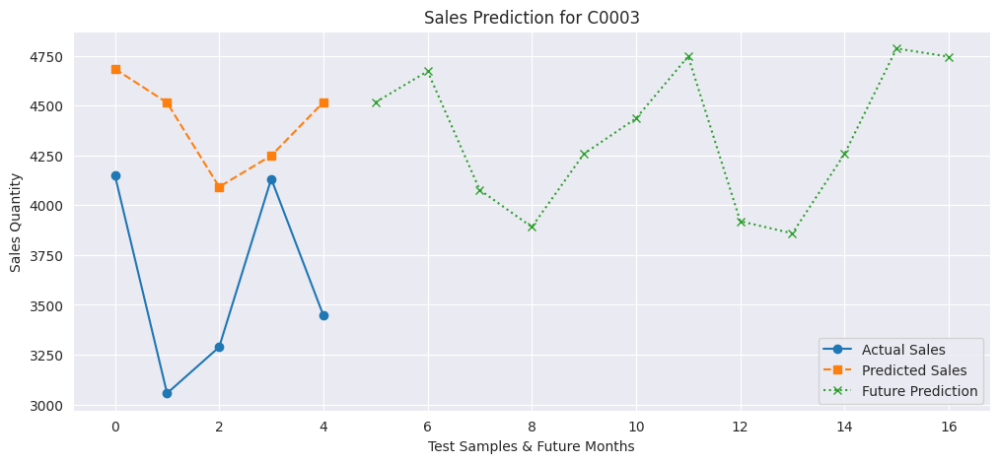

🚀 Training model for C0004...
✅ Accuracy for C0004: 79.13 %
📉 RMSE for C0004: 959.78


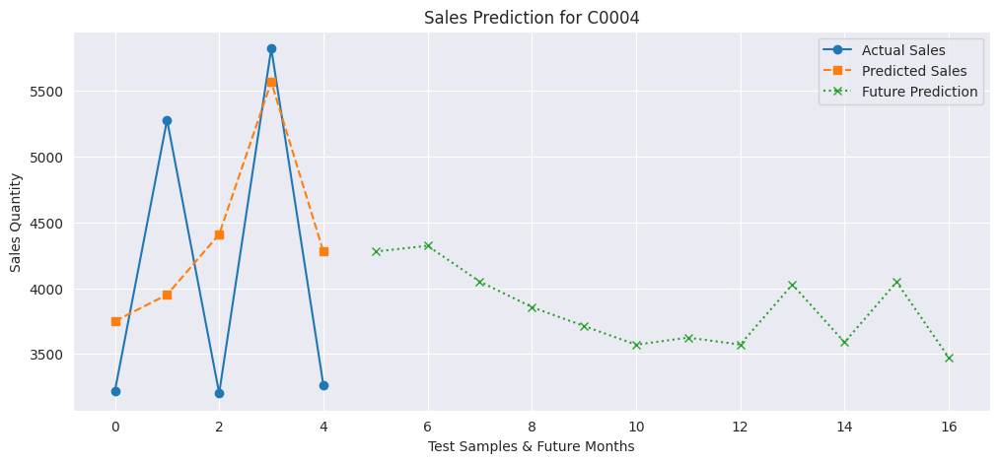

🚀 Training model for C0005...
✅ Accuracy for C0005: 83.27 %
📉 RMSE for C0005: 756.35


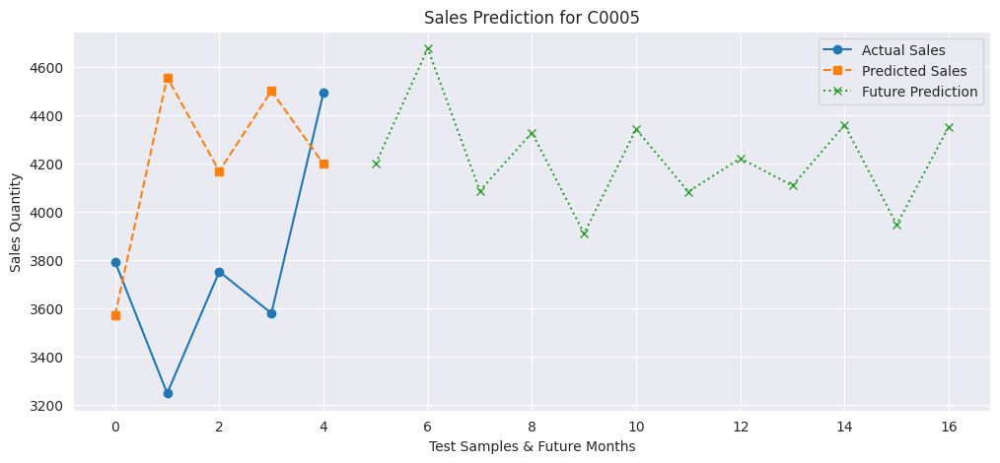

🚀 Training model for C0006...
✅ Accuracy for C0006: 81.4 %
📉 RMSE for C0006: 958.58


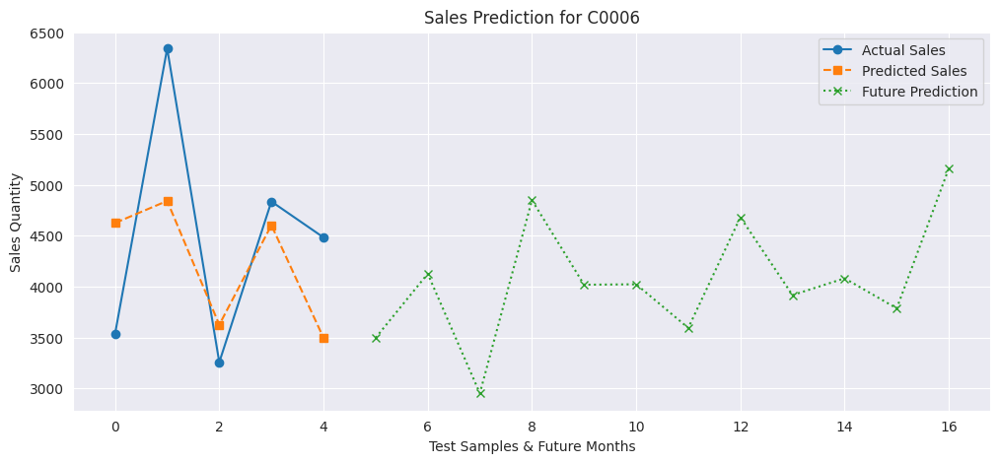

🚀 Training model for C0007...
✅ Accuracy for C0007: 78.13 %
📉 RMSE for C0007: 1123.95


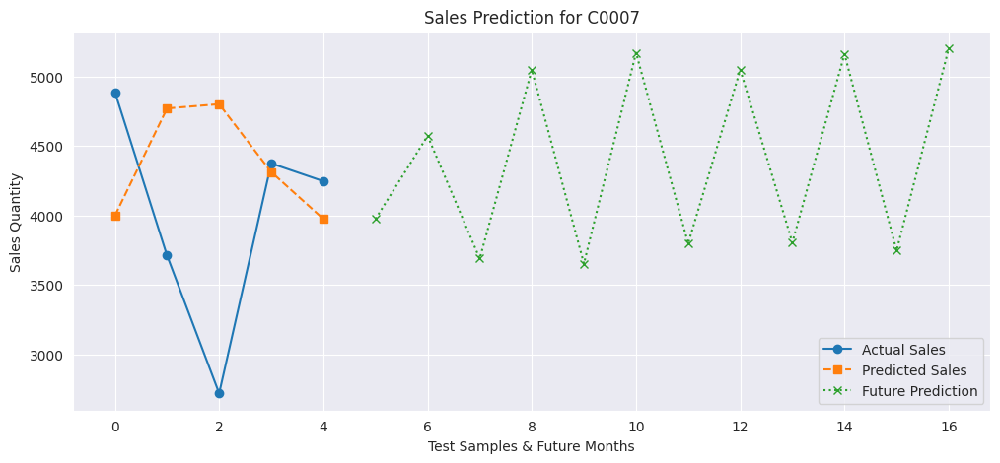

🚀 Training model for C0008...
✅ Accuracy for C0008: 81.27 %
📉 RMSE for C0008: 901.38


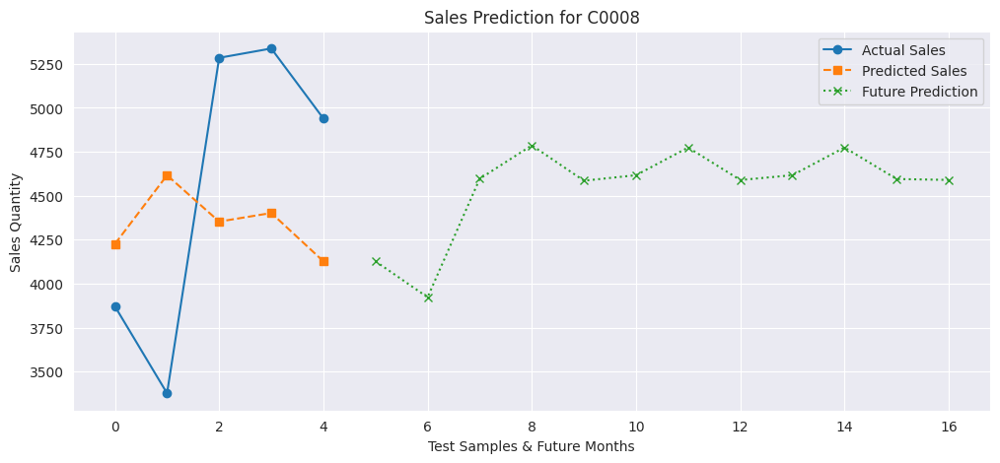

🚀 Training model for C0009...
✅ Accuracy for C0009: 84.38 %
📉 RMSE for C0009: 751.01


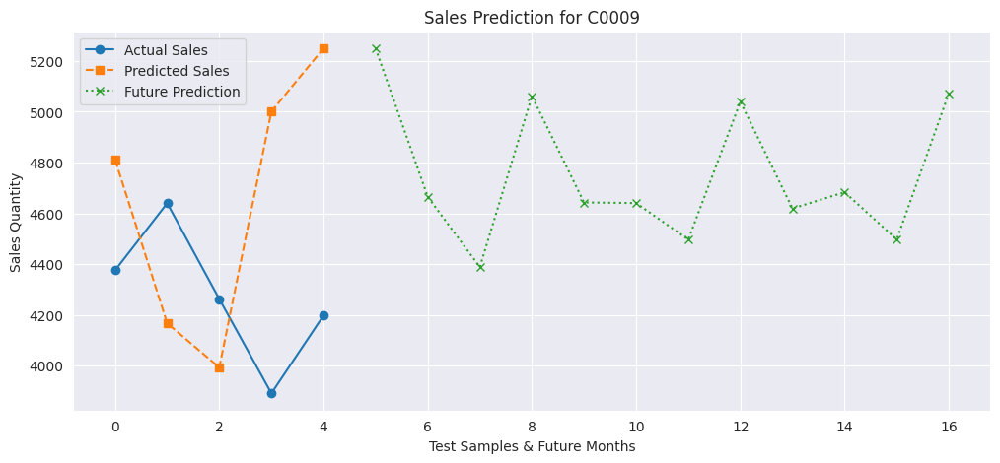

🚀 Training model for C0010...
✅ Accuracy for C0010: 68.43 %
📉 RMSE for C0010: 1260.45


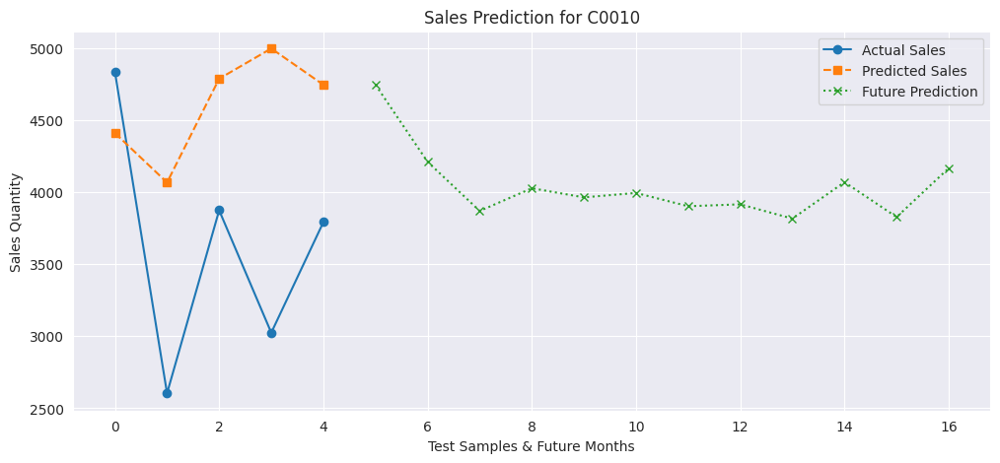

🚀 Training model for C0011...
✅ Accuracy for C0011: 86.09 %
📉 RMSE for C0011: 799.91


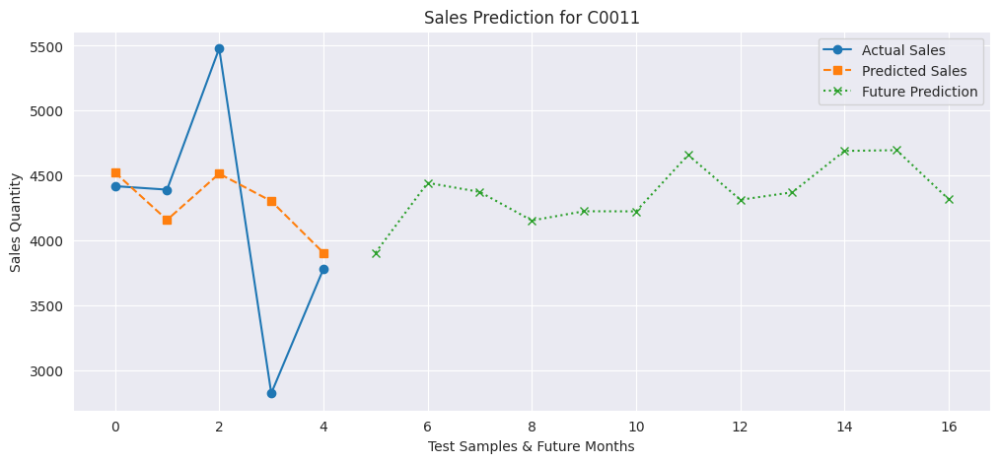

🚀 Training model for C0012...
✅ Accuracy for C0012: 75.06 %
📉 RMSE for C0012: 1098.32


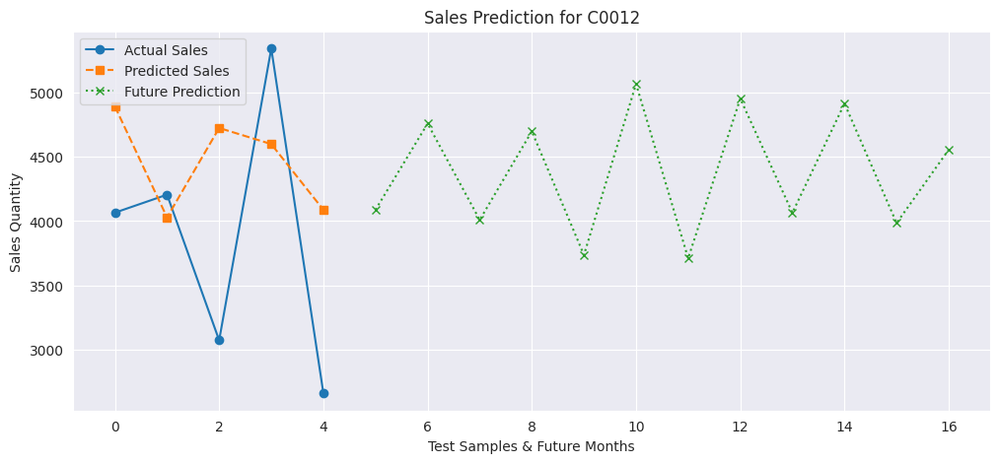

🚀 Training model for C0013...
✅ Accuracy for C0013: 81.38 %
📉 RMSE for C0013: 706.27


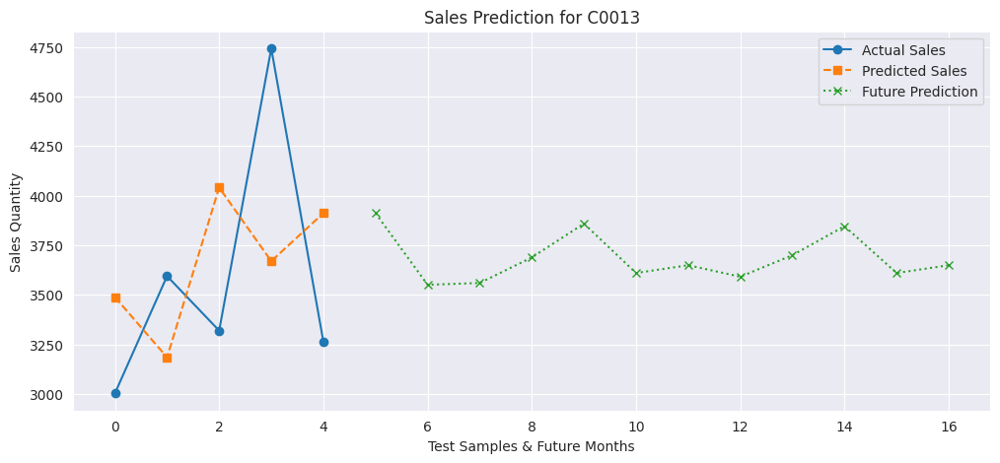

🚀 Training model for C0014...
✅ Accuracy for C0014: 79.11 %
📉 RMSE for C0014: 968.33


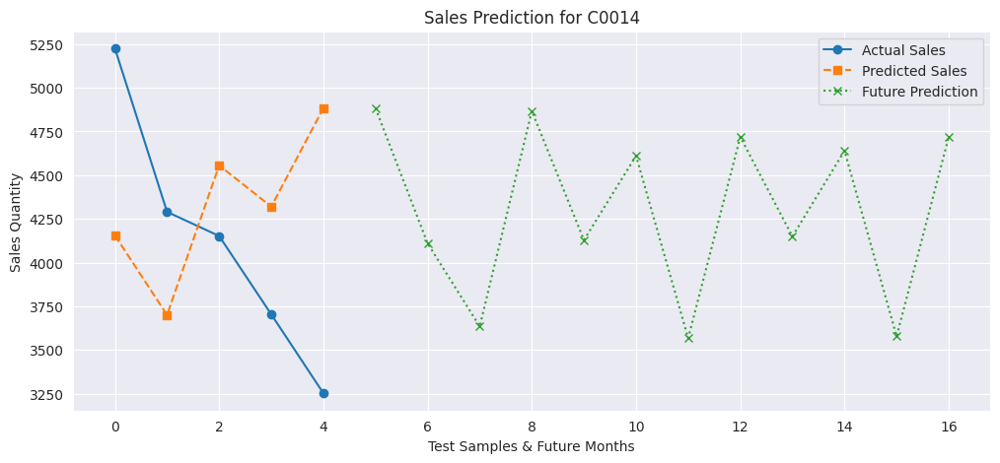

🚀 Training model for C0015...
✅ Accuracy for C0015: 87.75 %
📉 RMSE for C0015: 770.35


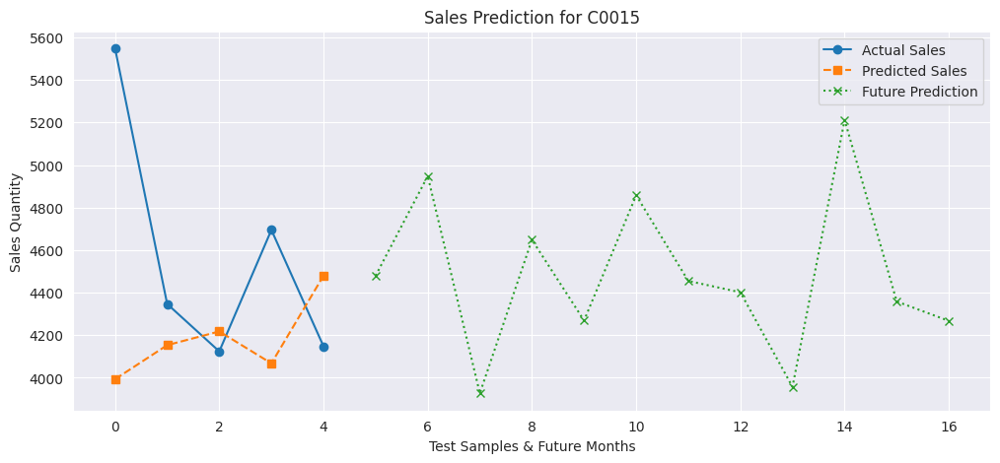

🚀 Training model for C0016...
✅ Accuracy for C0016: 76.32 %
📉 RMSE for C0016: 1110.56


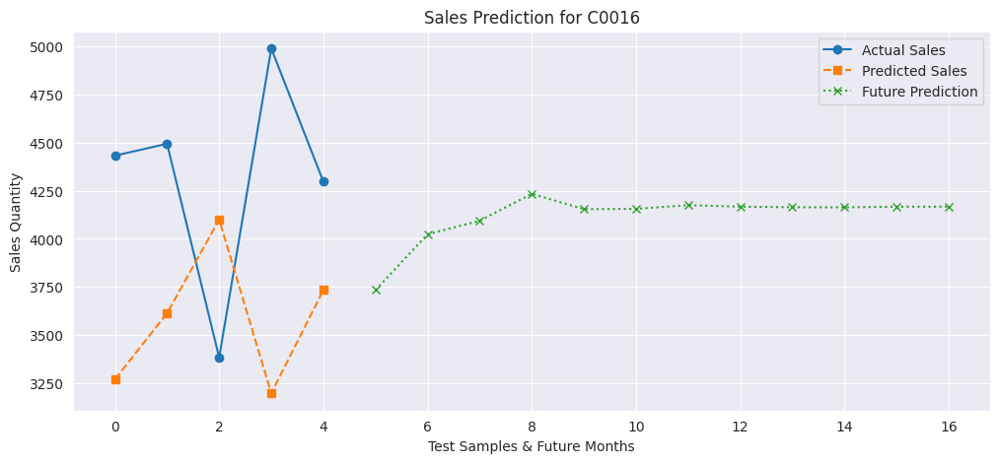

🚀 Training model for C0017...
✅ Accuracy for C0017: 91.29 %
📉 RMSE for C0017: 558.78


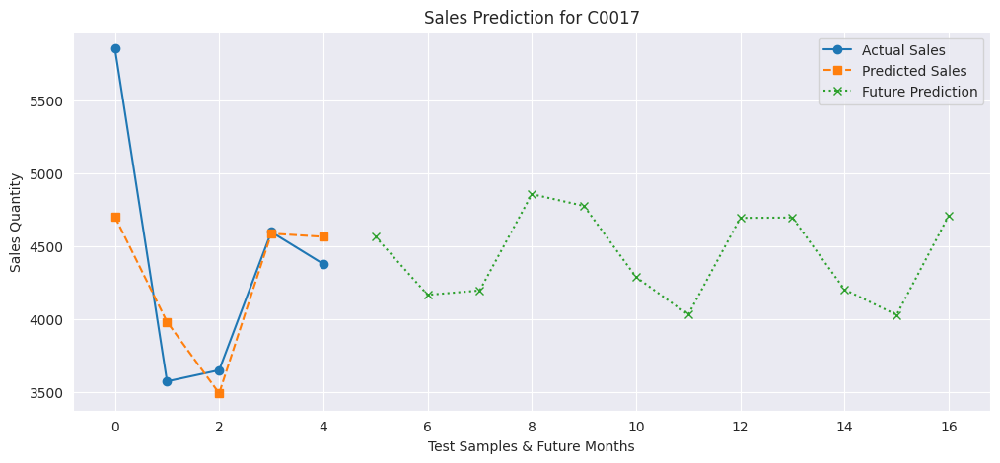

🚀 Training model for C0018...
✅ Accuracy for C0018: 68.3 %
📉 RMSE for C0018: 1816.42


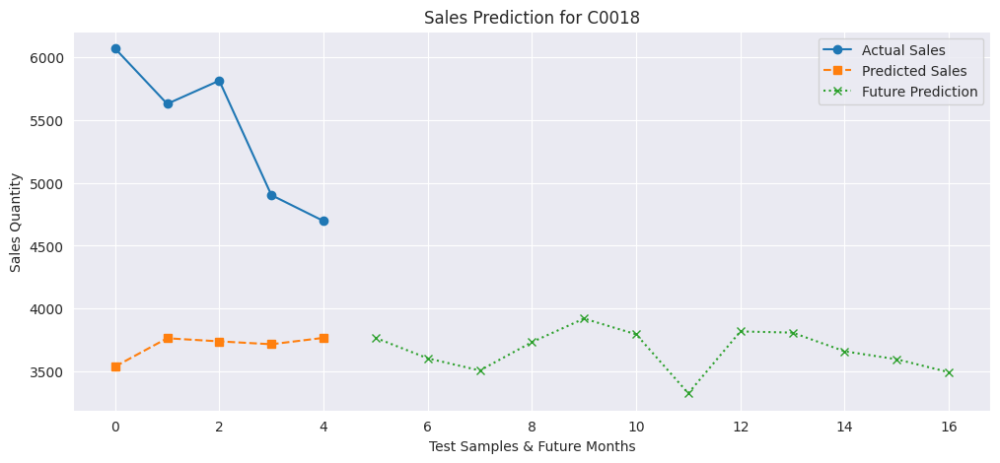

🚀 Training model for C0019...
✅ Accuracy for C0019: 80.8 %
📉 RMSE for C0019: 1034.01


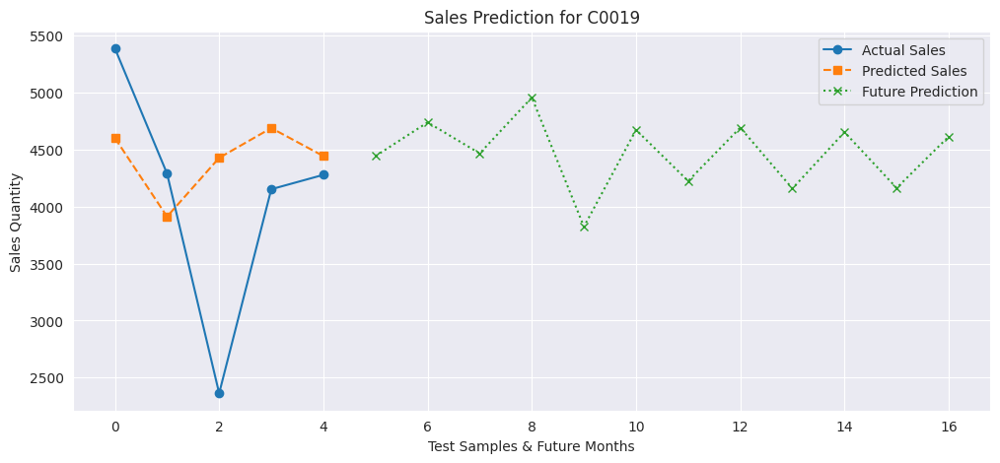

🚀 Training model for C0020...
✅ Accuracy for C0020: 76.79 %
📉 RMSE for C0020: 913.7


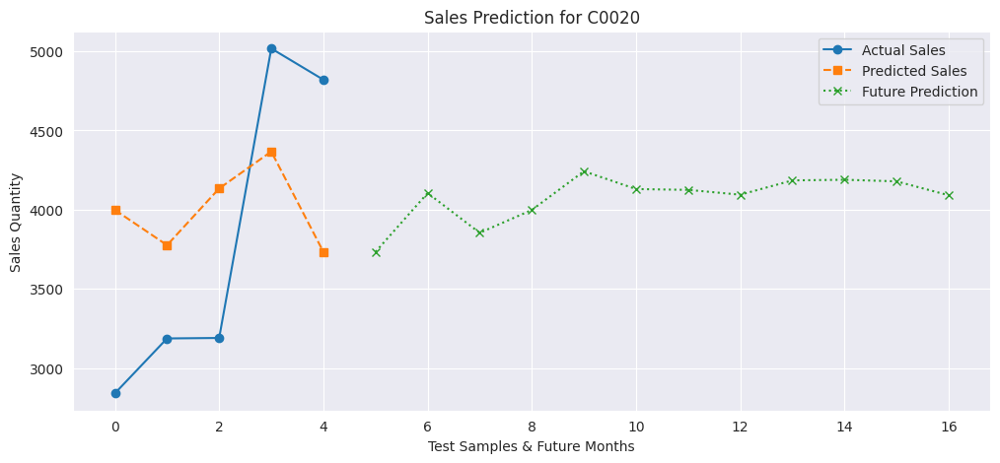

🚀 Training model for E0001...
✅ Accuracy for E0001: 81.99 %
📉 RMSE for E0001: 863.84


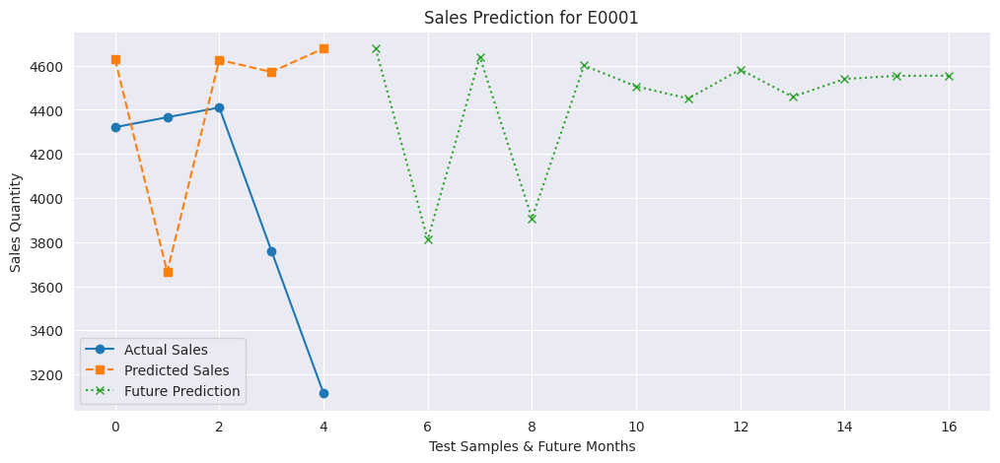

🚀 Training model for E0002...
✅ Accuracy for E0002: 79.42 %
📉 RMSE for E0002: 1098.37


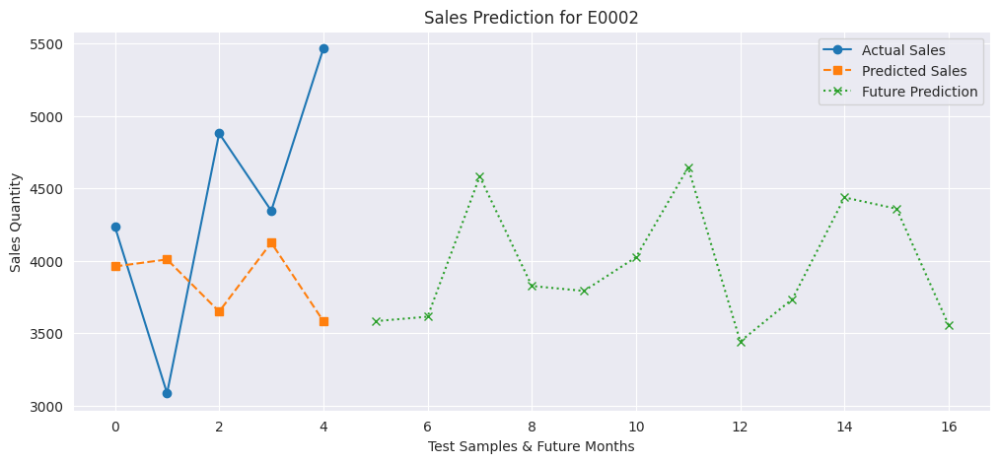

🚀 Training model for E0003...
✅ Accuracy for E0003: 80.98 %
📉 RMSE for E0003: 808.41


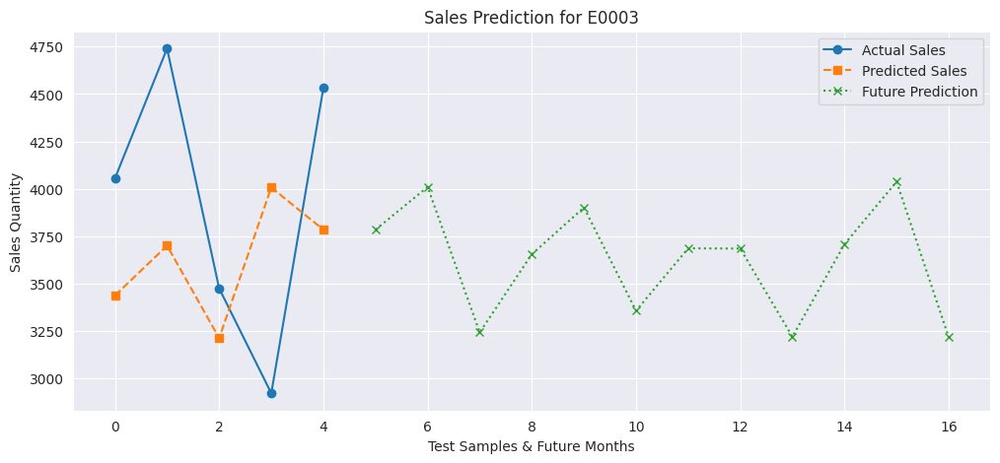

🚀 Training model for E0004...
✅ Accuracy for E0004: 77.9 %
📉 RMSE for E0004: 1059.6


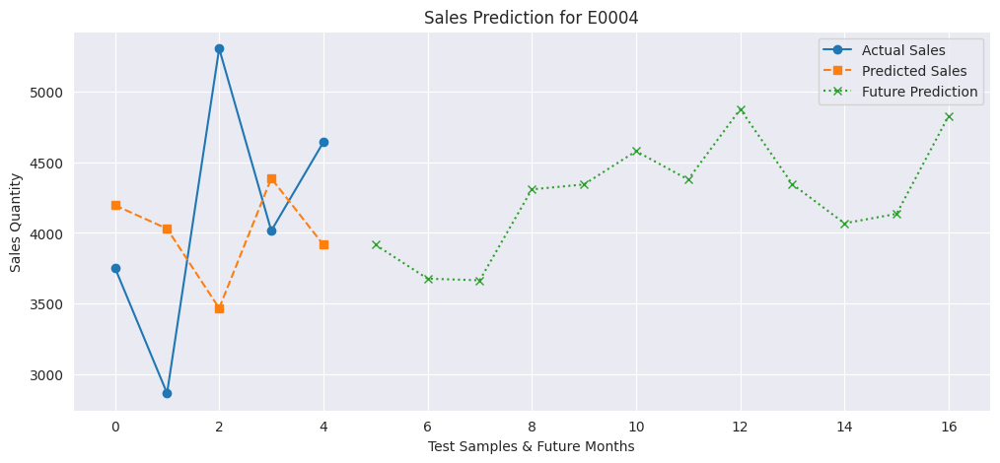

🚀 Training model for E0005...
✅ Accuracy for E0005: 86.8 %
📉 RMSE for E0005: 621.58


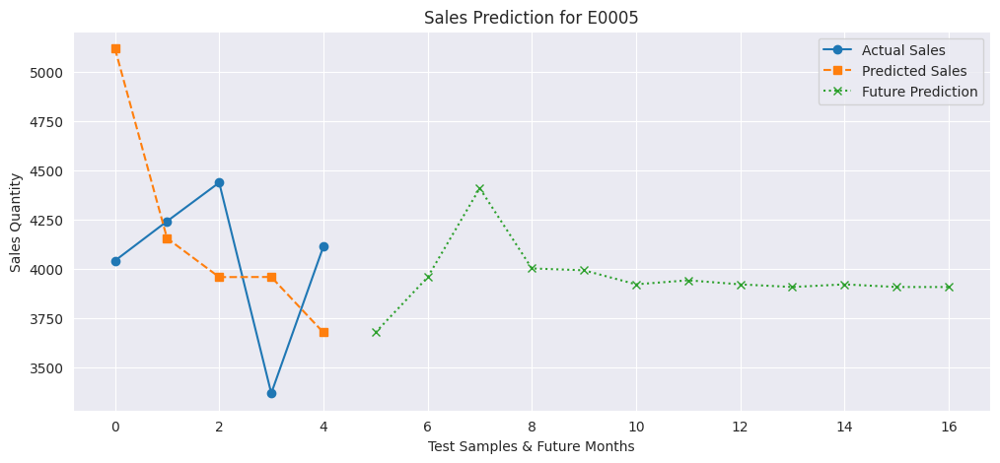

🚀 Training model for E0006...
✅ Accuracy for E0006: 86.15 %
📉 RMSE for E0006: 733.98


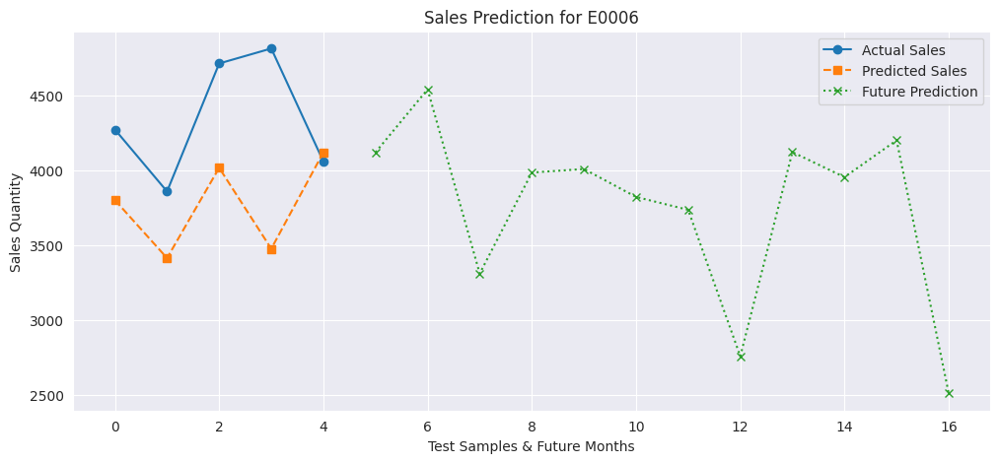

🚀 Training model for E0007...
✅ Accuracy for E0007: 79.8 %
📉 RMSE for E0007: 919.32


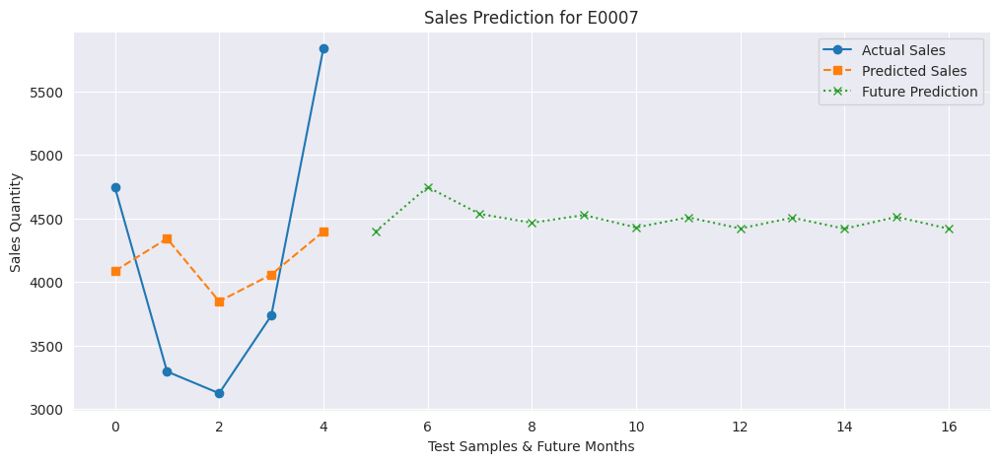

🚀 Training model for E0008...
✅ Accuracy for E0008: 77.95 %
📉 RMSE for E0008: 1187.47


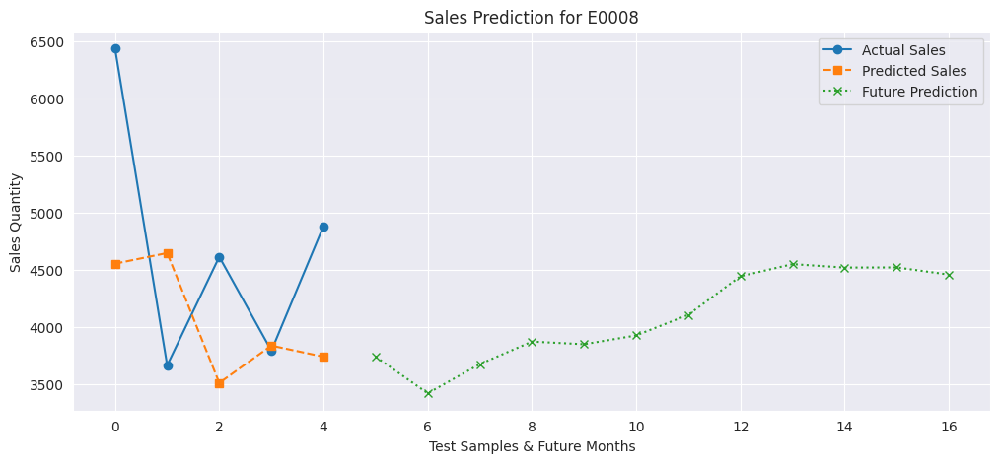

🚀 Training model for E0009...
✅ Accuracy for E0009: 68.87 %
📉 RMSE for E0009: 1427.42


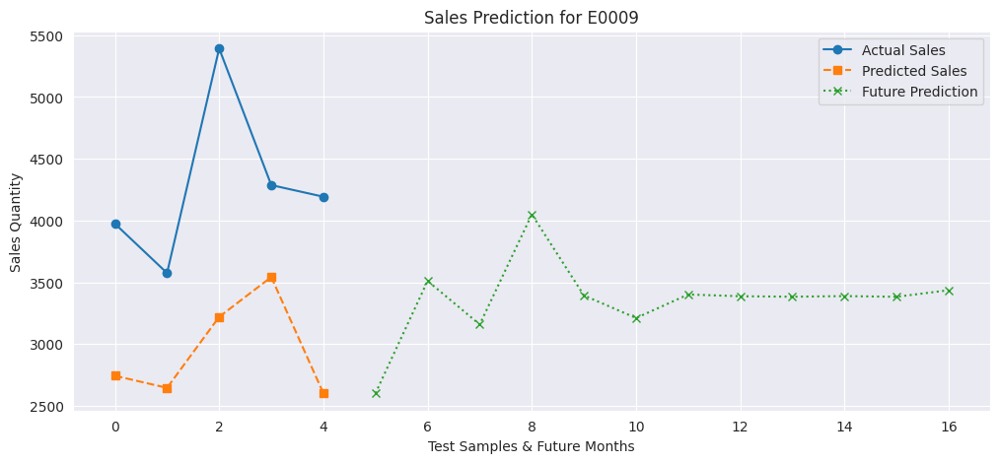

🚀 Training model for E0010...
✅ Accuracy for E0010: 73.01 %
📉 RMSE for E0010: 1320.33


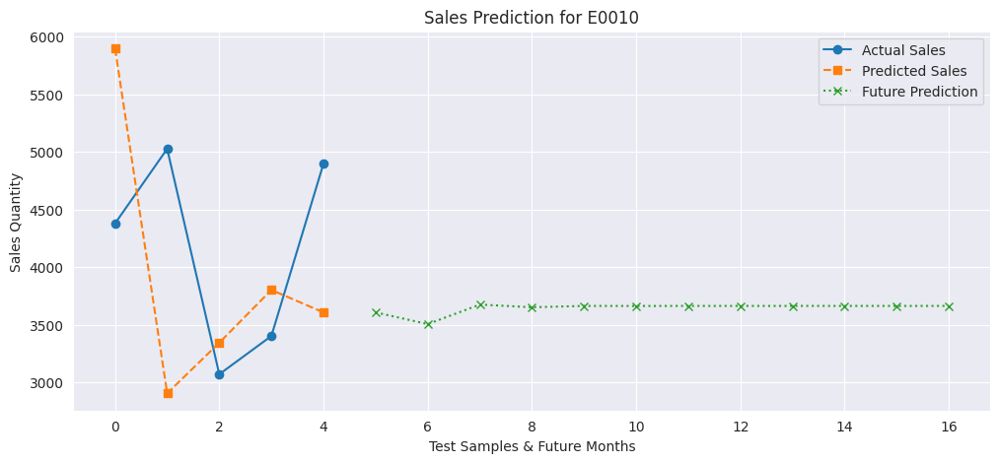

🚀 Training model for E0011...
✅ Accuracy for E0011: 78.86 %
📉 RMSE for E0011: 1198.67


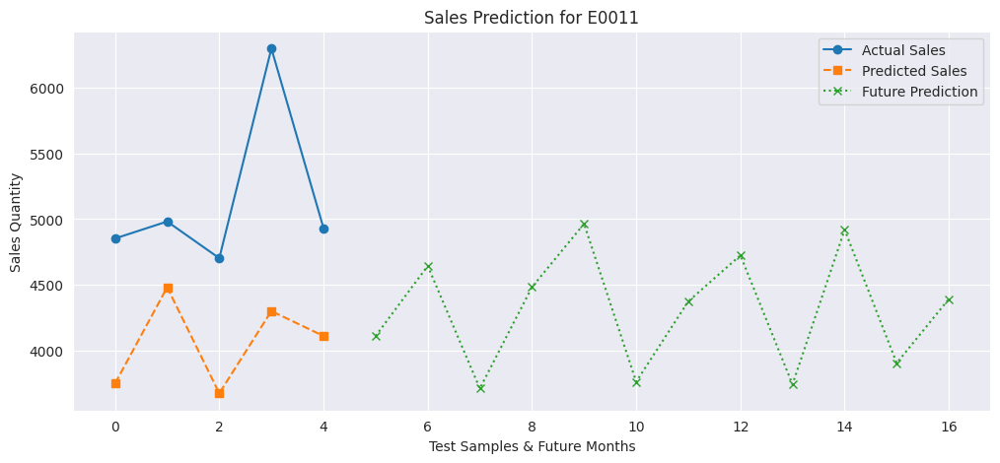

🚀 Training model for E0012...
✅ Accuracy for E0012: 84.9 %
📉 RMSE for E0012: 741.35


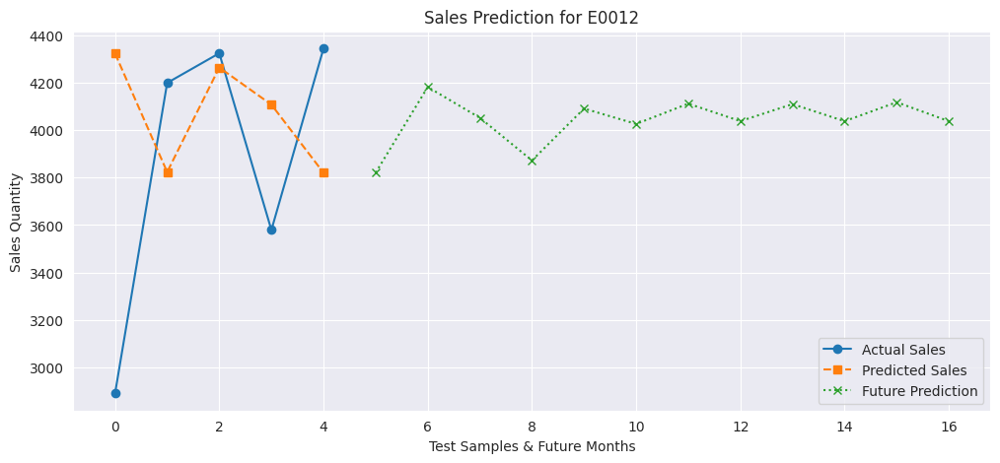

🚀 Training model for E0013...
✅ Accuracy for E0013: 84.39 %
📉 RMSE for E0013: 690.27


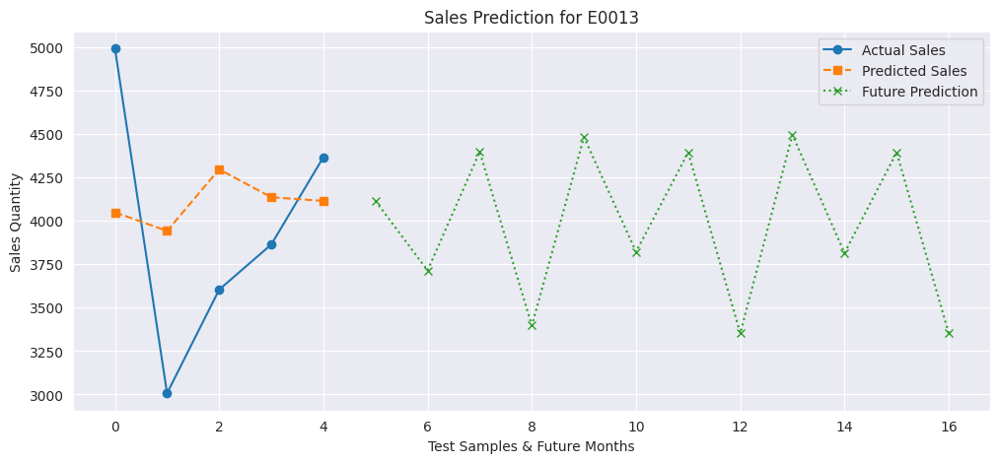

🚀 Training model for E0014...
✅ Accuracy for E0014: 81.3 %
📉 RMSE for E0014: 986.4


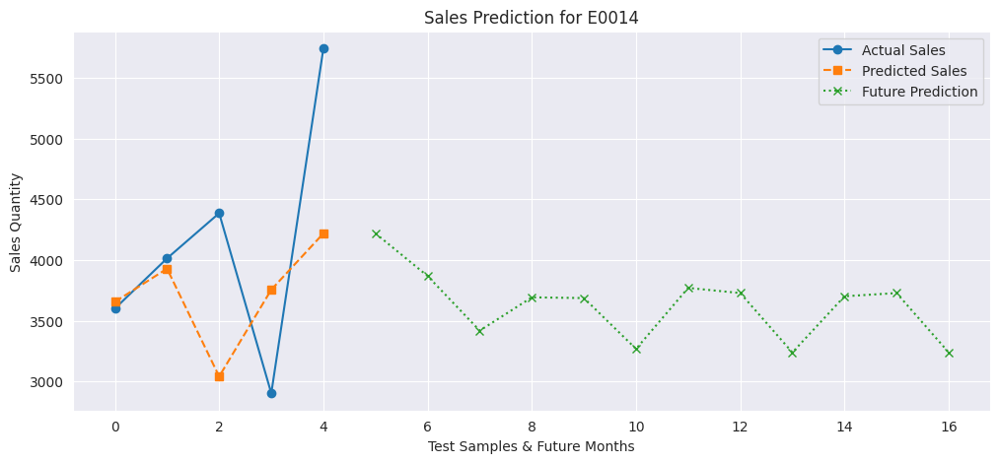

🚀 Training model for E0015...
✅ Accuracy for E0015: 73.59 %
📉 RMSE for E0015: 1053.69


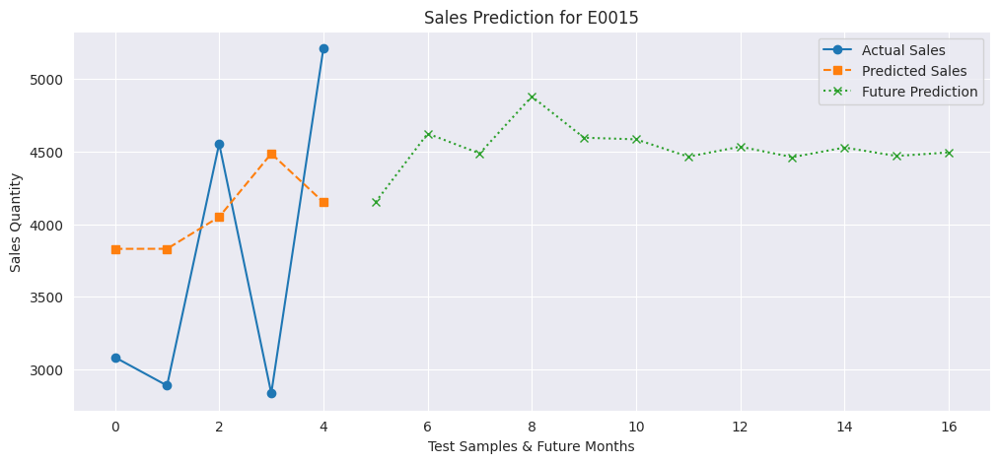

🚀 Training model for E0016...
✅ Accuracy for E0016: 82.67 %
📉 RMSE for E0016: 871.31


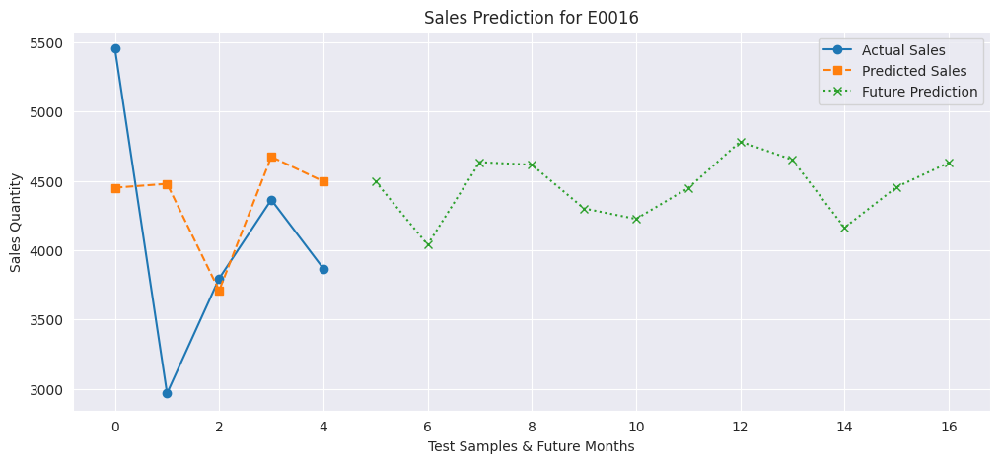

🚀 Training model for E0017...
✅ Accuracy for E0017: 82.31 %
📉 RMSE for E0017: 914.3


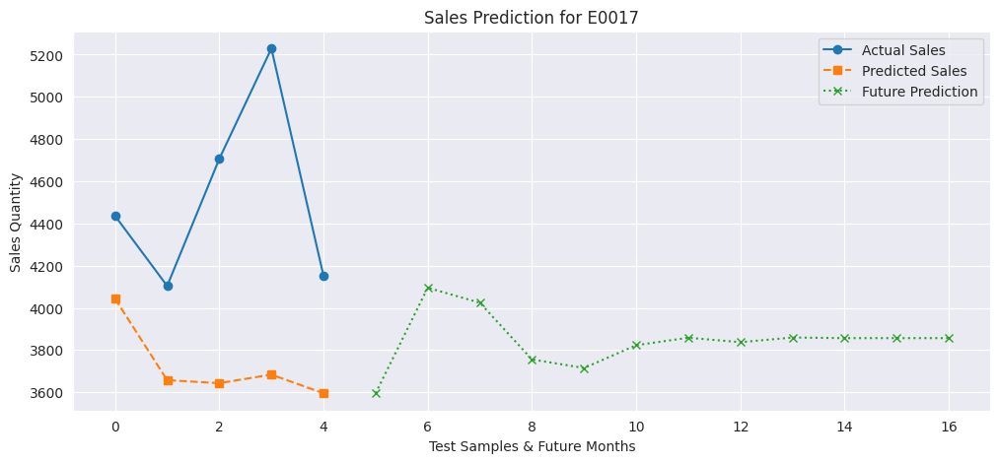

🚀 Training model for E0018...
✅ Accuracy for E0018: 84.49 %
📉 RMSE for E0018: 762.14


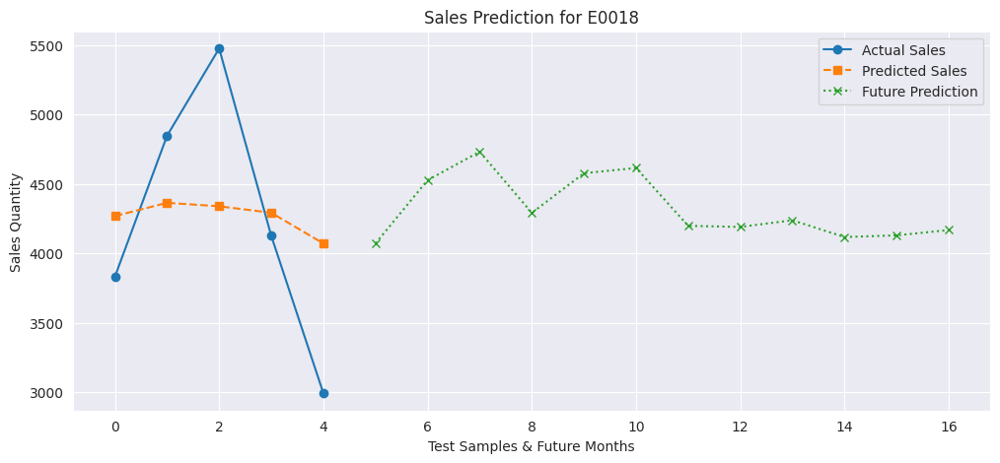

🚀 Training model for E0019...
✅ Accuracy for E0019: 72.02 %
📉 RMSE for E0019: 1342.05


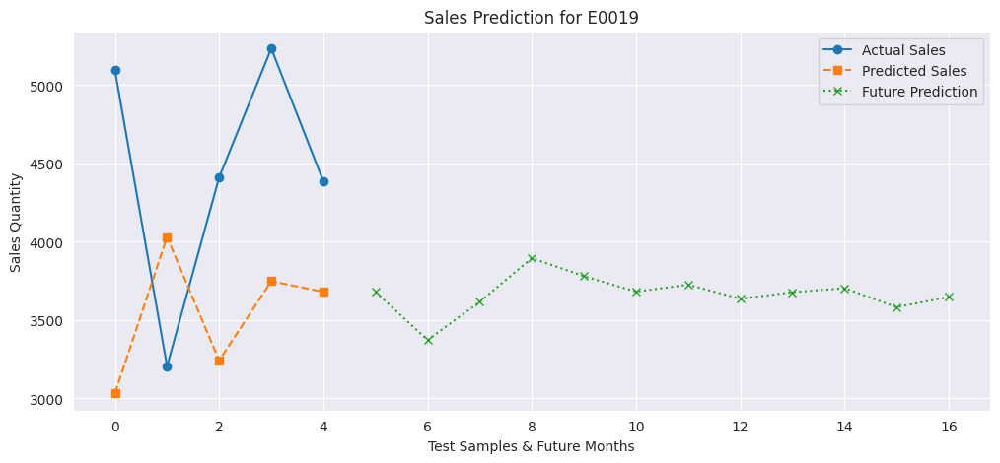

🚀 Training model for E0020...
✅ Accuracy for E0020: 78.45 %
📉 RMSE for E0020: 1005.16


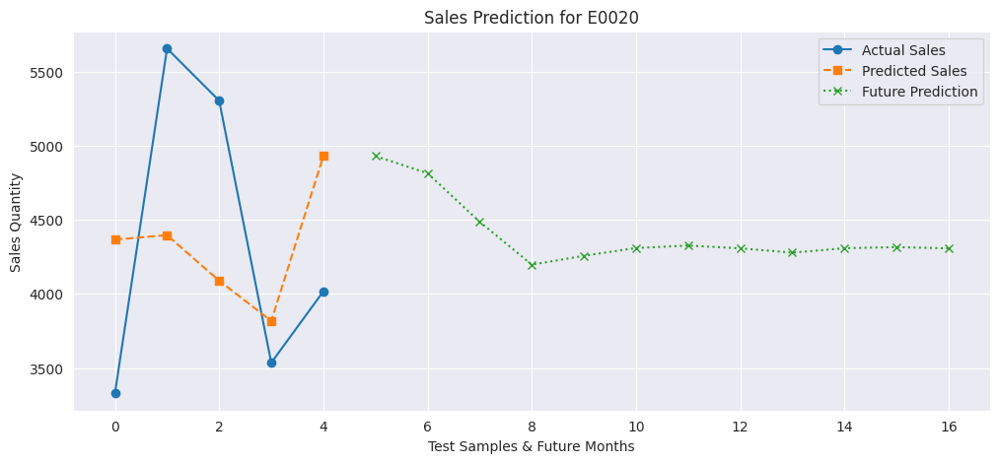

🚀 Training model for F0001...
✅ Accuracy for F0001: 83.27 %
📉 RMSE for F0001: 783.82


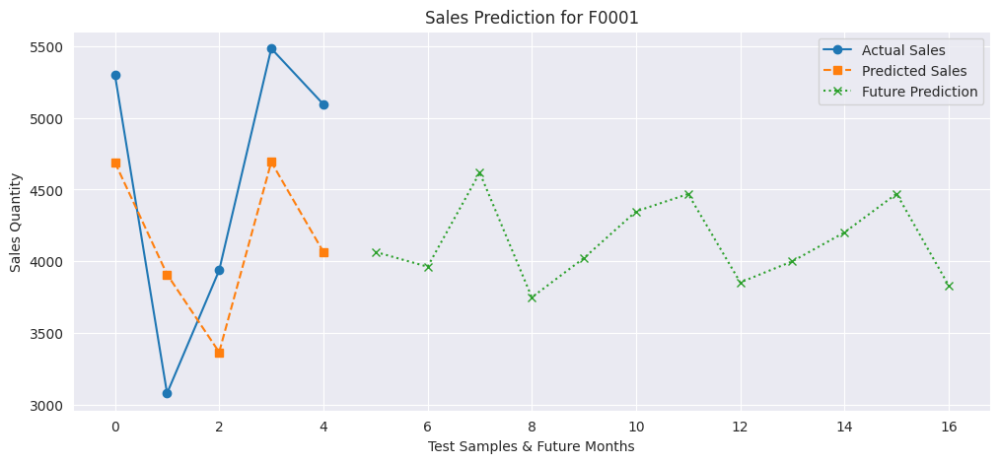

🚀 Training model for F0002...
✅ Accuracy for F0002: 90.86 %
📉 RMSE for F0002: 450.06


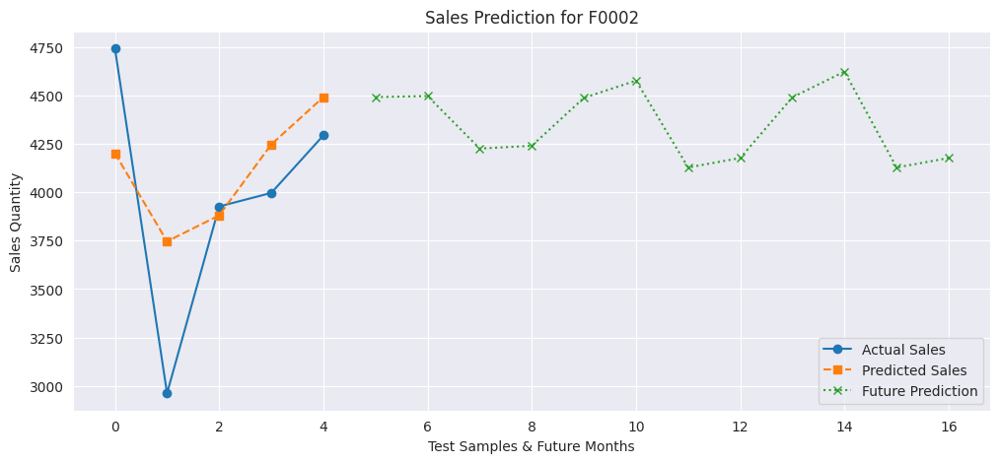

🚀 Training model for F0003...
✅ Accuracy for F0003: 90.83 %
📉 RMSE for F0003: 461.08


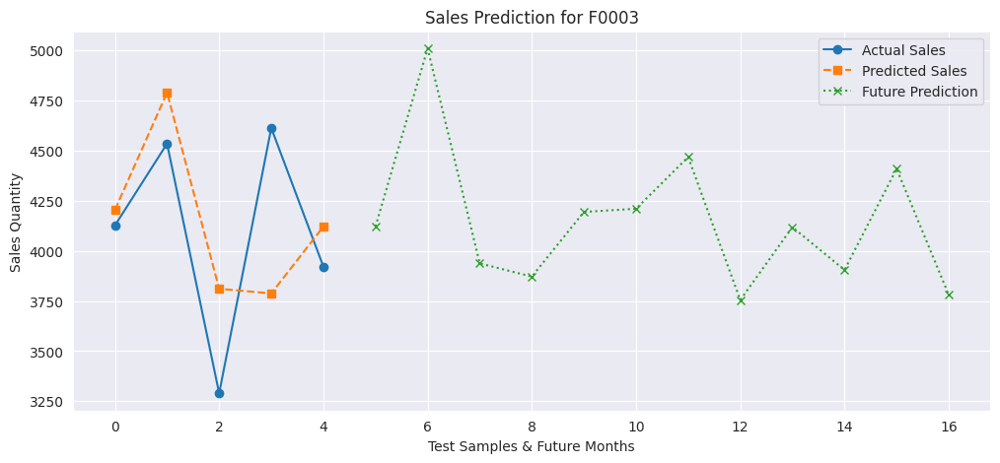

🚀 Training model for F0004...
✅ Accuracy for F0004: 80.26 %
📉 RMSE for F0004: 969.72


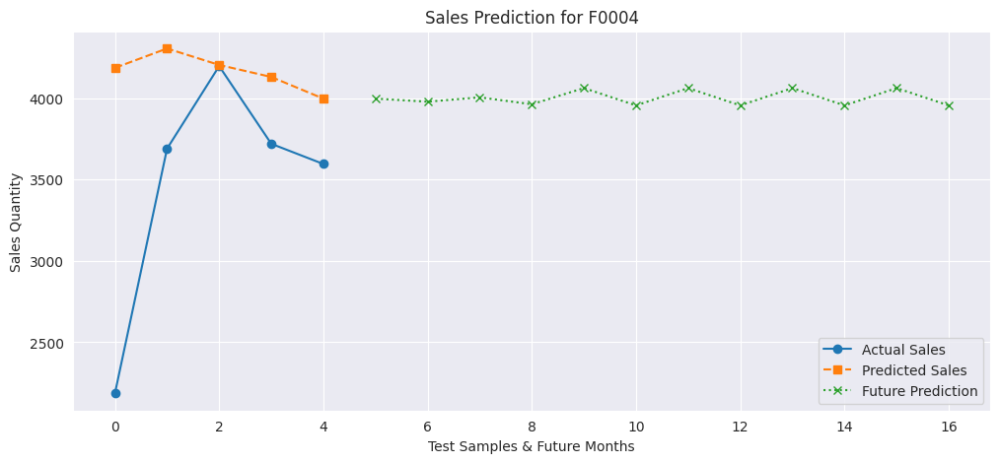

🚀 Training model for F0005...
✅ Accuracy for F0005: 87.8 %
📉 RMSE for F0005: 700.82


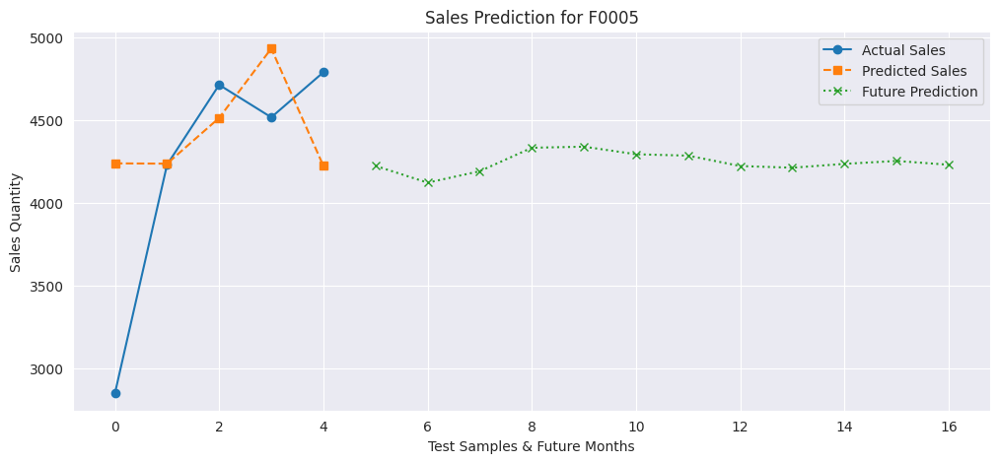

🚀 Training model for F0006...
✅ Accuracy for F0006: 66.02 %
📉 RMSE for F0006: 1369.54


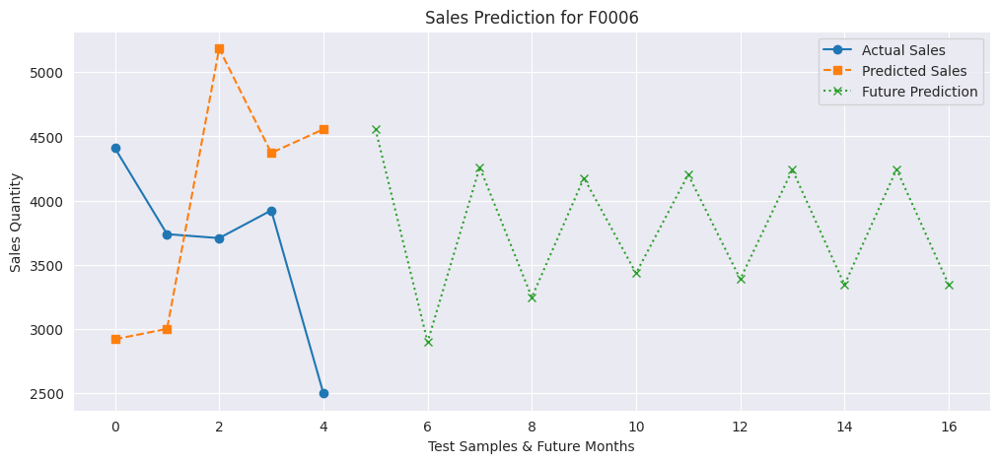

🚀 Training model for F0007...
✅ Accuracy for F0007: 77.57 %
📉 RMSE for F0007: 1222.84


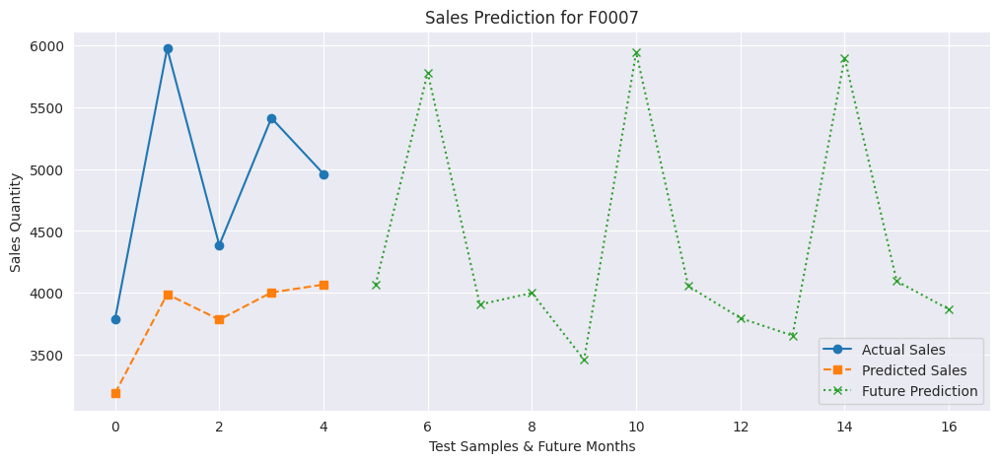

🚀 Training model for F0008...
✅ Accuracy for F0008: 79.29 %
📉 RMSE for F0008: 1061.91


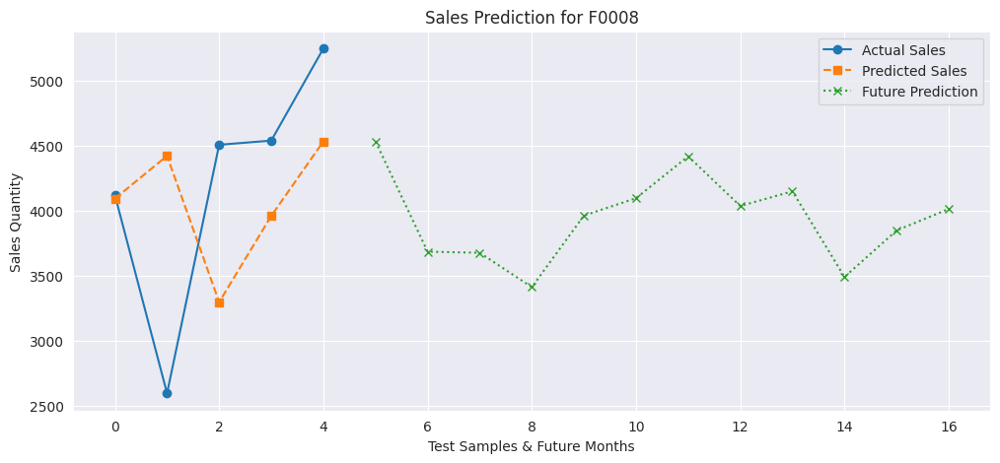

🚀 Training model for F0009...
✅ Accuracy for F0009: 77.96 %
📉 RMSE for F0009: 1280.58


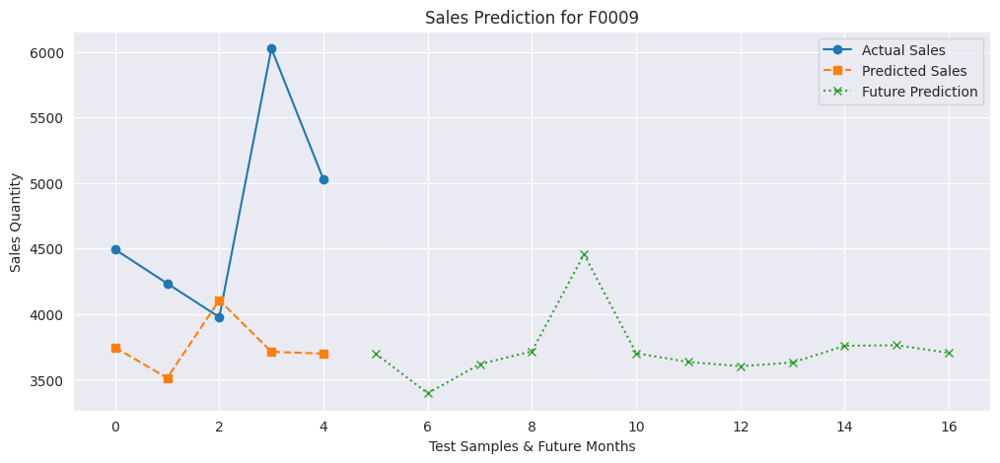

🚀 Training model for F0010...
✅ Accuracy for F0010: 72.22 %
📉 RMSE for F0010: 1590.45


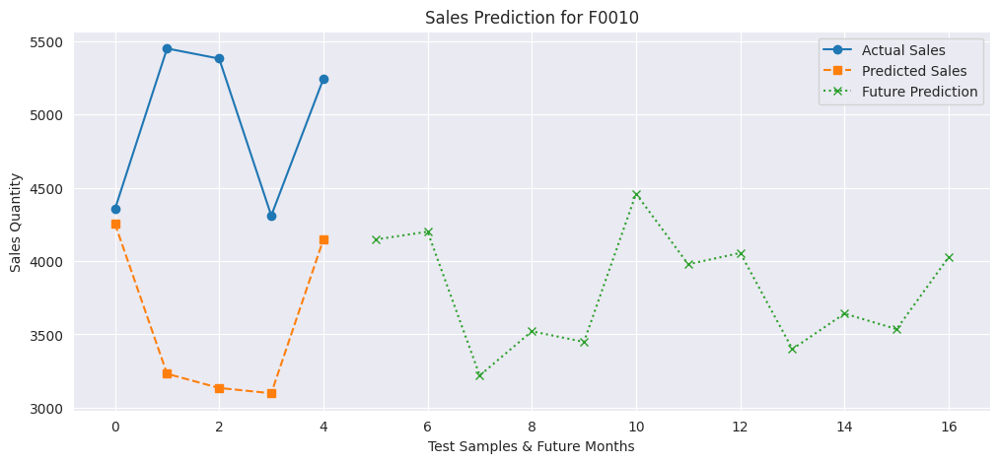

🚀 Training model for F0011...
✅ Accuracy for F0011: 74.94 %
📉 RMSE for F0011: 1394.01


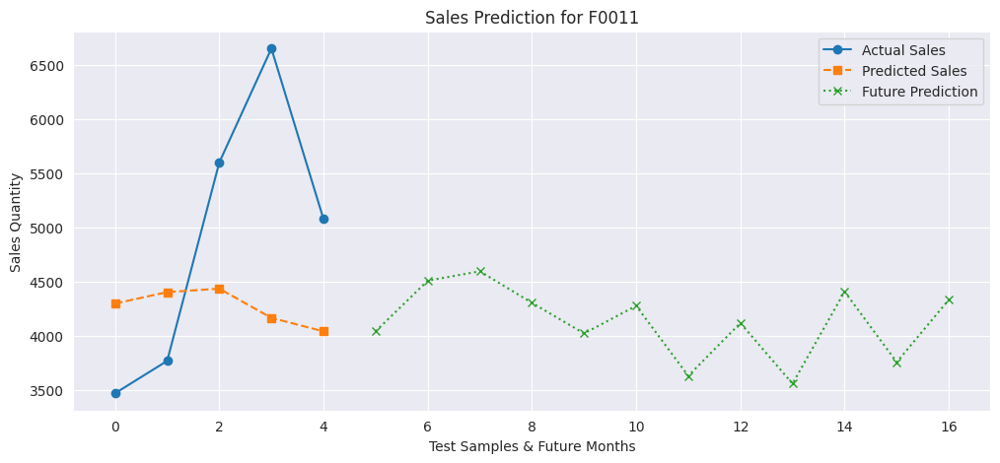

🚀 Training model for F0012...
✅ Accuracy for F0012: 73.49 %
📉 RMSE for F0012: 1249.41


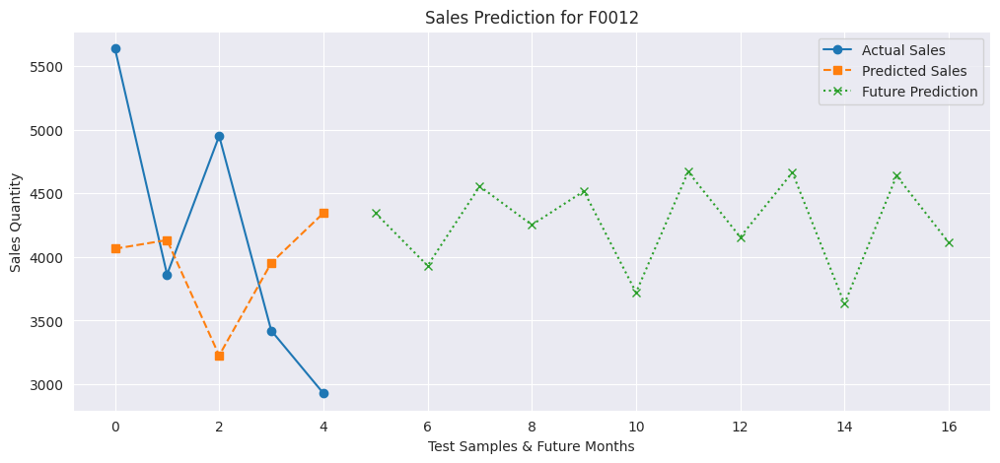

🚀 Training model for F0013...
✅ Accuracy for F0013: 81.76 %
📉 RMSE for F0013: 928.2


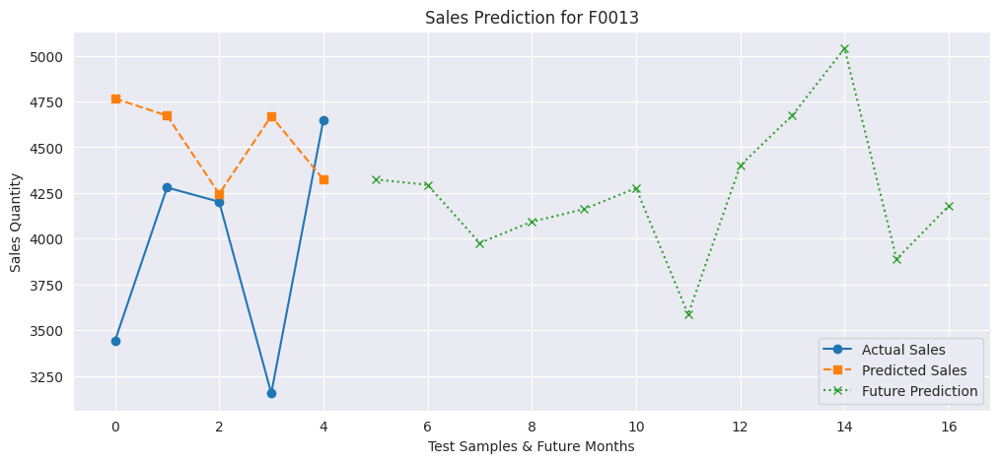

🚀 Training model for F0014...
✅ Accuracy for F0014: 76.98 %
📉 RMSE for F0014: 1004.77


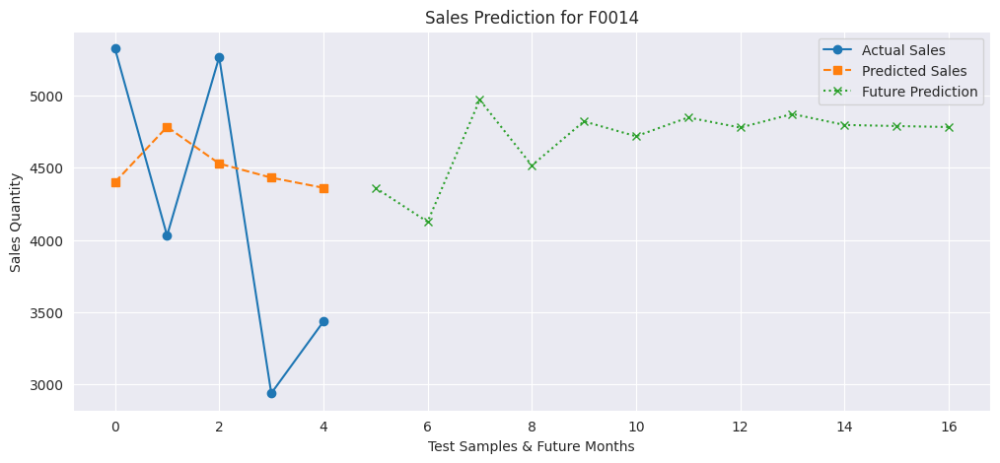

🚀 Training model for F0015...
✅ Accuracy for F0015: 82.12 %
📉 RMSE for F0015: 1024.93


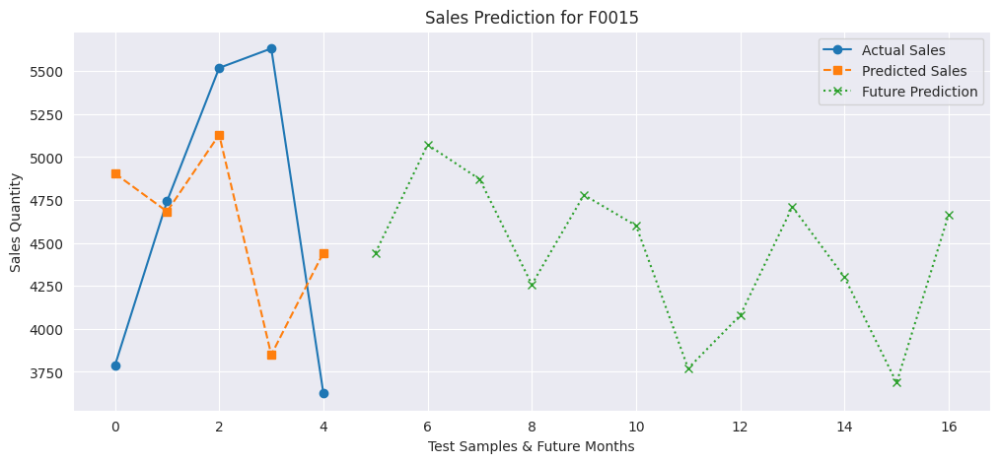

🚀 Training model for F0016...
✅ Accuracy for F0016: 79.08 %
📉 RMSE for F0016: 971.14


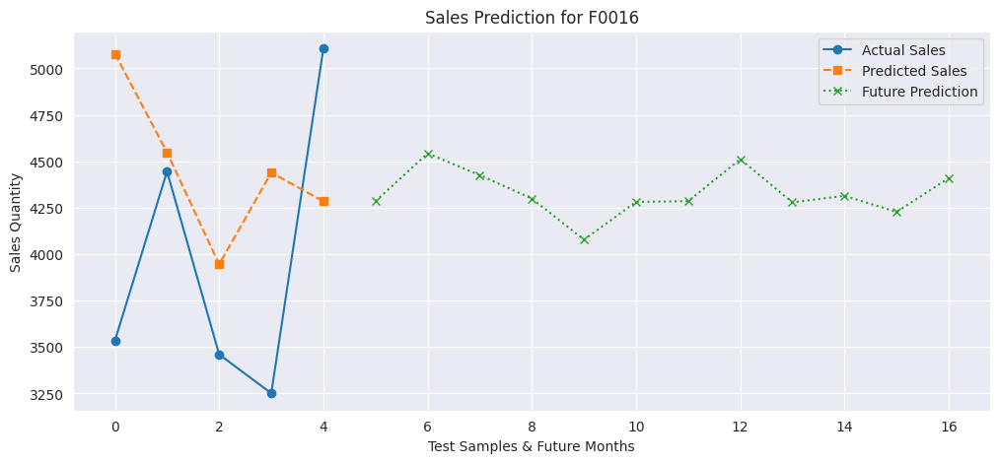

🚀 Training model for F0017...
✅ Accuracy for F0017: 69.98 %
📉 RMSE for F0017: 1724.77


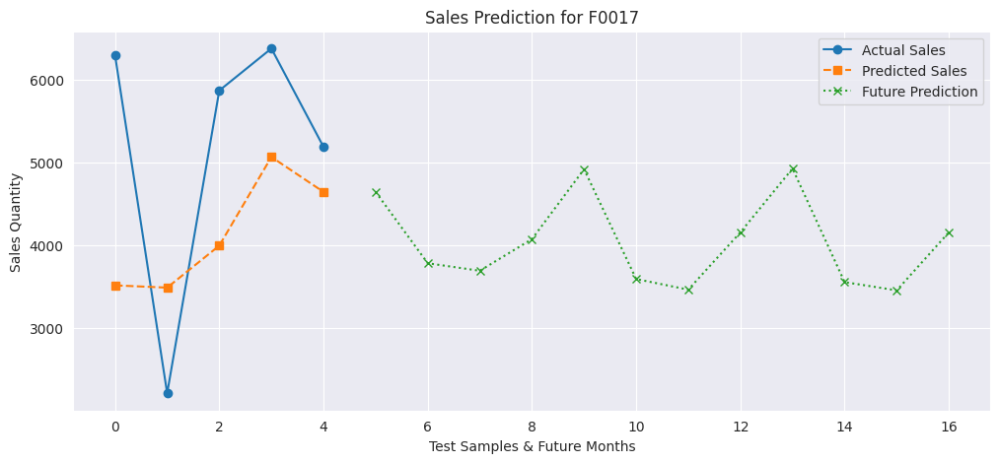

🚀 Training model for F0018...
✅ Accuracy for F0018: 80.44 %
📉 RMSE for F0018: 853.08


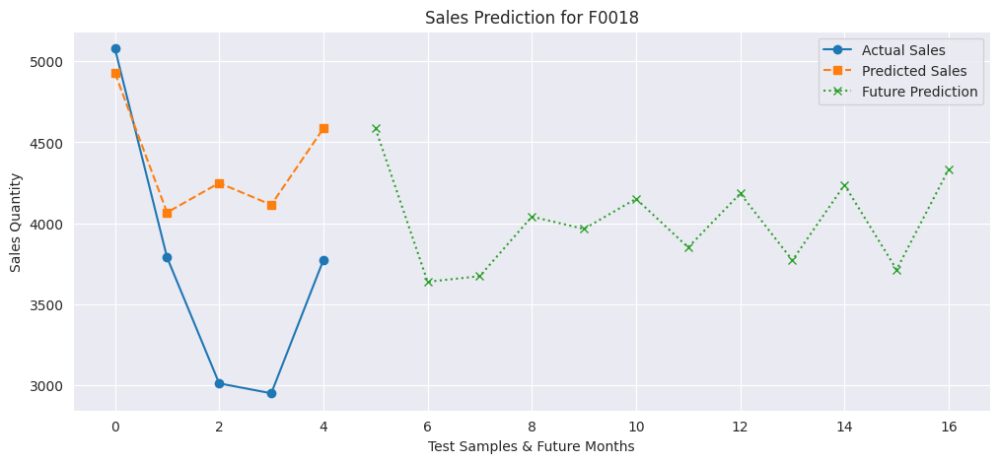

🚀 Training model for F0019...
✅ Accuracy for F0019: 85.54 %
📉 RMSE for F0019: 781.85


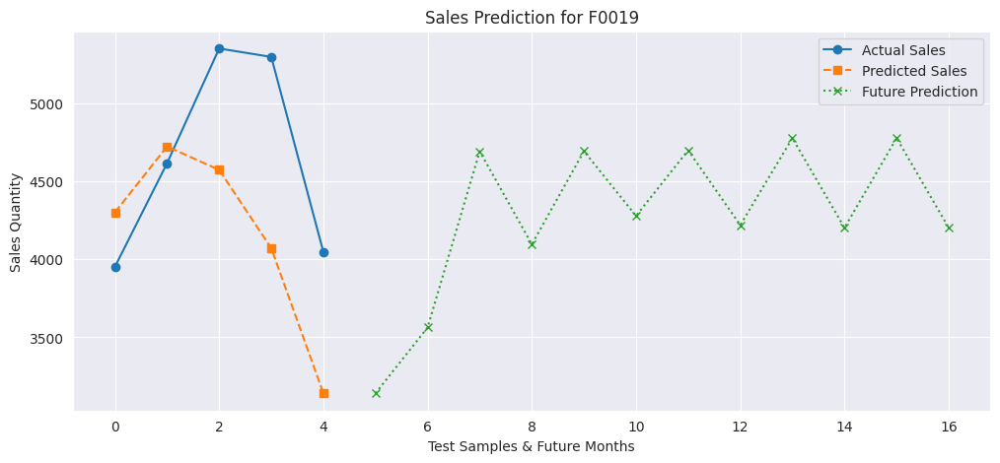

🚀 Training model for F0020...
✅ Accuracy for F0020: 80.86 %
📉 RMSE for F0020: 1035.12


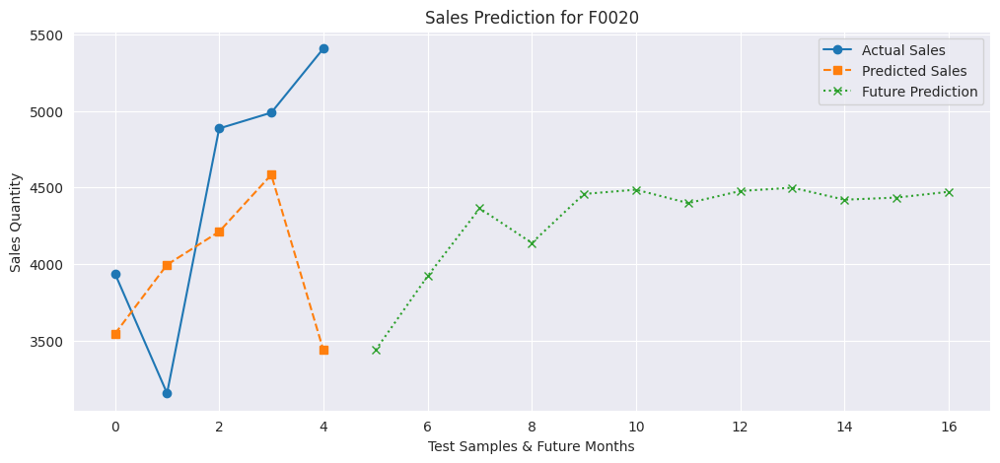

🚀 Training model for G0001...
✅ Accuracy for G0001: 80.69 %
📉 RMSE for G0001: 792.22


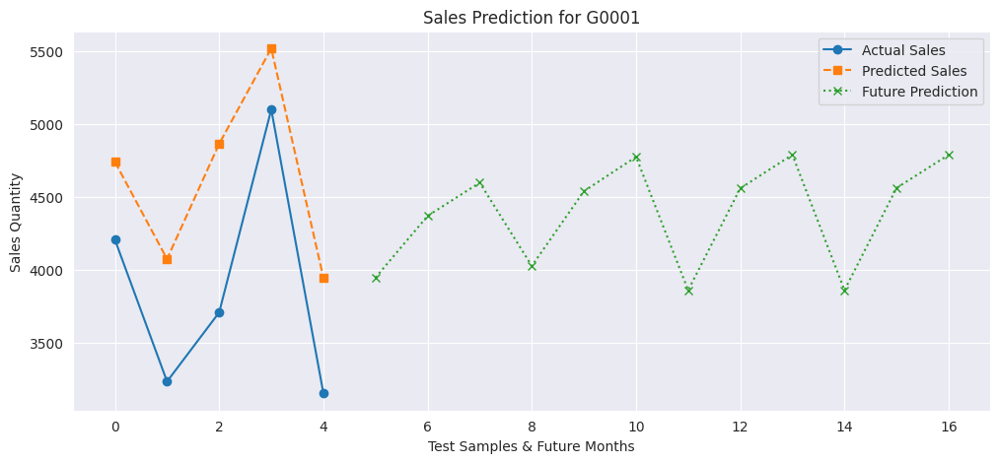

🚀 Training model for G0002...
✅ Accuracy for G0002: 83.71 %
📉 RMSE for G0002: 731.1


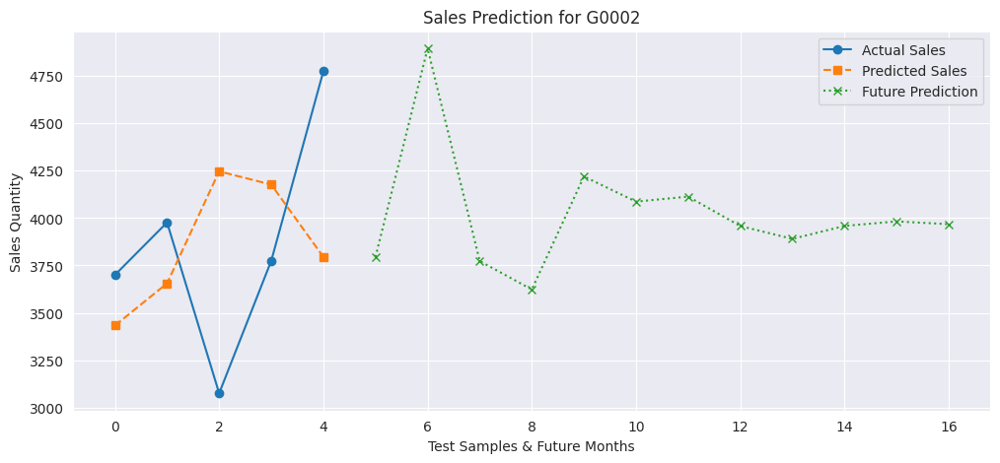

🚀 Training model for G0003...
✅ Accuracy for G0003: 77.66 %
📉 RMSE for G0003: 1193.61


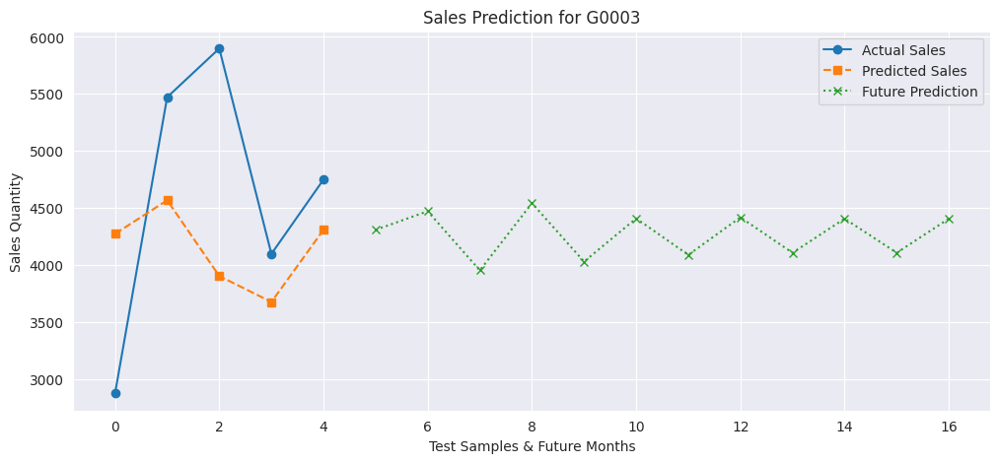

🚀 Training model for G0004...
✅ Accuracy for G0004: 71.4 %
📉 RMSE for G0004: 1404.48


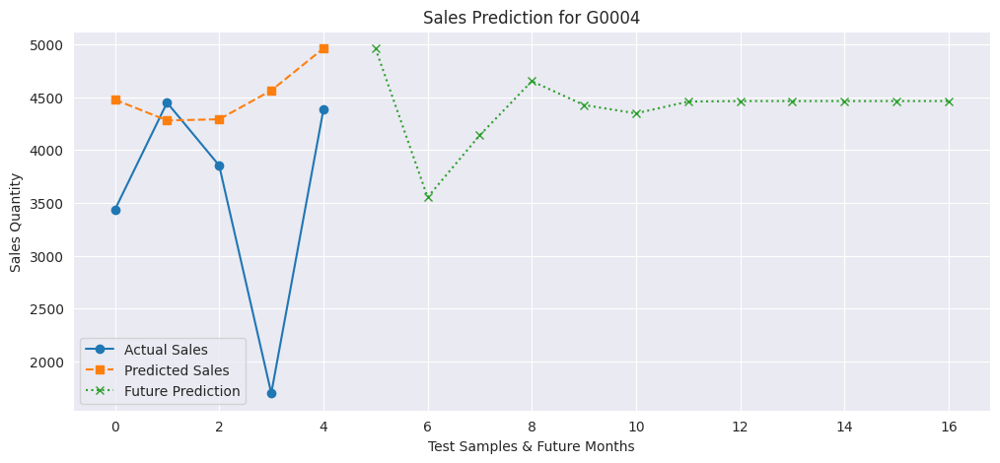

🚀 Training model for G0005...
✅ Accuracy for G0005: 68.39 %
📉 RMSE for G0005: 1469.69


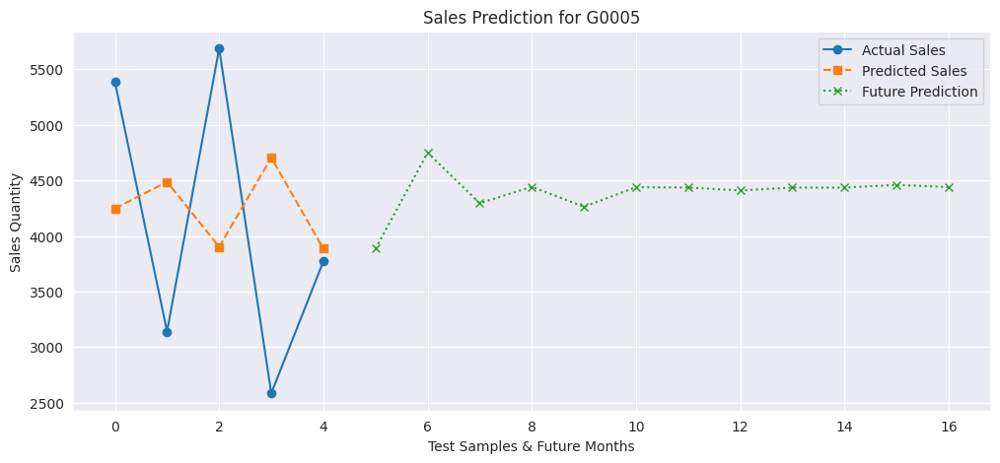

🚀 Training model for G0006...
✅ Accuracy for G0006: 84.03 %
📉 RMSE for G0006: 926.5


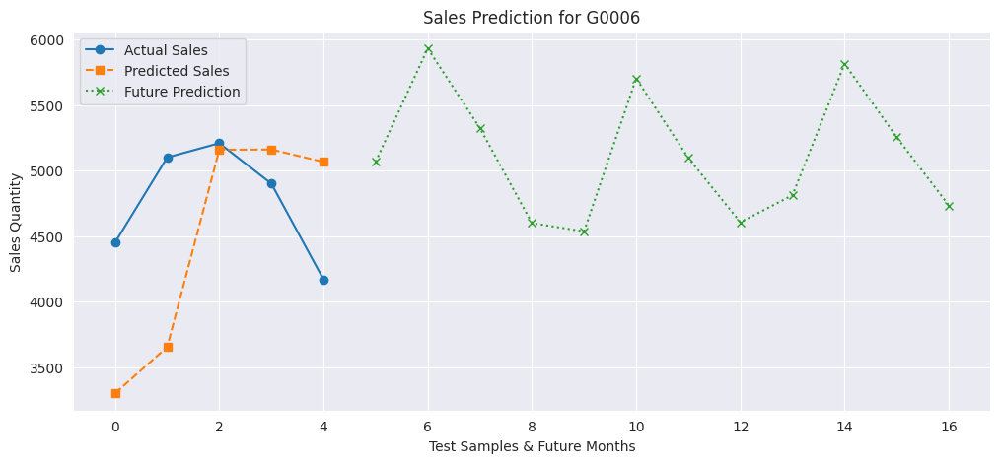

🚀 Training model for G0007...
✅ Accuracy for G0007: 72.6 %
📉 RMSE for G0007: 1108.13


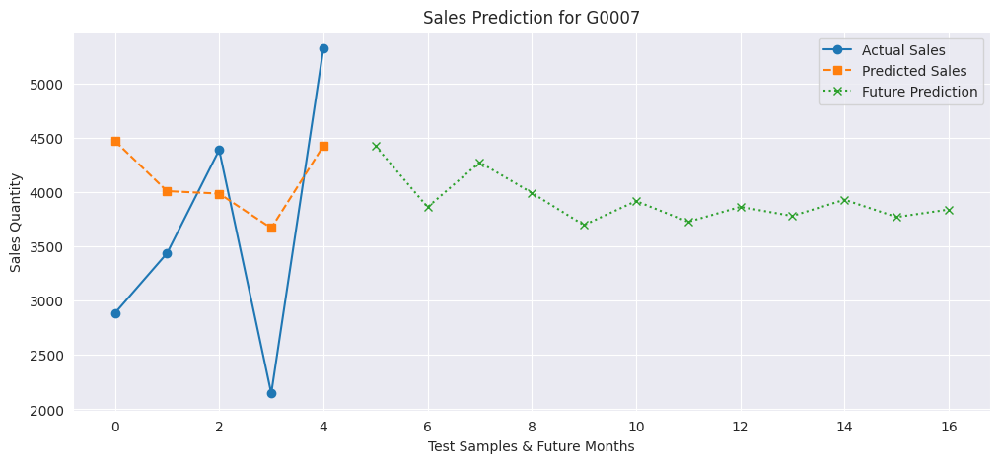

🚀 Training model for G0008...
✅ Accuracy for G0008: 74.61 %
📉 RMSE for G0008: 1042.94


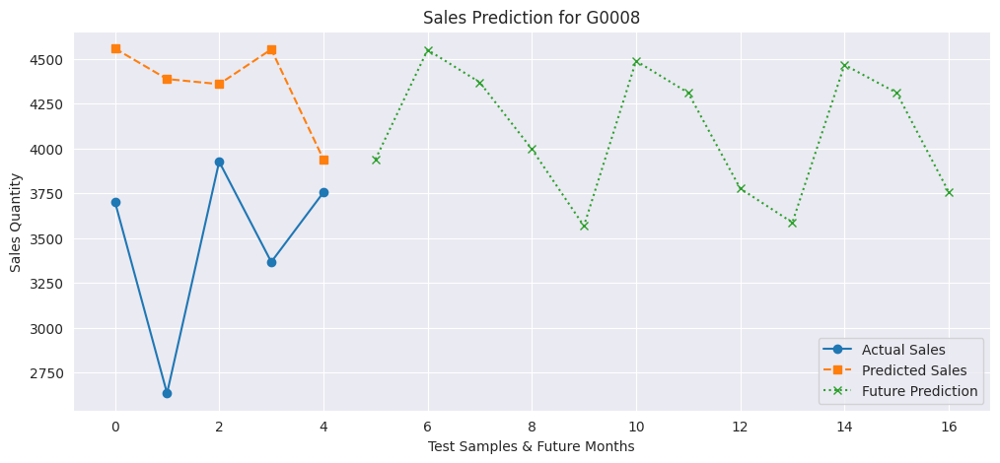

🚀 Training model for G0009...
✅ Accuracy for G0009: 85.31 %
📉 RMSE for G0009: 662.6


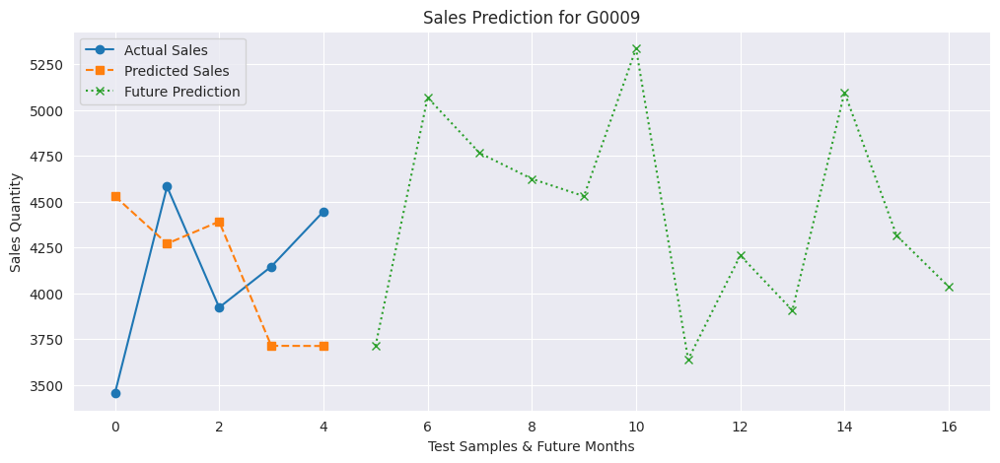

🚀 Training model for G0010...
✅ Accuracy for G0010: 87.61 %
📉 RMSE for G0010: 573.1


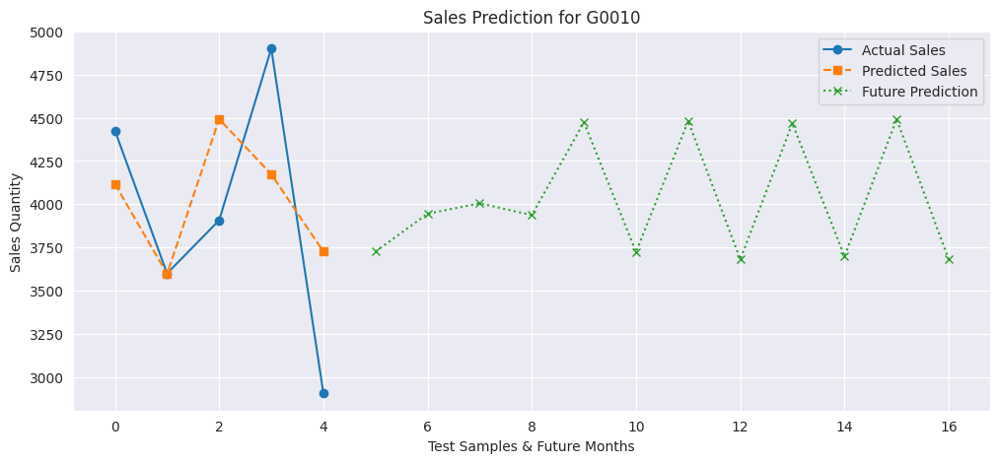

🚀 Training model for G0011...
✅ Accuracy for G0011: 85.15 %
📉 RMSE for G0011: 707.64


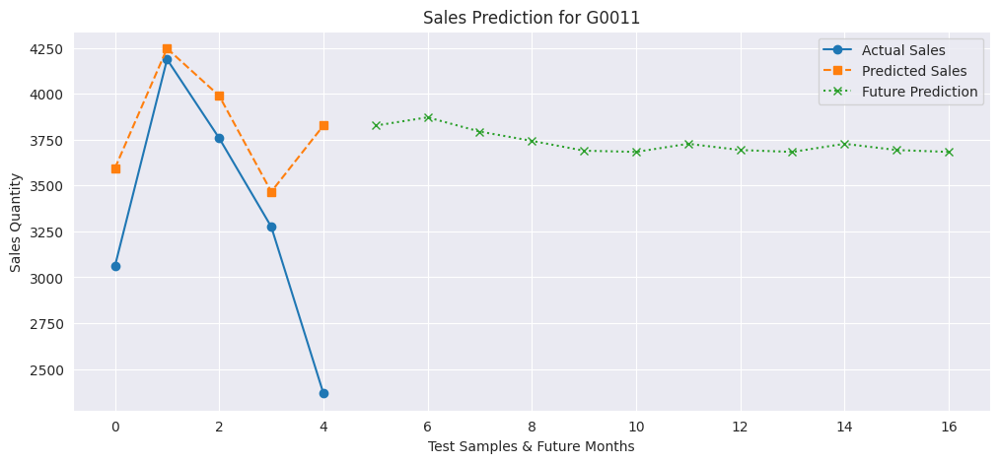

🚀 Training model for G0012...
✅ Accuracy for G0012: 75.79 %
📉 RMSE for G0012: 1083.53


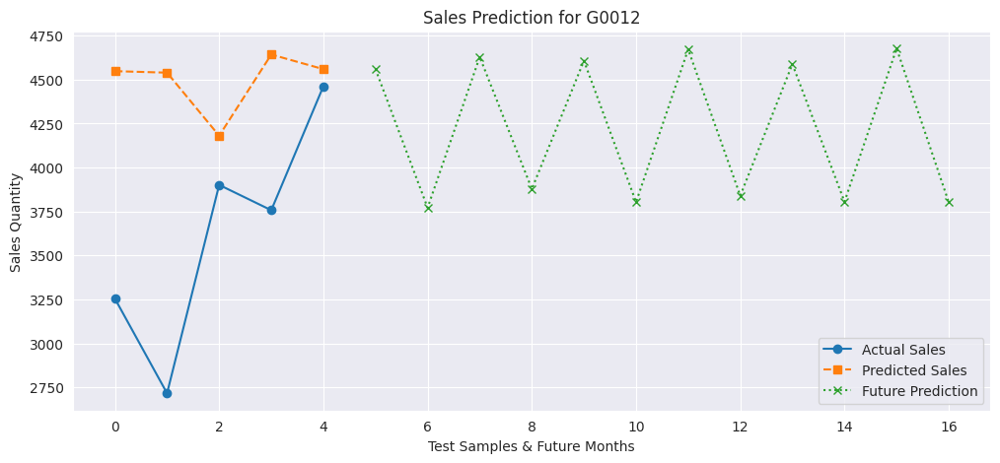

🚀 Training model for G0013...
✅ Accuracy for G0013: 82.72 %
📉 RMSE for G0013: 840.55


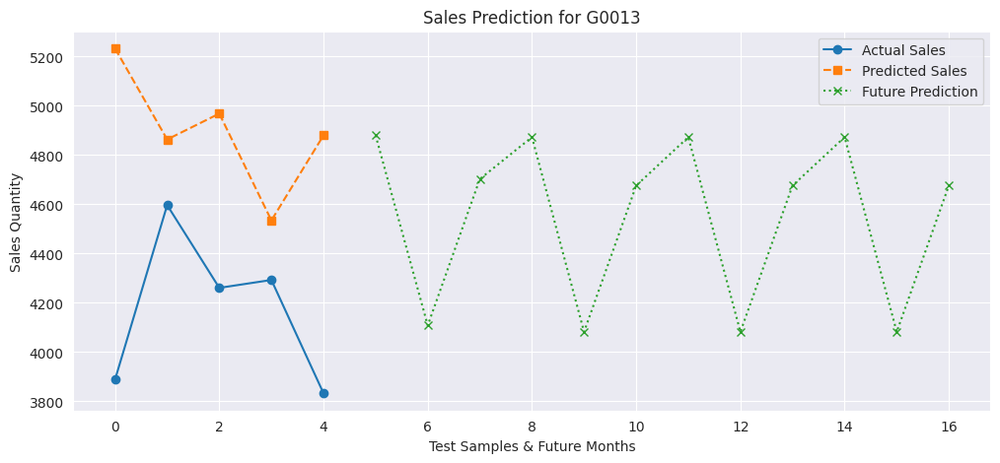

🚀 Training model for G0014...
✅ Accuracy for G0014: 67.62 %
📉 RMSE for G0014: 1557.28


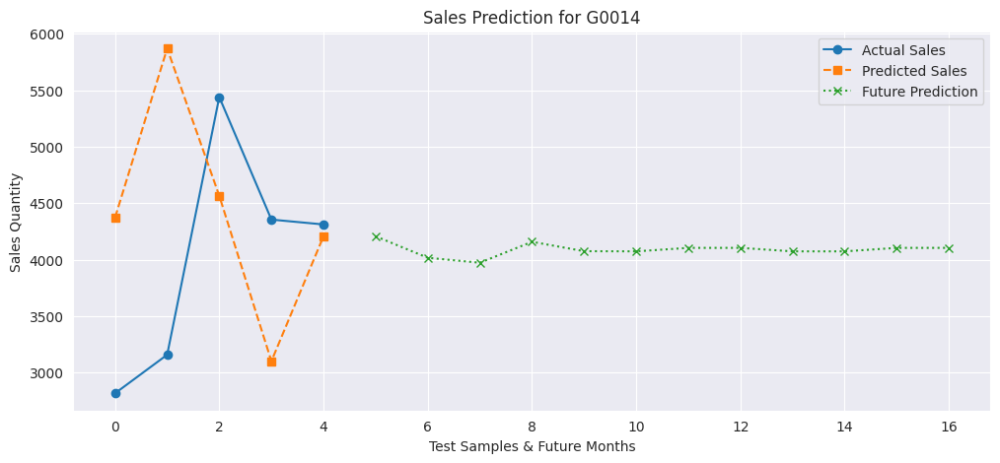

🚀 Training model for G0015...
✅ Accuracy for G0015: 86.26 %
📉 RMSE for G0015: 661.48


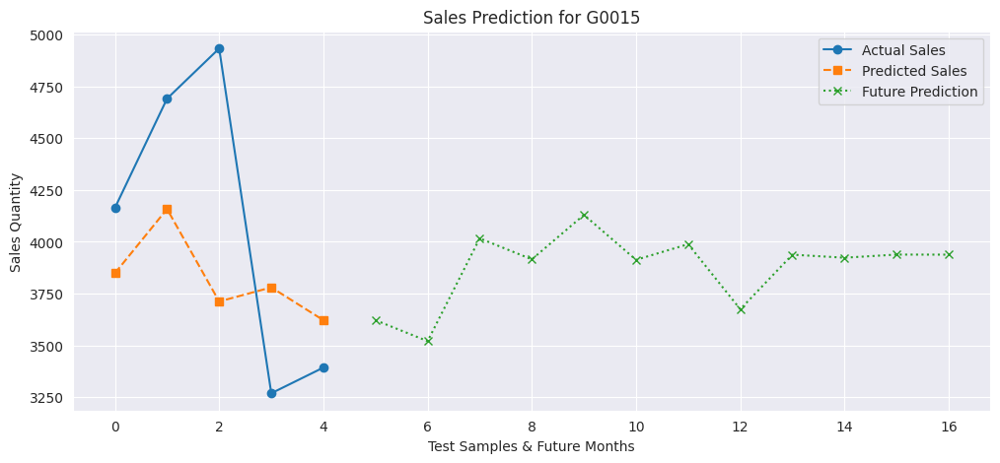

🚀 Training model for G0016...
✅ Accuracy for G0016: 90.37 %
📉 RMSE for G0016: 587.35


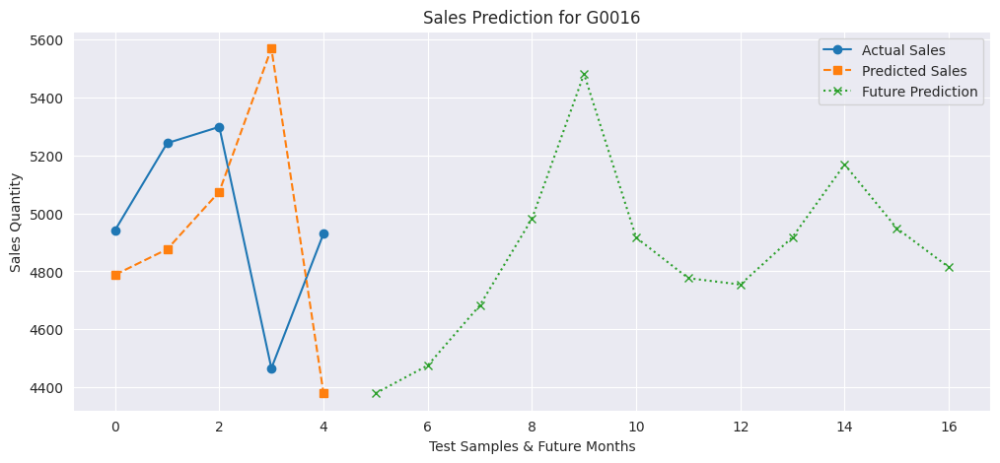

🚀 Training model for G0017...
✅ Accuracy for G0017: 80.05 %
📉 RMSE for G0017: 887.54


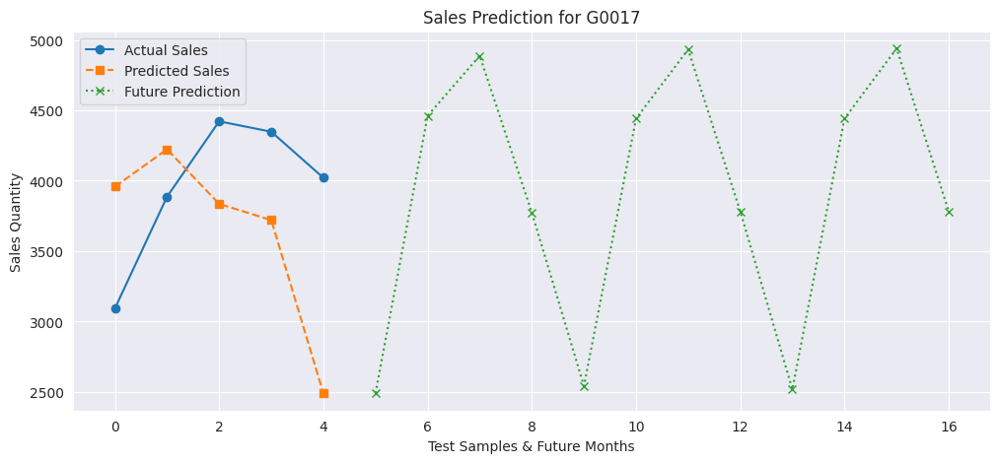

🚀 Training model for G0018...
✅ Accuracy for G0018: 86.36 %
📉 RMSE for G0018: 656.51


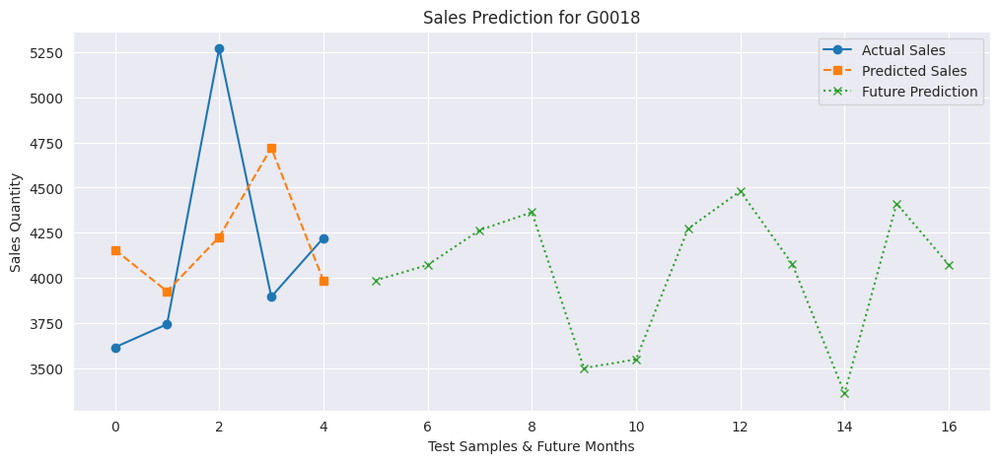

🚀 Training model for G0019...
✅ Accuracy for G0019: 92.7 %
📉 RMSE for G0019: 431.75


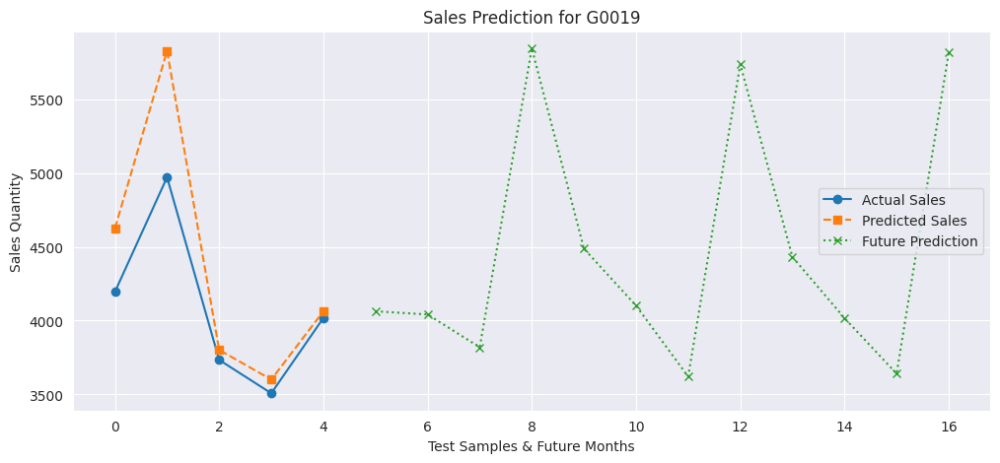

🚀 Training model for G0020...
✅ Accuracy for G0020: 62.03 %
📉 RMSE for G0020: 1405.2


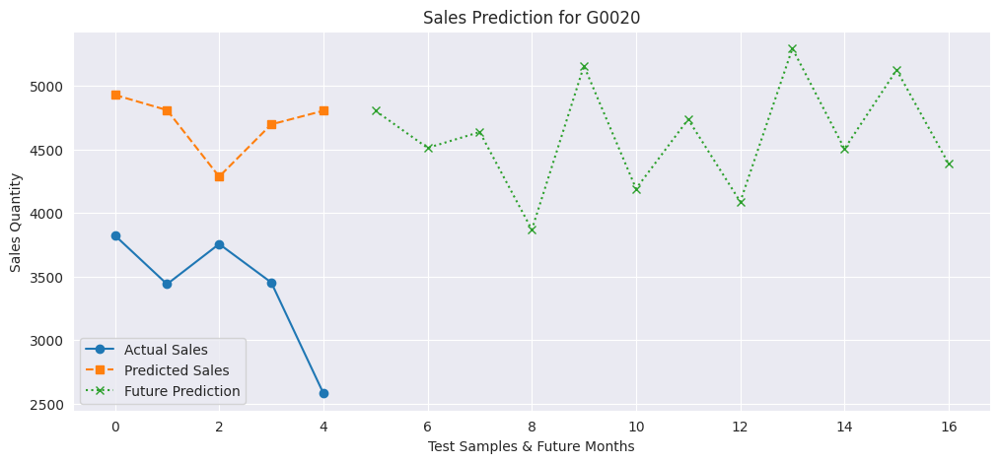

🚀 Training model for T0001...
✅ Accuracy for T0001: 73.93 %
📉 RMSE for T0001: 1458.65


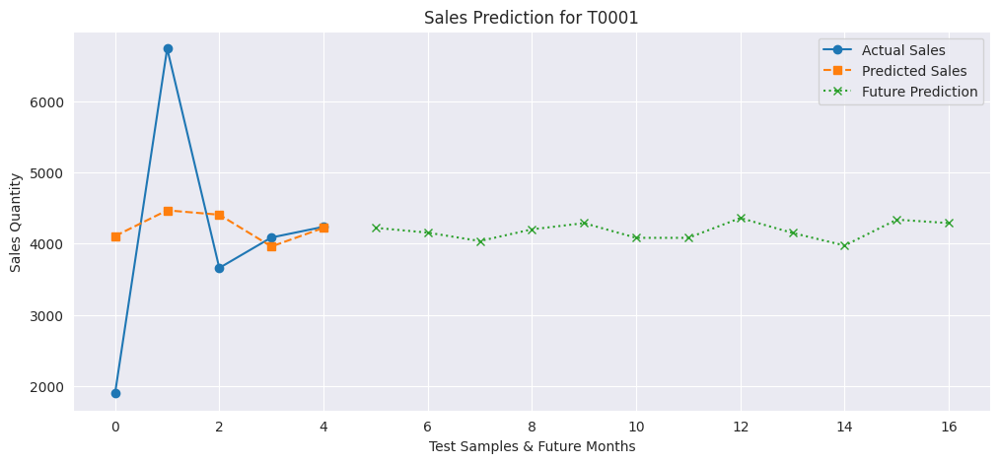

🚀 Training model for T0002...
✅ Accuracy for T0002: 83.8 %
📉 RMSE for T0002: 795.96


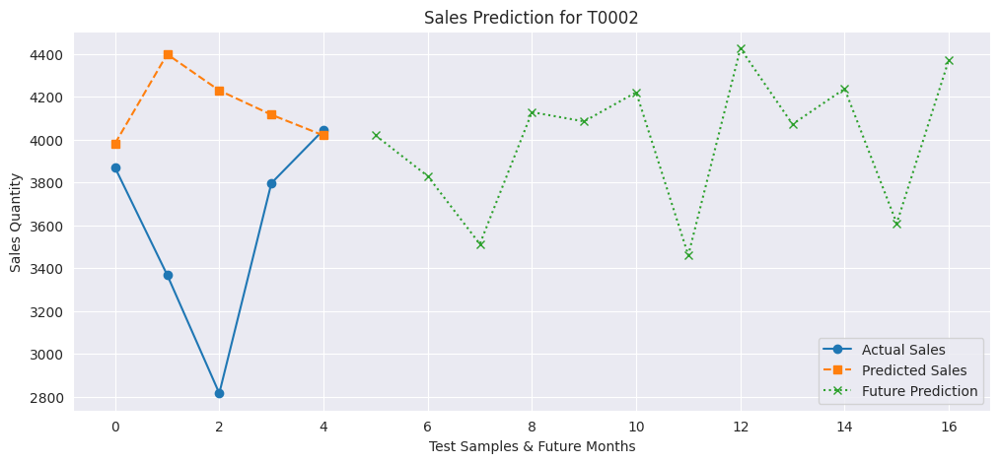

🚀 Training model for T0003...
✅ Accuracy for T0003: 86.9 %
📉 RMSE for T0003: 646.12


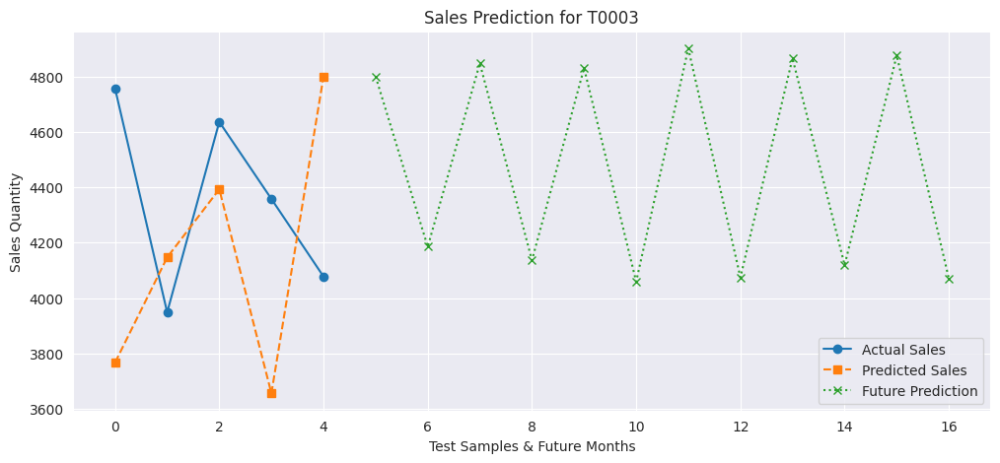

🚀 Training model for T0004...
✅ Accuracy for T0004: 86.82 %
📉 RMSE for T0004: 751.34


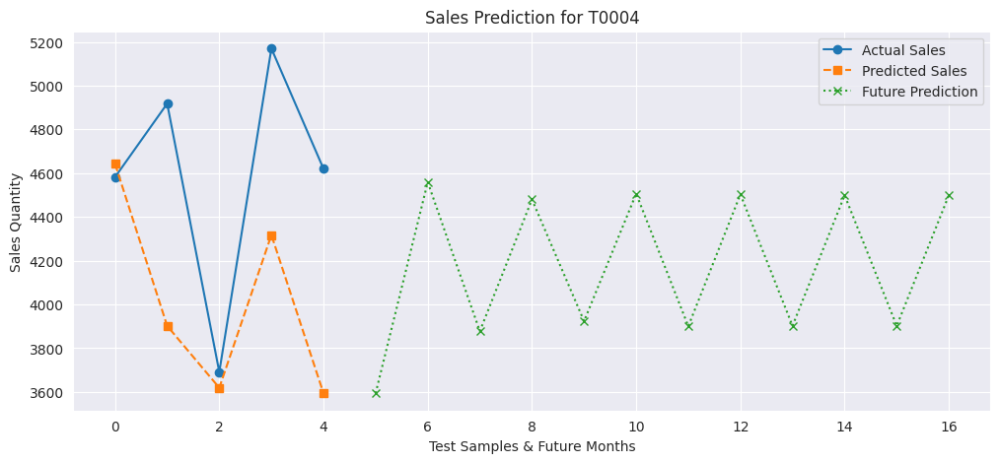

🚀 Training model for T0005...
✅ Accuracy for T0005: 87.16 %
📉 RMSE for T0005: 687.89


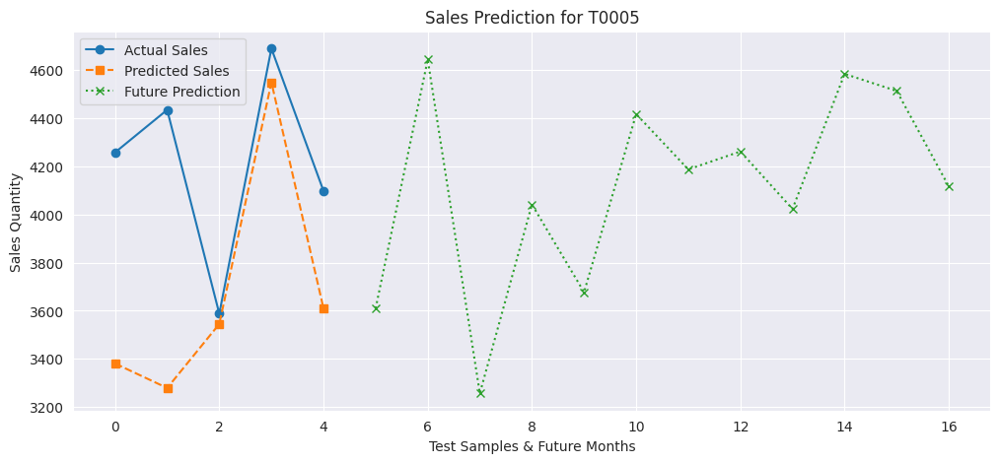

🚀 Training model for T0006...
✅ Accuracy for T0006: 72.99 %
📉 RMSE for T0006: 1285.33


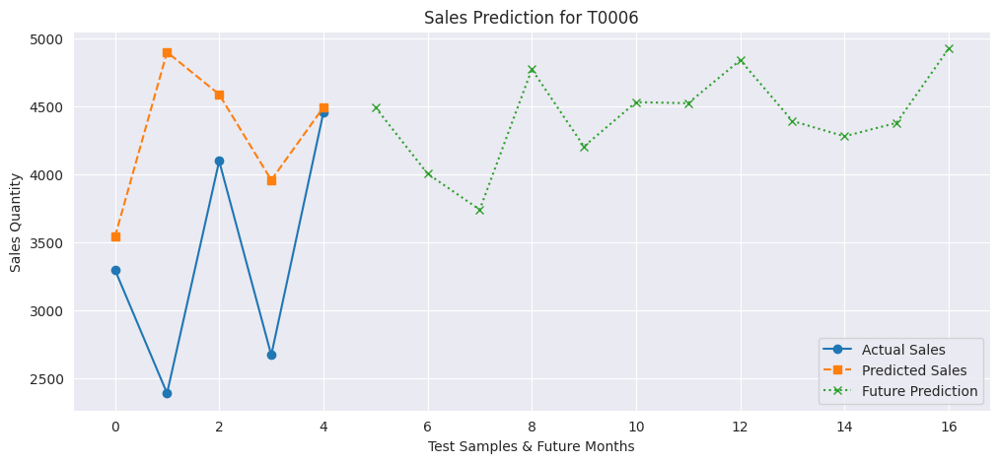

🚀 Training model for T0007...
✅ Accuracy for T0007: 58.55 %
📉 RMSE for T0007: 1747.93


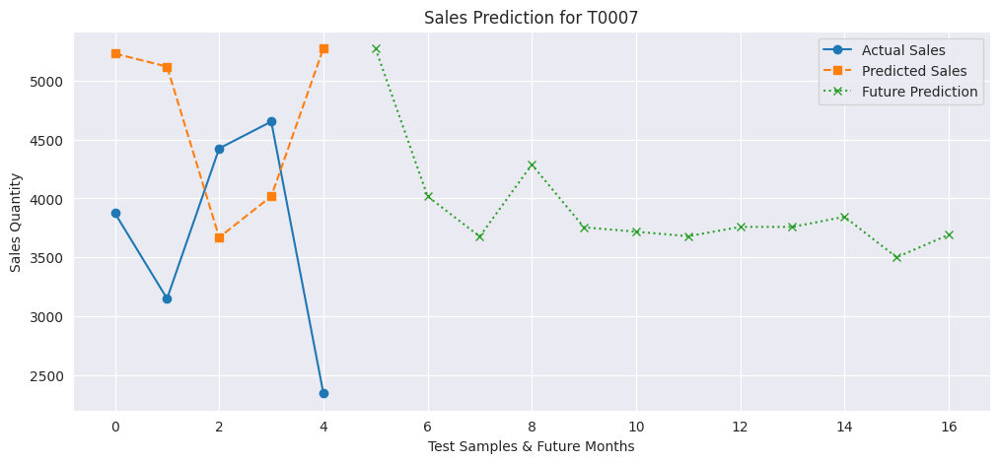

🚀 Training model for T0008...
✅ Accuracy for T0008: 83.08 %
📉 RMSE for T0008: 898.61


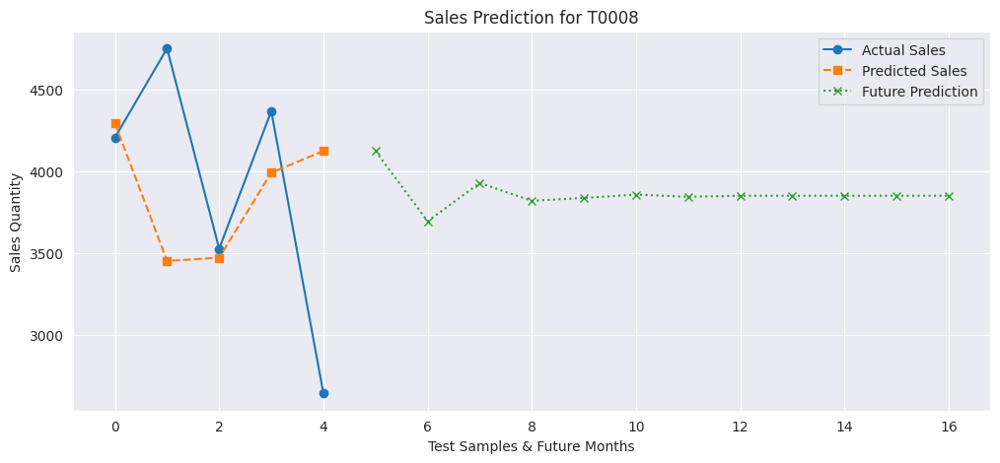

🚀 Training model for T0009...
✅ Accuracy for T0009: 68.14 %
📉 RMSE for T0009: 1502.92


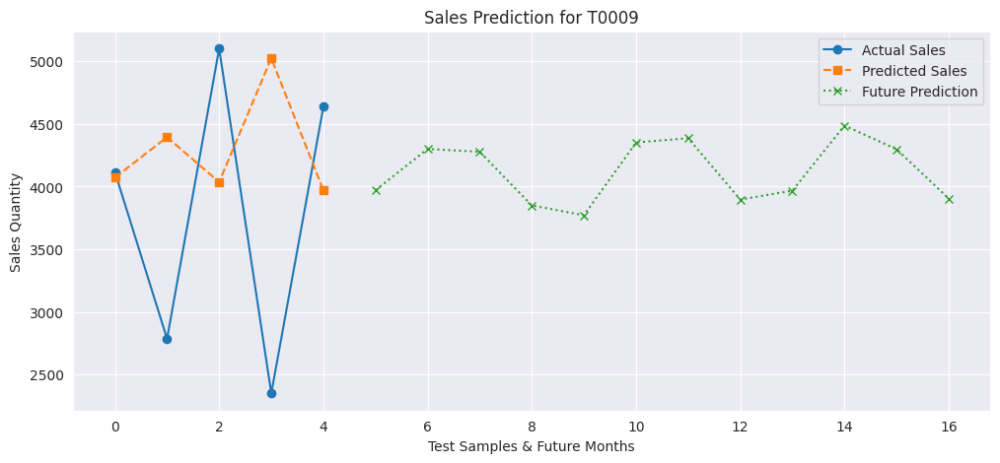

🚀 Training model for T0010...
✅ Accuracy for T0010: 92.8 %
📉 RMSE for T0010: 345.03


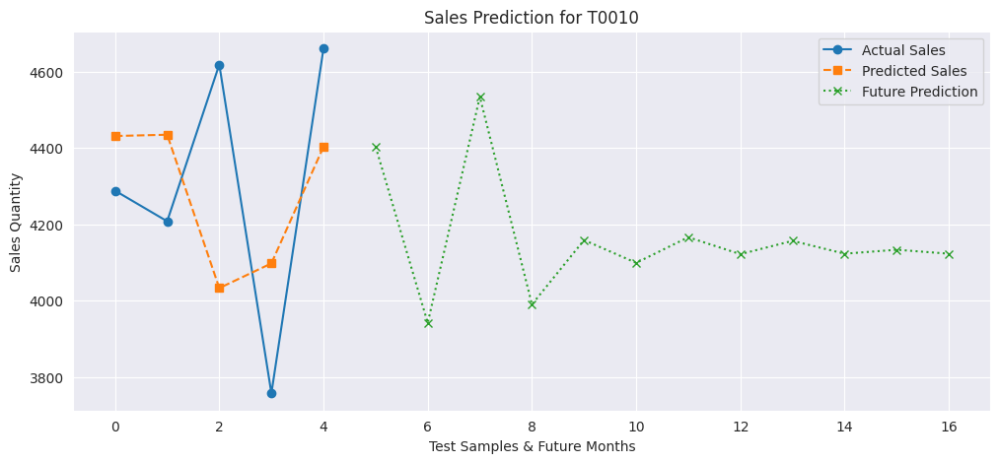

🚀 Training model for T0011...
✅ Accuracy for T0011: 89.58 %
📉 RMSE for T0011: 483.79


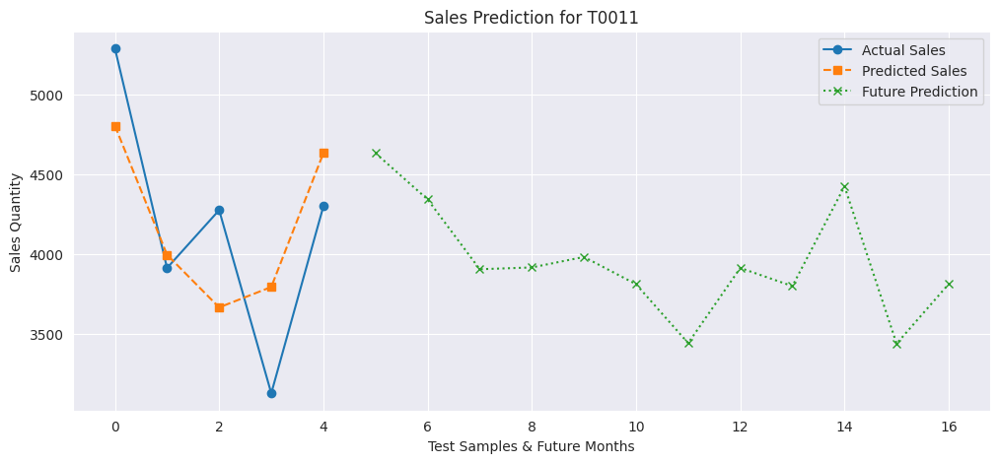

🚀 Training model for T0012...
✅ Accuracy for T0012: 74.71 %
📉 RMSE for T0012: 1334.4


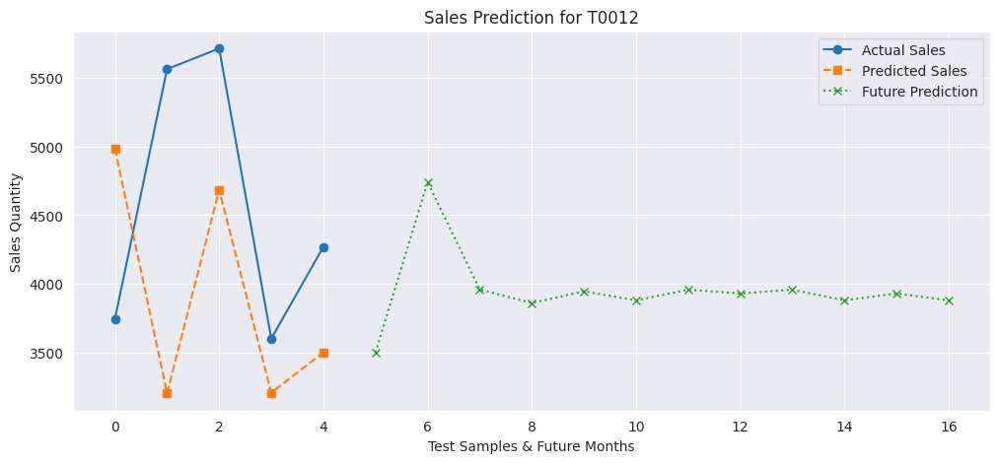

🚀 Training model for T0013...
✅ Accuracy for T0013: 82.71 %
📉 RMSE for T0013: 821.96


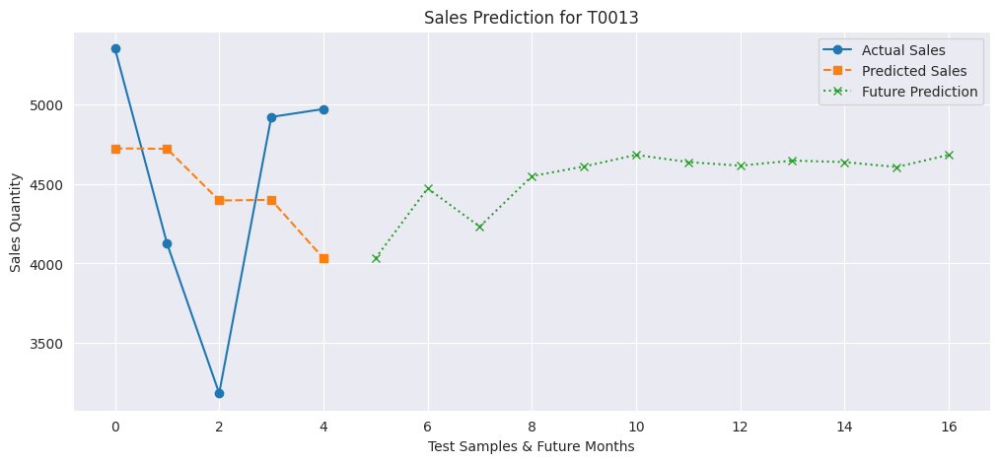

🚀 Training model for T0014...
✅ Accuracy for T0014: 74.26 %
📉 RMSE for T0014: 1407.74


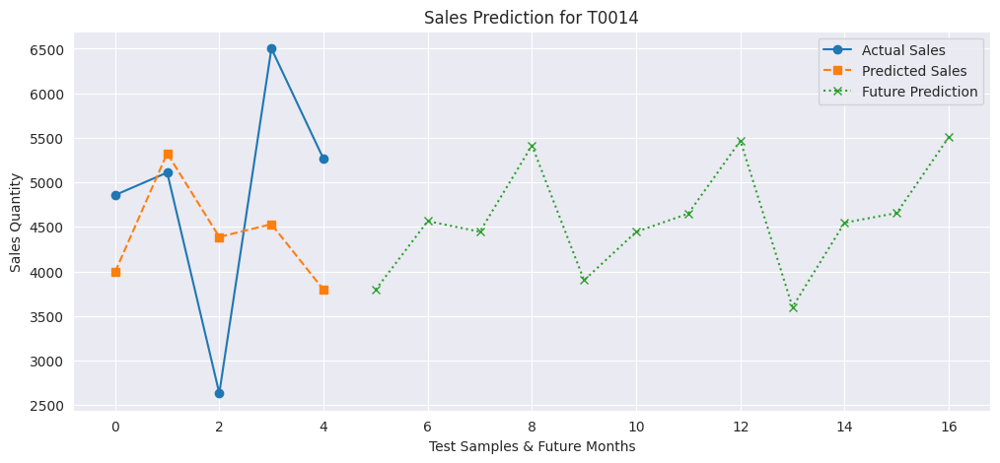

🚀 Training model for T0015...
✅ Accuracy for T0015: 77.71 %
📉 RMSE for T0015: 994.68


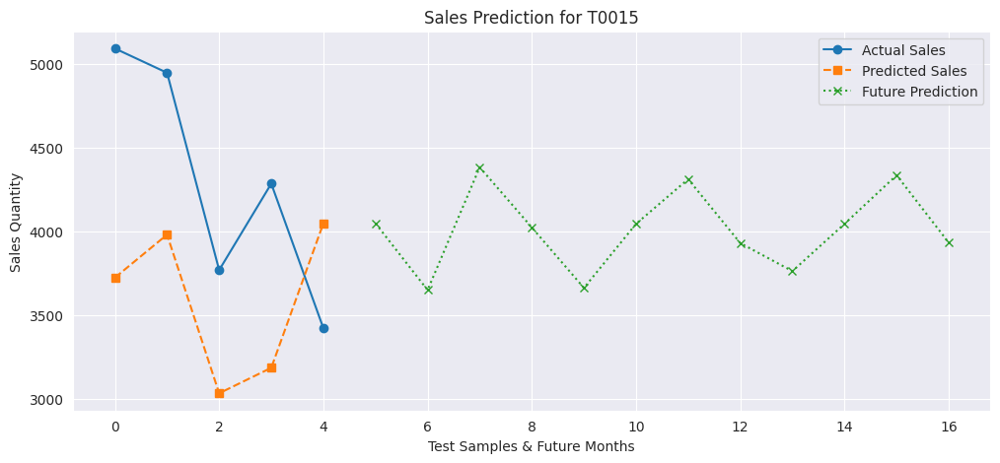

🚀 Training model for T0016...
✅ Accuracy for T0016: 78.29 %
📉 RMSE for T0016: 1175.54


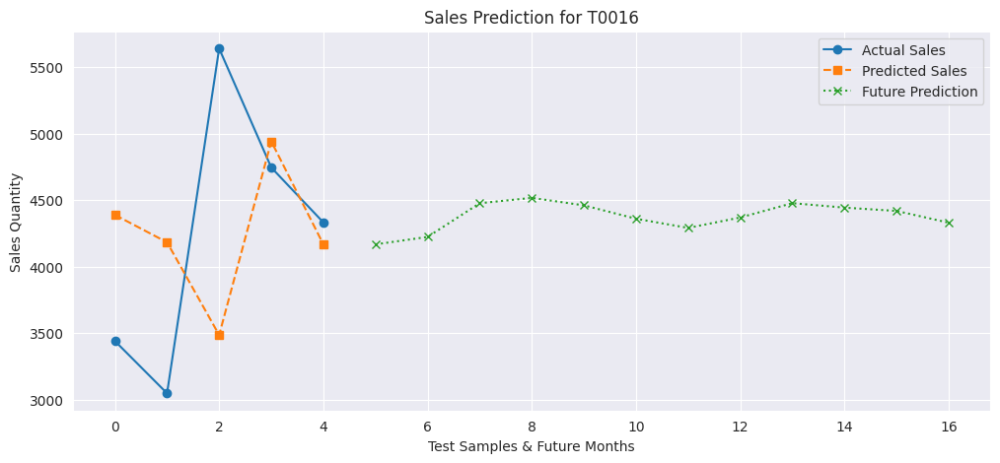

🚀 Training model for T0017...
✅ Accuracy for T0017: 75.89 %
📉 RMSE for T0017: 1056.87


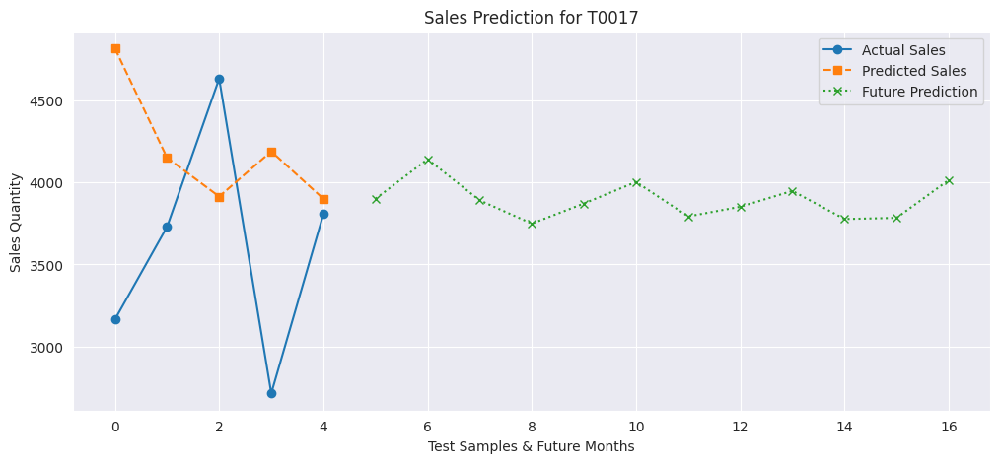

🚀 Training model for T0018...
✅ Accuracy for T0018: 74.83 %
📉 RMSE for T0018: 1022.6


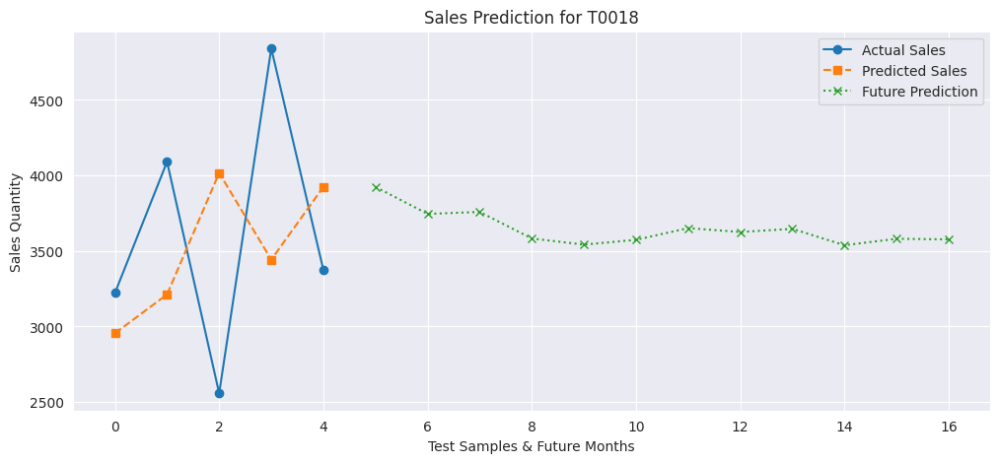

🚀 Training model for T0019...
✅ Accuracy for T0019: 76.24 %
📉 RMSE for T0019: 1046.22


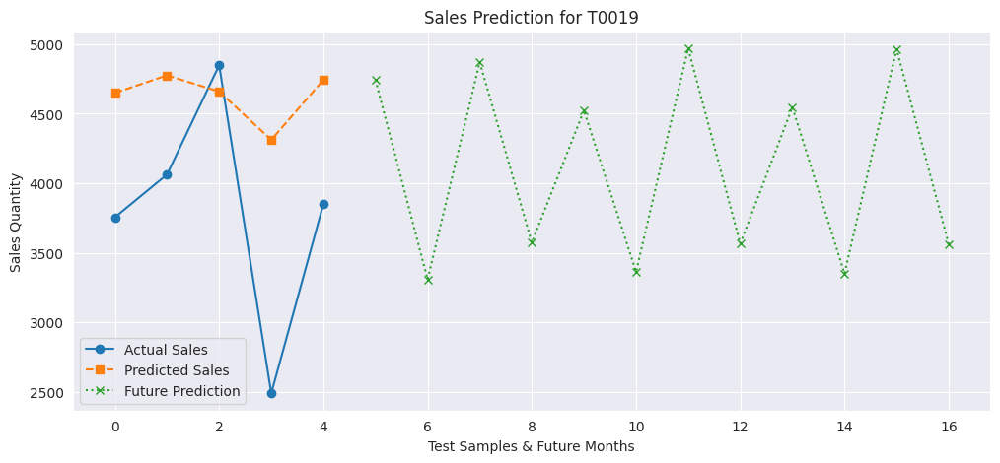

🚀 Training model for T0020...
✅ Accuracy for T0020: 85.94 %
📉 RMSE for T0020: 702.44


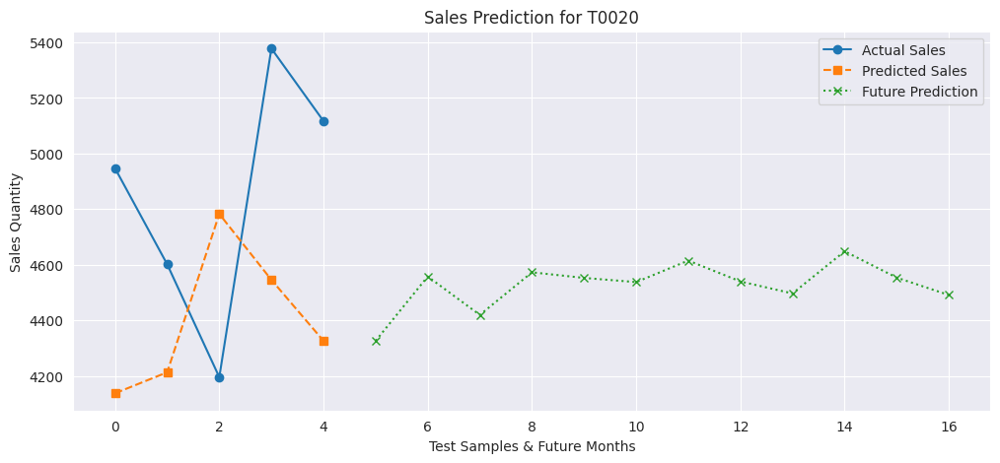


🔮 Future predictions for C0001:
Tháng 1: 4139.28
Tháng 2: 2993.12
Tháng 3: 4726.5
Tháng 4: 4755.5
Tháng 5: 4154.66
Tháng 6: 2990.06
Tháng 7: 4064.06
Tháng 8: 4719.54
Tháng 9: 4154.66
Tháng 10: 2948.67
Tháng 11: 4141.1
Tháng 12: 4729.94

🔮 Future predictions for C0002:
Tháng 1: 4574.17
Tháng 2: 3645.26
Tháng 3: 5122.24
Tháng 4: 3659.33
Tháng 5: 4548.41
Tháng 6: 3756.96
Tháng 7: 5179.22
Tháng 8: 3721.91
Tháng 9: 4454.3
Tháng 10: 3859.6
Tháng 11: 5116.66
Tháng 12: 3796.99

🔮 Future predictions for C0003:
Tháng 1: 4517.29
Tháng 2: 4672.72
Tháng 3: 4077.57
Tháng 4: 3890.94
Tháng 5: 4258.5
Tháng 6: 4436.4
Tháng 7: 4747.91
Tháng 8: 3919.95
Tháng 9: 3859.09
Tháng 10: 4257.32
Tháng 11: 4787.34
Tháng 12: 4746.05

🔮 Future predictions for C0004:
Tháng 1: 4278.99
Tháng 2: 4322.65
Tháng 3: 4050.61
Tháng 4: 3856.52
Tháng 5: 3712.77
Tháng 6: 3570.57
Tháng 7: 3624.0
Tháng 8: 3571.51
Tháng 9: 4028.22
Tháng 10: 3588.52
Tháng 11: 4047.6
Tháng 12: 3472.93

🔮 Future predictions for C0005:
Tháng 1: 4197.36

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error

# Dictionary chứa DataFrame của từng Product ID
# Dictionary lưu kết quả cho từng sản phẩm
results = {}

# Duyệt qua từng Product ID để train và dự báo
num_months_to_predict = 12  # Số tháng cần dự báo

for product_id, finaldf in product_dfs.items():
    print(f"🚀 Training model for {product_id}...")

    # Chia dữ liệu train-test (20% cuối làm test)
    test_length = int(0.1 * len(finaldf))
    end_point = len(finaldf)
    x = end_point - test_length

    finaldf_train = finaldf.loc[:x - 1, :]
    finaldf_test = finaldf.loc[x:, :]

    finaldf_train_x = finaldf_train.loc[:, finaldf_train.columns != 'Sales_Quantity']
    finaldf_train_y = finaldf_train['Sales_Quantity']
    finaldf_test_x = finaldf_test.loc[:, finaldf_test.columns != 'Sales_Quantity']
    finaldf_test_y = finaldf_test['Sales_Quantity']

    # Chuyển tên cột thành string (tránh lỗi)
    finaldf_train_x.columns = finaldf_train_x.columns.astype(str)
    finaldf_test_x.columns = finaldf_test_x.columns.astype(str)

    # 🔹 Khởi tạo mô hình Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=1)

    # 🔹 RFE chọn 4 đặc trưng quan trọng
    rfe = RFE(estimator=rf, n_features_to_select=4)
    fit = rfe.fit(finaldf_train_x, finaldf_train_y)

    # 🔹 Dự đoán trên tập test
    y_pred = fit.predict(finaldf_test_x)
    y_true = np.array(finaldf_test_y)

    # 🔹 Đánh giá mô hình
    sumvalue = np.sum(y_true)
    mape = np.sum(np.abs((y_true - y_pred))) / sumvalue * 100
    accuracy = 100 - mape

    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    print(f'✅ Accuracy for {product_id}:', round(accuracy, 2), '%')
    print(f'📉 RMSE for {product_id}:', round(rmse, 2))

    # 🔹 Dự báo 12 tháng tiếp theo
    future_predictions = []
    last_row = finaldf_test_x.iloc[-1].copy()
    last_row = last_row.loc[~last_row.index.duplicated()]  # Xử lý index trùng

    for i in range(num_months_to_predict):
        future_row = last_row.copy()

        # Dự đoán giá trị tiếp theo
        future_prediction = fit.predict(pd.DataFrame([future_row]))[0]
        future_predictions.append(future_prediction)

        # Cập nhật các biến lagged
        future_row["Quantity_3Monthsback"] = future_row["Quantity_2Monthsback"]
        future_row["Quantity_2Monthsback"] = future_row["Quantity_LastMonth"]
        future_row["Quantity_LastMonth"] = future_prediction

        # Cập nhật dummy variables cho tháng tiếp theo
        month_idx = future_row[["Month_1", "Month_2", "Month_3", "Month_4", "Month_5",
                                "Month_6", "Month_7", "Month_8", "Month_9", "Month_10",
                                "Month_11", "Month_12"]].values.argmax()

        future_row.iloc[5:17] = False  # Đặt tất cả thành False
        future_row.iloc[5 + (month_idx + 1) % 12] = True  # Đánh dấu tháng tiếp theo là True

        # Cập nhật last_row cho lần lặp tiếp theo
        last_row = future_row

    # Lưu kết quả dự báo
    results[product_id] = {
        "accuracy": accuracy,
        "rmse": rmse,
        "y_true": y_true,
        "y_pred": y_pred,
        "future_predictions": future_predictions
    }

    # 🔹 Vẽ biểu đồ
    plt.figure(figsize=(12, 5))
    plt.plot(y_true, label="Actual Sales", marker='o')
    plt.plot(y_pred, label="Predicted Sales", marker='s', linestyle='dashed')
    plt.plot(range(len(y_true), len(y_true) + num_months_to_predict), future_predictions,
             label="Future Prediction", marker='x', linestyle='dotted')

    plt.xlabel("Test Samples & Future Months")
    plt.ylabel("Sales Quantity")
    plt.title(f"Sales Prediction for {product_id}")
    plt.legend()
    plt.grid(True)
    plt.show()

# In kết quả dự báo cho từng sản phẩm
for product_id, data in results.items():
    print(f"\n🔮 Future predictions for {product_id}:")
    for i, pred in enumerate(data["future_predictions"], 1):
        print(f"Tháng {i}: {round(pred, 2)}")


In [ ]:
import pandas as pd

# Tạo danh sách lưu trữ dữ liệu từ tất cả các sản phẩm
df_combined = []

# Số tháng dự báo
num_months_to_predict = 12

for product_id, data in results.items():
    # Dữ liệu thực tế
    df_actual = pd.DataFrame({
        "product_id": product_id,
        "time_index": list(range(len(data["y_true"]))),
        "sales_quantity": data["y_true"],
        "sales_type": "Actual Sales"
    })

    # Dữ liệu dự báo trên tập test
    df_predicted = pd.DataFrame({
        "product_id": product_id,
        "time_index": list(range(len(data["y_true"]))),
        "sales_quantity": data["y_pred"],
        "sales_type": "Predicted Sales"
    })

    # Dữ liệu dự báo 12 tháng tiếp theo
    df_future = pd.DataFrame({
        "product_id": product_id,
        "time_index": list(range(len(data["y_true"]), len(data["y_true"]) + num_months_to_predict)),
        "sales_quantity": data["future_predictions"],
        "sales_type": "Future Prediction"
    })

    # Gộp dữ liệu của sản phẩm hiện tại
    df_combined.extend([df_actual, df_predicted, df_future])

# Kết hợp tất cả sản phẩm thành một DataFrame
df_combined = pd.concat(df_combined, ignore_index=True)

# Xuất ra file CSV để sử dụng trong Power BI
df_combined.to_csv("sales_forecast_powerbi.csv", index=False)

print("✅ File 'sales_forecast_powerbi.csv' đã được tạo thành công!")


In [ ]:
import pandas as pd

# Tạo DataFrame chứa dự báo cho tất cả sản phẩm
future_df = pd.DataFrame()

for product_id, data in results.items():
    temp_df = pd.DataFrame({
        "Product_ID": product_id,
        "Month": [f"Tháng {i}" for i in range(1, num_months_to_predict + 1)],
        "Predicted_Sales": data["future_predictions"]
    })
    future_df = pd.concat([future_df, temp_df], ignore_index=True)

# Xuất DataFrame ra file CSV
future_df.to_csv("future_predictions.csv", index=False)

# Hiển thị DataFrame
print(future_df.head(20))  # Hiển thị 20 dòng đầu


   Product_ID     Month  Predicted_Sales
0       C0001   Tháng 1          4139.28
1       C0001   Tháng 2          2993.12
2       C0001   Tháng 3          4726.50
3       C0001   Tháng 4          4755.50
4       C0001   Tháng 5          4154.66
5       C0001   Tháng 6          2990.06
6       C0001   Tháng 7          4064.06
7       C0001   Tháng 8          4719.54
8       C0001   Tháng 9          4154.66
9       C0001  Tháng 10          2948.67
10      C0001  Tháng 11          4141.10
11      C0001  Tháng 12          4729.94
12      C0002   Tháng 1          4574.17
13      C0002   Tháng 2          3645.26
14      C0002   Tháng 3          5122.24
15      C0002   Tháng 4          3659.33
16      C0002   Tháng 5          4548.41
17      C0002   Tháng 6          3756.96
18      C0002   Tháng 7          5179.22
19      C0002   Tháng 8          3721.91


In [ ]:
import pandas as pd

# Mapping chữ cái đầu thành Category
category_mapping = {
    'G': 'Groceries',
    'T': 'Toys',
    'E': 'Electronics',
    'F': 'Furniture',
    'C': 'Clothing'
}

# Tạo cột "Category" dựa trên chữ cái đầu của Product_ID
future_df["Category"] = future_df["Product_ID"].str[0].map(category_mapping)

# Kiểm tra nếu có Product_ID không thuộc nhóm trên
future_df["Category"] = future_df["Category"].fillna("Unknown")

# Hiển thị kết quả
print(future_df[["Product_ID", "Category"]].head())

  Product_ID  Category
0      C0001  Clothing
1      C0001  Clothing
2      C0001  Clothing
3      C0001  Clothing
4      C0001  Clothing


In [ ]:
future_df

,Product_ID,Month,Predicted_Sales,Category
0,C0001,Tháng 1,4139.28,Clothing
1,C0001,Tháng 2,2993.12,Clothing
2,C0001,Tháng 3,4726.50,Clothing
3,C0001,Tháng 4,4755.50,Clothing
4,C0001,Tháng 5,4154.66,Clothing
...,...,...,...,...
1195,T0020,Tháng 8,4540.08,Toys
1196,T0020,Tháng 9,4497.04,Toys
1197,T0020,Tháng 10,4648.60,Toys
1198,T0020,Tháng 11,4553.98,Toys


In [ ]:
import pandas as pd

# Tính tổng Sales_Quantity của từng Product_ID trong từng Category
df_abc = future_df.groupby(["Category", "Product_ID"])["Predicted_Sales"].sum().reset_index()

# Tính tổng doanh số từng Category
df_abc["Total_Category_Sales"] = df_abc.groupby("Category")["Predicted_Sales"].transform("sum")

# Tính tỷ trọng đóng góp của từng Product_ID trong Category
df_abc["Sales_Percentage"] = df_abc["Predicted_Sales"] / df_abc["Total_Category_Sales"] * 100

# Sắp xếp theo Category và Sales_Quantity giảm dần
df_abc = df_abc.sort_values(by=["Category", "Predicted_Sales"], ascending=[True, False])

# Tính tỷ trọng tích lũy (Cumulative Percentage) trong từng Category
df_abc["Cumulative_Percentage"] = df_abc.groupby("Category")["Sales_Percentage"].cumsum()

# Phân loại ABC dựa vào Cumulative_Percentage
def classify_abc(cum_perc):
    if cum_perc <= 70:
        return "A"
    elif cum_perc <= 90:
        return "B"
    else:
        return "C"

df_abc["ABC_Class"] = df_abc["Cumulative_Percentage"].apply(classify_abc)

# Xuất kết quả ra file CSV
df_abc.to_csv("ABC_AnalysisperCategory.csv", index=False)
print("✔ ABC Analysis đã được lưu vào 'ABC_Analysis_per_Category.csv'")

# Hiển thị kết quả
print(df_abc.head(10))

✔ ABC Analysis đã được lưu vào 'ABC_Analysis_per_Category.csv'
    Category Product_ID  Predicted_Sales  Total_Category_Sales  \
8   Clothing      C0009         57056.28            1014223.61   
7   Clothing      C0008         54574.29            1014223.61   
14  Clothing      C0015         53782.58            1014223.61   
18  Clothing      C0019         53616.15            1014223.61   
16  Clothing      C0017         53192.18            1014223.61   
6   Clothing      C0007         52878.97            1014223.61   
11  Clothing      C0012         52545.21            1014223.61   
10  Clothing      C0011         52379.43            1014223.61   
2   Clothing      C0003         52171.08            1014223.61   
13  Clothing      C0014         51604.95            1014223.61   

    Sales_Percentage  Cumulative_Percentage ABC_Class  
8           5.625611               5.625611         A  
7           5.380893              11.006505         A  
14          5.302833              16.30933